# GPT-2 Adoption

Code from https://github.com/graykode/gpt-2-Pytorch

In [1]:
import copy
import torch
import math
import torch.nn as nn
from torch.nn.parameter import Parameter


In [2]:
import random
import numpy as np

# Reproducibility
seed = random.randint(0, 2147483647)
np.random.seed(seed)
torch.random.manual_seed(seed)
torch.cuda.manual_seed(seed)

# GPU or CPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

#### 
# GPTConfig - HuggingFace style

In [3]:
class GPT2Config(object):
    def __init__(
            self,
            vocab_size_or_config_json_file=50257,
            n_positions=1024,
            n_ctx=1024,
            n_embd=768,
            n_layer=12,
            n_head=12,
            layer_norm_epsilon=1e-5,
            initializer_range=0.02,
            pdrop=0.1,
    ):
        self.vocab_size = vocab_size_or_config_json_file
        self.n_ctx = n_ctx
        self.n_positions = n_positions
        self.n_embd = n_embd
        self.n_layer = n_layer
        self.n_head = n_head
        self.layer_norm_epsilon = layer_norm_epsilon
        self.initializer_range = initializer_range
        self.pdrop = pdrop

#### 
# Wandb managing experiments

In [4]:
import wandb
wandb.init(project="PACT-replica", entity="tst008")
!wandb on

wandb: Currently logged in as: tst008 (use `wandb login --relogin` to force relogin)


W&B online, running your script from this directory will now sync to the cloud.


#### 
# Creating Model

Layer Norm: $y = \frac{x-E[x]}{\sqrt{Var[x] + \epsilon}} * \gamma + \beta$

- Where x is a mini-batch of input, with dimension `normalized_shape`.
- $\gamma$ and $\beta$ are $\textit{learnable}$ affine transform parameters

In [5]:
class LayerNorm(nn.Module):
    def __init__(self, hidden_size, eps=1e-12):
        """Construct a layernorm module in the TF style (epsilon inside the square root).
        """
        super(LayerNorm, self).__init__()
        self.weight = nn.Parameter(torch.ones(hidden_size))
        self.bias = nn.Parameter(torch.zeros(hidden_size))
        self.variance_epsilon = eps

    def forward(self, x):
        u = x.mean(-1, keepdim=True)
        s = (x - u).pow(2).mean(-1, keepdim=True)
        x = (x - u) / torch.sqrt(s + self.variance_epsilon)
        return self.weight * x + self.bias

In [6]:
batch, sentence_length, embedding_dim = 20, 5, 10
embedding = torch.randn(batch, sentence_length, embedding_dim)
layer_norm = LayerNorm(embedding_dim)
layer_norm(embedding).shape

torch.Size([20, 5, 10])

- Input: $N, C, L$, Output: $N, C, L_o$

$out(N, C_j) =  bias(C_j) + \sum^{C_i - 1}_{k=1}w(C_j, k) * inp(N_i, k)$

In [7]:
class Conv1D(nn.Module):
    def __init__(self, nf, nx):
        super(Conv1D, self).__init__()
        self.nf = nf
        self.nx = nx
        w = torch.empty(nx, nf)
        nn.init.normal_(w, std=0.02)
        self.weight = Parameter(w)
        self.bias = Parameter(torch.zeros(nf))

    def forward(self, x):
        assert self.nx == x.shape[-1], f"Shape mismatched, expected shape: {list(x.shape[:-1])+[self.nx]}, got shape: {list(x.shape)}"
        size_out = x.size()[:-1] + (self.nf,)
        x = torch.addmm(self.bias, x.view(-1, x.size(-1)), self.weight)
        x = x.view(*size_out)
        return x

In [8]:
m = Conv1D(10, 50)
i = torch.randn(20, 16, 50)
m(i).shape

torch.Size([20, 16, 10])

Applies multi-head attention 

- Query: representation of current word used to score against other words
- Key: labels for all potentially relevant words in segment
- Value: Actual word representations. Relevancy of each word is added up to represent current word

Input size, output size??
https://jalammar.github.io/illustrated-gpt2/

In [9]:
class Attention(nn.Module):
    def __init__(self, nx, n_ctx, config, scale=False):
        super(Attention, self).__init__()
        n_state = nx  # in Attention: n_state=768 (nx=n_embd)
        # [switch nx => n_state from Block to Attention to keep identical to TF implem]
        assert n_state % config.n_head == 0
        self.register_buffer("bias", torch.tril(torch.ones(n_ctx, n_ctx)).view(1, 1, n_ctx, n_ctx))
        self.n_head = config.n_head
        self.split_size = n_state
        self.scale = scale
        self.c_attn = Conv1D(n_state * 3, nx)
        self.c_proj = Conv1D(n_state, nx)
        self.attn_drop = nn.Dropout(config.pdrop, inplace=False)
        self.resid_drop = nn.Dropout(config.pdrop, inplace=False)

    def _attn(self, q, k, v):
        w = torch.matmul(q, k)
        if self.scale:
            w = w / math.sqrt(v.size(-1))
        nd, ns = w.size(-2), w.size(-1)
        try:
            b = self.bias[:, :, ns-nd:ns, :ns]
            w = w * b - 1e10 * (1 - b)
            w = nn.Softmax(dim=-1)(w)
        except:
            print(b.shape, w.shape)
            raise
        return w, torch.matmul(w, v)

    def merge_heads(self, x):
        x = x.permute(0, 2, 1, 3).contiguous()
        new_x_shape = x.size()[:-2] + (x.size(-2) * x.size(-1),)
        return x.view(*new_x_shape)  # in Tensorflow implem: fct merge_states

    def split_heads(self, x, k=False):
        new_x_shape = x.size()[:-1] + (self.n_head, x.size(-1) // self.n_head)
        x = x.view(*new_x_shape)  # in Tensorflow implem: fct split_states
        if k:
            return x.permute(0, 2, 3, 1)  # (batch, head, head_features, seq_length)
        else:
            return x.permute(0, 2, 1, 3)  # (batch, head, seq_length, head_features)

    def forward(self, x, layer_past=None):
        # Begin by looking at the shape of all these
#         print(f"x:{x.shape}")
        x = self.c_attn(x)
#         print(f"(after c_attn) x:{x.shape}")
        query, key, value = x.split(self.split_size, dim=2)
#         print(f"query:{query.shape}, key:{key.shape}, value:{value.shape},")
        query = self.split_heads(query)
        key = self.split_heads(key, k=True)
        value = self.split_heads(value)
#         print(f"(after split_heads()) query:{query.shape}, key:{key.shape}, value:{value.shape},")
        if layer_past is not None:
            past_key, past_value = layer_past[0].transpose(-2, -1), layer_past[1]  # transpose back cf below
            key = torch.cat((past_key, key), dim=-1)
            value = torch.cat((past_value, value), dim=-2)
#             print(f"(in if layer_past is not None) query:{query.shape}, key:{key.shape}, value:{value.shape},")
        present = torch.stack((key.transpose(-2, -1), value))  # transpose to have same shapes for stacking
#         print(f"present:{present.shape}")
        w, a = self._attn(query, key, value)
#         print(f"(output of _attn) a:{a.shape}")
        a = self.merge_heads(a)
#         print(f"(output of merge_heads) a:{a.shape}")
        a = self.c_proj(a)
#         print(f"(output of c_proj) a:{a.shape}")
        a = self.resid_drop(a)
#         print(f"(output of resid_drop) a:{a.shape}")
        return a, present, w # Present key and values?

In [10]:
# TODO: Test Masked before softmax, 

In [11]:
w = torch.ones([1, 1, 1024, 1024]) #torch.Size([1, 12, 1760, 1760])
b = torch.ones([1, 12,])
nd, ns = w.size(-2), w.size(-1)
nd, ns

(1024, 1024)

Applies the Gaussian Error Linear Units function:
    
$y = x * \Phi(x)$

where $\Phi(x)$ is the Cumulative Distribution Function for Gaussian Distribution

... tho I'm not seeing that here

In [12]:
def gelu(x):
    return 0.5 * x * (1 + torch.tanh(math.sqrt(2 / math.pi) * (x + 0.044715 * torch.pow(x, 3))))

In [13]:
gelu(torch.randn(2))

tensor([-0.0846, -0.0756])

Conv1D(n_state, n_embd) $\implies$ gelu $\implies$ Conv1D(n_embd, n_state)  

In [14]:
class MLP(nn.Module):
    def __init__(self, n_state, config):  # in MLP: n_state=3072 (4 * n_embd)
        super(MLP, self).__init__()
        nx = config.n_embd
        self.c_fc = Conv1D(n_state, nx)
        self.c_proj = Conv1D(nx, n_state)
        self.act = gelu
        self.dropout = nn.Dropout(config.pdrop)

    def forward(self, x):
        h = self.act(self.c_fc(x))
        h2 = self.c_proj(h)
        h2 = self.dropout(h2)
        return h2

In [15]:
import argparse
config = argparse.Namespace(
    n_embd = 15,
    pdrop = .1,
)
i = torch.randn(10, 3, 15)
mlp = MLP(30, config)
mlp(i).shape

torch.Size([10, 3, 15])

Returns: 
- $x + (LN(x) \implies ATTN(x)) + MLP(x)$
- `present` the cumulative keys and values?

In [16]:
class Block(nn.Module):
    def __init__(self, n_ctx, config, scale=False):
        super(Block, self).__init__()
        nx = config.n_embd
        self.ln_1 = LayerNorm(nx, eps=config.layer_norm_epsilon)
        self.attn = Attention(nx, n_ctx, config, scale)
        self.ln_2 = LayerNorm(nx, eps=config.layer_norm_epsilon)
        self.mlp = MLP(4 * nx, config)

    def forward(self, x, layer_past=None):
        a, present, _ = self.attn(self.ln_1(x), layer_past=layer_past)
        x = x + a
        m = self.mlp(self.ln_2(x))
        x = x + m
        return x, present

In [17]:
# TODO: Test Block

Decoder-only Transformer GPT-2

In [18]:
class GPT2Model(nn.Module):
    def __init__(self, config):
        super(GPT2Model, self).__init__()
        self.n_layer = config.n_layer
        self.n_embd = config.n_embd
        self.n_vocab = config.vocab_size

        self.wte = nn.Embedding(config.vocab_size, config.n_embd)
        self.wpe = nn.Embedding(config.n_positions, config.n_embd)
        
        self.drop = nn.Dropout(config.pdrop, inplace=False)
        
        block = Block(config.n_ctx, config, scale=True)
        self.h = nn.ModuleList([copy.deepcopy(block) for _ in range(config.n_layer)])
        self.ln_f = LayerNorm(config.n_embd, 
                              eps=config.layer_norm_epsilon)

    def set_embeddings_weights(self, model_embeddings_weights):
        embed_shape = model_embeddings_weights.shape
        self.decoder = nn.Linear(embed_shape[1], embed_shape[0], bias=False)
        self.decoder.weight = model_embeddings_weights  # Tied weights

    def forward(self, input_ids, 
                position_ids=None, 
                token_type_ids=None, 
                past=None):
        if past is None:
            past_length = 0
            past = [None] * len(self.h)
        else:
            past_length = past[0][0].size(-2)
        if position_ids is None:
            position_ids = torch.arange(past_length, input_ids.size(-1) + past_length, dtype=torch.long,
                                        device=input_ids.device)
            position_ids = position_ids.unsqueeze(0).expand_as(input_ids)

        input_shape = input_ids.size()
        input_ids = input_ids.view(-1, input_ids.size(-1))
        position_ids = position_ids.view(-1, position_ids.size(-1))

        inputs_embeds = self.wte(input_ids)
        position_embeds = self.wpe(position_ids)
        if token_type_ids is not None:
            token_type_ids = token_type_ids.view(-1, token_type_ids.size(-1))
            token_type_embeds = self.wte(token_type_ids)
        else:
            token_type_embeds = 0
        hidden_states = inputs_embeds + position_embeds + token_type_embeds
        presents = []
        for block, layer_past in zip(self.h, past):
            hidden_states, present = block(hidden_states, layer_past)
            presents.append(present)
        hidden_states = self.drop(hidden_states)
        hidden_states = self.ln_f(hidden_states)
        output_shape = input_shape + (hidden_states.size(-1),)
        return hidden_states.view(*output_shape), presents

In [19]:
# TODO: Initial test

In [20]:
class GPT2LMHead(nn.Module):
    def __init__(self, model_embeddings_weights, config):
        super(GPT2LMHead, self).__init__()
        self.n_embd = config.n_embd
        self.set_embeddings_weights(model_embeddings_weights)

    def set_embeddings_weights(self, model_embeddings_weights):
        embed_shape = model_embeddings_weights.shape
        self.decoder = nn.Linear(embed_shape[1], embed_shape[0], bias=False)
        self.decoder.weight = model_embeddings_weights  # Tied weights

    def forward(self, hidden_state):
        # Truncated Language modeling logits (we remove the last token)
        # h_trunc = h[:, :-1].contiguous().view(-1, self.n_embd)
        lm_logits = self.decoder(hidden_state)
        return lm_logits

In [21]:
class GPT2LMHeadModel(nn.Module):
    def __init__(self, config):
        super(GPT2LMHeadModel, self).__init__()
        self.transformer = GPT2Model(config)
        self.lm_head = GPT2LMHead(self.transformer.wte.weight, config)

    def set_tied(self):
        """ Make sure we are sharing the embeddings
        """
        self.lm_head.set_embeddings_weights(self.transformer.wte.weight)

    def forward(self, input_ids, position_ids=None, token_type_ids=None, lm_labels=None, past=None):
        hidden_states, presents = self.transformer(input_ids, position_ids, token_type_ids, past)
        lm_logits = self.lm_head(hidden_states)
#         print_tensor(lm_logits)
        if lm_labels is not None:
            shift_logits = lm_logits[..., :-1, :].contiguous()
            shift_labels = lm_labels[..., 1:].contiguous()
            loss_fct = nn.CrossEntropyLoss()
#             loss_fct = nn.CrossEntropyLoss(ignore_index=-1)
#             loss = loss_fct(lm_logits.view(-1, lm_logits.size(-1)), lm_labels.view(-1))
#             print_tensor(shift_labels.view(-1))
#             print_tensor(shift_logits.view(-1, shift_logits.size(-1)))
            loss = loss_fct(shift_logits.view(-1, shift_logits.size(-1)), shift_labels.view(-1))
            return loss, lm_logits, presents
        return lm_logits, presents

In [22]:
def print_tensor(t):
    print(t.shape, end=",")
    print(torch.max(t), torch.min(t), torch.mean(t), end=",")
    print(torch.sum(torch.isnan(t)))

#### 
# Encoder

In [23]:
import os
import json
import regex as re
from os.path import expanduser
# from functools import lru_cache

# @lru_cache()
def bytes_to_unicode():
    """
    Returns list of utf-8 byte and a corresponding list of unicode strings.
    The reversible bpe codes work on unicode strings.
    This means you need a large # of unicode characters in your vocab if you want to avoid UNKs.
    When you're at something like a 10B token dataset you end up needing around 5K for decent coverage.
    This is a signficant percentage of your normal, say, 32K bpe vocab.
    To avoid that, we want lookup tables between utf-8 bytes and unicode strings.
    And avoids mapping to whitespace/control characters the bpe code barfs on.
    """
    bs = list(range(ord("!"), ord("~")+1))+list(range(ord("¡"), ord("¬")+1))+list(range(ord("®"), ord("ÿ")+1))
    cs = bs[:]
    n = 0
    for b in range(2**8):
        if b not in bs:
            bs.append(b)
            cs.append(2**8+n)
            n += 1
    cs = [chr(n) for n in cs]
    return dict(zip(bs, cs))

def get_pairs(word):
    """Return set of symbol pairs in a word.
    Word is represented as tuple of symbols (symbols being variable-length strings).
    """
    pairs = set()
    prev_char = word[0]
    for char in word[1:]:
        pairs.add((prev_char, char))
        prev_char = char
    return pairs

class Encoder:
    def __init__(self, encoder, bpe_merges, errors='replace'):
        self.encoder = encoder
        self.decoder = {v:k for k,v in self.encoder.items()}
        self.errors = errors # how to handle errors in decoding
        self.byte_encoder = bytes_to_unicode()
        self.byte_decoder = {v:k for k, v in self.byte_encoder.items()}
        self.bpe_ranks = dict(zip(bpe_merges, range(len(bpe_merges))))
        self.cache = {}
        self.special_tokens = []

        # Should haved added re.IGNORECASE so BPE merges can happen for capitalized versions of contractions
        self.re_pattern = r"""'s|'t|'re|'ve|'m|'ll|'d| ?\p{L}+| ?\p{N}+| ?[^\s\p{L}\p{N}]+|\s+(?!\S)|\s+"""
        self.pat = re.compile(self.re_pattern)
        
    def add_special_token(self, s):
        if s in self.special_tokens:
            print(f"Token {s} already added")
        self.special_tokens.append(s)
        if s in self.encoder: 
            # Special token already known, but regex pattern cannot capture fully yet
            pass
        else:
            id = len(self.encoder)
            self.encoder[s] = id
            self.decoder[id] = s
        s = s.replace("|", r"\|")
        self.re_pattern = " " + s + "|" + self.re_pattern
        self.pat = re.compile(self.re_pattern)

    def bpe(self, token):
        # Also don't split on special tokens
#         print(token, token in self.special_tokens)
        if token in self.special_tokens:
            return token
        if token in self.cache:
            return self.cache[token]
        word = tuple(token)
        pairs = get_pairs(word)

        if not pairs:
            return token

        while True:
            bigram = min(pairs, key = lambda pair: self.bpe_ranks.get(pair, float('inf')))
            if bigram not in self.bpe_ranks:
                break
            first, second = bigram
            new_word = []
            i = 0
            while i < len(word):
                try:
                    j = word.index(first, i)
                    new_word.extend(word[i:j])
                    i = j
                except:
                    new_word.extend(word[i:])
                    break

                if word[i] == first and i < len(word)-1 and word[i+1] == second:
                    new_word.append(first+second)
                    i += 2
                else:
                    new_word.append(word[i])
                    i += 1
            new_word = tuple(new_word)
            word = new_word
            if len(word) == 1:
                break
            else:
                pairs = get_pairs(word)
        word = ' '.join(word)
        self.cache[token] = word
        return word

    def encode(self, text):
        bpe_tokens = []
        for token in re.findall(self.pat, text):
#             print(token.lstrip())
            if token.lstrip() in self.special_tokens:
                token = token.lstrip()
            else:
                token = ''.join(self.byte_encoder[b] for b in token.encode('utf-8'))
            bpe_tokens.extend(self.encoder[bpe_token] for bpe_token in self.bpe(token).split(' '))
        return bpe_tokens

    def decode(self, tokens):
        text = ''.join([self.decoder[token] for token in tokens])
        text = bytearray([self.byte_decoder[c] for c in text]).decode('utf-8', errors=self.errors)
        return text

def get_encoder():
    home = expanduser("~")
    with open(os.path.join(home, 'data/GPT2/encoder.json'), 'r') as f:
        encoder = json.load(f)
    with open(os.path.join(home, 'data/GPT2/vocab.bpe'), 'r', encoding="utf-8") as f:
        bpe_data = f.read()
    bpe_merges = [tuple(merge_str.split()) for merge_str in bpe_data.split('\n')[1:-1]]
    enc = Encoder(
        encoder=encoder,
        bpe_merges=bpe_merges,
    )
#     print("<|endoftext|>" in enc.encoder)
    enc.add_special_token("<|endoftext|>")
    enc.add_special_token("<|GOAL|>")
    enc.add_special_token("<|PROOFSTEP|>")
    print(enc.special_tokens)
    return enc

#### 
# Sampling a sequence

In [24]:
import torch
import torch.nn.functional as F
from tqdm import trange

def top_k_logits(logits, k):
    if k == 0:
        return logits
    values, _ = torch.topk(logits, k)
    min_values = values[:, -1]
    return torch.where(logits < min_values, torch.ones_like(logits, dtype=logits.dtype) * -1e10, logits)

def sample_sequence(model, length, start_token=None, batch_size=None, context=None, temperature=1, top_k=0, device='cuda', sample=True):
    if start_token is None:
        assert context is not None, 'Specify exactly one of start_token and context!'
        context = torch.tensor(context, device=device, dtype=torch.long).unsqueeze(0).repeat(batch_size, 1)
    else:
        assert context is None, 'Specify exactly one of start_token and context!'
        context = torch.full((batch_size, 1), start_token, device=device, dtype=torch.long)
    prev = context
    output = context
    past = None
    with torch.no_grad():
        for i in range(length):
#             print(prev.shape)
#             raise
            logits, past = model(prev, past=past)
            logits = logits[:, -1, :] / temperature
            logits = top_k_logits(logits, k=top_k)
            log_probs = F.softmax(logits, dim=-1)
            if sample:
                prev = torch.multinomial(log_probs, num_samples=1)
            else:
                _, prev = torch.topk(log_probs, k=1, dim=-1)
            output = torch.cat((output, prev), dim=1)
    return output

vocab_size_or_config_json_file=50257,
n_positions=1024,
n_ctx=1024,
n_embd=768,
n_layer=12,
n_head=12,
layer_norm_epsilon=1e-5,
initializer_range=0.02,

use an 80-5-15 train-validation-test split. We split all
datapoints deterministically by theorem name, by hashing
each name to a float in (0, 1)

For fine-tuning a model, we load saved parameters but reinitialize the optimizer. We start each training for a fixed
number of tokens (defining the cosine schedule) and record
the number of tokens consumed as we reach a minimal validation loss. We use the minimum validation loss snapshot
to evaluate each model on our held-out test set.


#### 
# Fine Tuning

https://towardsdatascience.com/how-to-fine-tune-gpt-2-for-text-generation-ae2ea53bc272

In [25]:
import pandas as pd
df = pd.read_csv("~/data/cleaned_training_data/data_and_metadata.csv")
print(len(df))
df.head()

200298


,Unnamed: 0,goal_pp,decl_name,open_namespaces,filename,line,column,proof_key,human_tactic_code,tactic_class,cleaned_goal,split
0,0,"α : Type u,\n_inst_1 : inhabited α,\nb : buffe...",buffer.read_eq_read',buffer,lean/library/data/buffer.lean,49,30,lean/library/data/buffer.lean:49:1,cases b; unfold read read'; simp [array.read_e...,semicolon,"α : Type u,\t_inst_1 : inhabited α,\tb : buffe...",test
1,1,"α : Type u,\n_inst_1 : inhabited α,\nb : buffe...",buffer.read_eq_read',buffer,lean/library/data/buffer.lean,49,11,lean/library/data/buffer.lean:49:1,cases b; unfold read read',semicolon,"α : Type u,\t_inst_1 : inhabited α,\tb : buffe...",test
2,2,"α : Type u,\n_inst_1 : inhabited α,\ni b_fst :...",buffer.read_eq_read',buffer,lean/library/data/buffer.lean,49,13,lean/library/data/buffer.lean:49:1,unfold read read',named,"α : Type u,\t_inst_1 : inhabited α,\ti b_fst :...",test
3,3,"α : Type u,\n_inst_1 : inhabited α,\ni b_fst :...",buffer.read_eq_read',buffer,lean/library/data/buffer.lean,49,32,lean/library/data/buffer.lean:49:1,simp [array.read_eq_read'],named,"α : Type u,\t_inst_1 : inhabited α,\ti b_fst :...",test
4,4,"α : Type u,\n_inst_1 : inhabited α,\nb : buffe...",buffer.read_eq_read',buffer,lean/library/data/buffer.lean,49,4,lean/library/data/buffer.lean:49:1,cases b,named,"α : Type u,\t_inst_1 : inhabited α,\tb : buffe...",test


In [26]:
# Initialize encoder / tokenizer
enc = get_encoder()

['<|endoftext|>', '<|GOAL|>', '<|PROOFSTEP|>']


In [27]:
import regex as re
import seaborn as sns
import matplotlib.pyplot as plt
from tqdm import trange
import numpy as np

prev_length = len(df)
df = df[df.goal_pp.apply(lambda x: not pd.isna(x))]
df = df.reset_index()
print(f"Dropped {prev_length - len(df)} indices")

Dropped 22 indices


100%|██████████| 200276/200276 [01:46<00:00, 1877.45it/s]
/opt/anaconda/envs/dynamic37/lib/python3.7/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


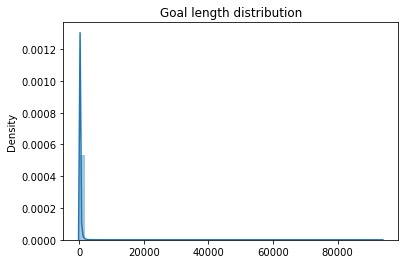

In [28]:
# Check for un-tokenizable pretty printed goals
goal_lengths = []
for i in trange(len(df)):
    try:
        tokens = enc.encode(df.cleaned_goal[i])
        if enc.decode(tokens) != df.cleaned_goal[i]:
            print("shit")
            break
        goal_lengths.append(len(tokens))
    except:
        print(f"Error at {i}, where text is {df.cleaned_goal[i]} with type {type(df.cleaned_goal[i])}")
        raise
sns.distplot(goal_lengths)
plt.title("Goal length distribution")
plt.show()

100%|██████████| 200276/200276 [00:18<00:00, 11096.20it/s]
/opt/anaconda/envs/dynamic37/lib/python3.7/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


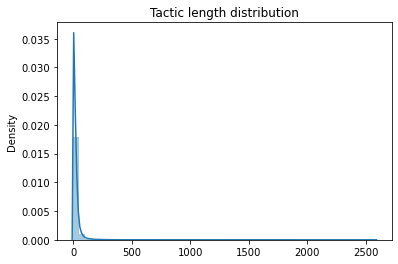

In [29]:
# Check for un-tokenizable human written tactics
tactic_lengths = []
for i in trange(len(df)):
    try:
        tokens = enc.encode(df.human_tactic_code[i])
        if enc.decode(tokens) != df.human_tactic_code[i]:
            print("shit")
            break
        tactic_lengths.append(len(tokens))
    except:
        print(f"Error at {i}, where text is {df.human_tactic_code[i]} with type {type(df.human_tactic_code[i])}")
        raise
sns.distplot(tactic_lengths)
plt.title("Tactic length distribution")
plt.show()

In [30]:
np.sum(np.array(goal_lengths) == 1)

0

In [31]:
keep_indices = []
for i in range(len(goal_lengths)):
    if goal_lengths[i] + tactic_lengths[i] + 2 <= 1024:
        keep_indices.append(i)
print(f"Number of indices to be kept will be {len(keep_indices)} in a total of {len(goal_lengths)}")

print(f"Length before: {len(df)}")
df = df.iloc[keep_indices, :]
df.reset_index()
print(f"Length after: {len(df)}")

Number of indices to be kept will be 196379 in a total of 200276
Length before: 200276
Length after: 196379


In [32]:
import torch
from torch.utils.data import Dataset

# Put goal and tactic into one place, extend encoder and split train test valid
class ProofStep(Dataset):
    
    def __init__(self, df, tokenizer):
        self.tokenizer = tokenizer
        self.df = df
#         self.attn_masks = []
#             self.attn_masks.append(torch.tensor(encodings_dict['attention_mask']))
        
    def __len__(self):
        return len(df)

    def __getitem__(self, idx):
        toks = self.tokenizer.encode(' <|GOAL|>' + self.df.cleaned_goal.iloc[idx] + ' <|PROOFSTEP|>' + self.df.human_tactic_code.iloc[idx] + ' <|endoftext|>') 
        return torch.tensor(toks)
#         print(' <|GOAL|>' + self.df.cleaned_goal.iloc[idx] + ' <|PROOFSTEP|>' + self.df.human_tactic_code.iloc[idx])
#         return toks#, self.attn_masks[idx] 

In [33]:
from transformers import (AdamW, 
                          get_linear_schedule_with_warmup)

In [34]:
from torch.utils.data import RandomSampler, SequentialSampler

# Dataset
# enc = get_encoder()
dataset = ProofStep(df, enc)

In [35]:
from torch.utils.data import random_split

# Split into train, validation and test set: 80 - 5 - 15
train_size = int(0.8 * len(dataset))
val_size = int(0.05 * len(dataset))
test_size = len(dataset) - train_size - val_size

train_dataset, val_dataset, test_dataset = random_split(dataset, [train_size, val_size, test_size])

print('{:>5,} training samples'.format(train_size))
print('{:>5,} validation samples'.format(val_size))
print('{:>5,} test samples'.format(test_size))

157,103 training samples
9,818 validation samples
29,458 test samples


In [36]:
text="It was a bright cold day in April."
quiet=False
nsamples=1
unconditional=False
batch_size=1
gradient_acc_steps = 32
length=-1
temperature=0.7
top_k=40

epochs=21
lr=1e-5 #0.0014
warmup_steps=200
epsilon = 1e-8

output_dir="./models" 
output_prefix="wreckgar"
test_mode=False
save_model_on_epoch=True
sample_every = 100 #sample output every 100 steps

# device=torch.device("cpu")
# model = model.cpu()

In [37]:
from torch.utils.data import DataLoader
from torch.utils.data import RandomSampler, SequentialSampler

# Create the DataLoaders for our datasets.
# We'll take training samples in random order. 
train_dataloader = DataLoader(
            train_dataset,  # The training samples.
            sampler = RandomSampler(train_dataset), # Select batches randomly
            batch_size = batch_size # Trains with this batch size.
        )
# For validation and test the order doesn't matter, so we'll just read them sequentially.
validation_dataloader = DataLoader(
            val_dataset, # The validation samples.
            sampler = SequentialSampler(val_dataset), # Pull out batches sequentially.
            batch_size = batch_size # Evaluate with this batch size.
        )
test_dataloader = DataLoader(
            test_dataset, # The validation samples.
            sampler = SequentialSampler(test_dataset), # Pull out batches sequentially.
            batch_size = batch_size # Evaluate with this batch size.
        )

In [38]:
# Checkpoint model for resuming

import os
from os.path import isfile, join
import re
import json

def load_checkpoint(config, output_dir, output_prefix):
    files = []
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
        print(f"Creating output directory {output_dir}")
    else:    
        files = [f for f in os.listdir(output_dir) if isfile(join(output_dir, f))]

    # Find training stats
    stats_filename = "stats.json"
    if stats_filename in files:
        with open(os.path.join(output_dir, stats_filename), 'r') as f:
            training_stats = json.load(f)
    else:
        training_stats = []
    print(f"Length of current stats file: {len(training_stats)}\n")

    # Find checkpoints
    r = re.compile(f"{output_prefix}-[0-9]*.pt")
    model_files = list(filter(r.match, files))
    epochs_list = [int(x[ len(output_prefix)+1 : -3 ]) for x in model_files]
    model = GPT2LMHeadModel(config)
    if epochs_list:
        current_epoch = max(epochs_list)
        min_val_loss = min([x["Valid. Loss"] for x in training_stats])
        model.load_state_dict(
                torch.load(os.path.join(output_dir, f"{output_prefix}-{current_epoch}.pt"))
        )
        print(f"Checkpoint #{current_epoch} found, with min_val_loss of {min_val_loss:.3f}, resuming.")
    else:
        current_epoch = 0
        min_val_loss = float("inf")
        print(f"Checkpoint not found, starting from epoch #{current_epoch}, min_val_loss of {min_val_loss:.3f}.")
    return model, current_epoch, min_val_loss, training_stats

config = GPT2Config()
config.vocab_size += 2 # 2 new tokens
model, current_epoch, min_val_loss, training_stats = load_checkpoint(config, output_dir, output_prefix)
type(model) == GPT2LMHeadModel

Length of current stats file: 0

Checkpoint not found, starting from epoch #0, min_val_loss of inf.


True

In [39]:
device = torch.device("cuda")
model = model.cuda()

# Note: AdamW is a class from the huggingface library (as opposed to pytorch) 
optimizer = AdamW(model.parameters(),
                  lr = lr,
                  eps = epsilon
                )

# Total number of training steps is [number of batches] x [number of epochs]. 
# (Note that this is not the same as the number of training samples).
total_steps = (len(train_dataloader) // gradient_acc_steps + 1) * epochs

# Create the learning rate scheduler.
# This changes the learning rate as the training loop progresses
scheduler = get_linear_schedule_with_warmup(optimizer, 
                                            num_warmup_steps = warmup_steps, 
                                            num_training_steps = total_steps)

print(f"Number of warmup steps: {warmup_steps}\nTotal steps: {total_steps}")
type(model) == GPT2LMHeadModel

Number of warmup steps: 200
Total steps: 103110


True

In [40]:
import time
import datetime
from tqdm import tqdm, trange

def format_time(elapsed):
    return str(datetime.timedelta(seconds=int(round((elapsed)))))

In [41]:
import  matplotlib.pyplot as plt
# For sampling
def display_attn_and_confidence(model, context_text):
    activation = {}
    def get_activation(name):
        def hook(model, input, output):
            activation[name] = output[2].detach()
        return hook
    
    context = enc.encode(context_text)
    context = torch.tensor(context, device=device, dtype=torch.long).unsqueeze(0)

    # Getting attention outputs
    handles = [
        model.transformer.h[x].attn.register_forward_hook(get_activation(f'attn_{x}'))
            for x in range(12)
    ]

    # Display next token confidence
    prev = context
    with torch.no_grad():
        logits, past = model(prev)
        logits = logits[:, -1, :] / 0.7
        logits = top_k_logits(logits, k=10)
        log_probs = F.softmax(logits, dim=-1)
        values, prev = torch.topk(log_probs, k=10, dim=-1)

    prev = prev.tolist()
    for i in range(len(prev[0])):
        text = enc.decode([prev[0][i]])
        print(f"{text} -> {values[0][i].item()}")
    [handle.remove() for handle in handles]

    # Visualize attention maps
    idx = 0
    input_data = np.arange(context.shape[-1])
    attn_maps = [[(torch.sum(activation[f'attn_{x}'], dim=1)/12).detach().cpu().numpy() 
                         for x in range(12)]]
    num_heads = 12
    num_layers = 1
    seq_len = input_data.shape[0]
    fig_size = 4 if num_heads == 1 else 3
    fig, ax = plt.subplots(num_layers, num_heads, figsize=(num_heads*fig_size, num_layers*fig_size))
    if num_layers == 1:
        ax = [ax]
    if num_heads == 1:
        ax = [[a] for a in ax]
    for row in range(num_layers):
        for column in range(num_heads):        
            im = ax[row][column].imshow(attn_maps[row][column][0], origin='upper', vmin=0, vmax=1, cmap='bone')
            ax[row][column].set_xticks(list(range(seq_len)))
            ax[row][column].set_xticklabels(input_data.tolist())
            ax[row][column].set_yticks(list(range(seq_len)))
            ax[row][column].set_yticklabels(input_data.tolist())
            ax[row][column].set_title(f"Layer {column+1}")
            context_words = [enc.decode([x]).strip(' ') for x in context.cpu().numpy()[0]]
            if column == 0:
                ax[row][column].set_yticklabels(context_words)
            ax[row][column].set_xticklabels(context_words, rotation=90)

    fig.subplots_adjust(hspace=0.6)
    fig.subplots_adjust(right=0.9)
    cbar_ax = fig.add_axes([0.91, 0.15, 0.02, 0.7])
    fig.colorbar(im, cax=cbar_ax)
    plt.show()


======== Epoch 1 / 21 ========
Training...


3200it [03:12, 16.94it/s]

  Step 3,200  of  157,103. Loss: 101.213623046875.   Elapsed: 0:03:13.
><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|> recording recording recording recording recording recording recording recording recording recording recording recording recording recording recording recording recording recording recording recording recording recording recording recording recording recording recording recording recording recording recording recording recording recording recording recording recording recording recording recording recording recording recording recording recording recording recording recording recording recording recording recording recording recording recording recording recording recording recording recording recording recording recording recording recording recording recording recording recording rec

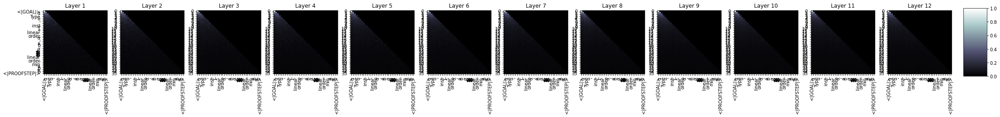

6400it [06:31, 16.43it/s]

  Step 6,400  of  157,103. Loss: 68.17318725585938.   Elapsed: 0:06:32.
>,			______________ Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ital Ita

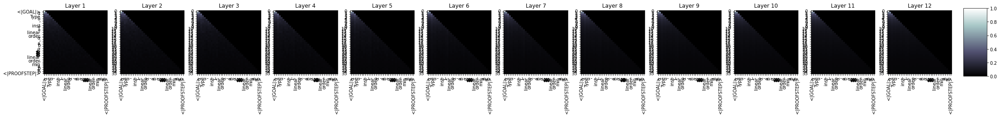

9599it [09:53, 17.39it/s]

  Step 9,600  of  157,103. Loss: 50.801849365234375.   Elapsed: 0:09:54.
><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|>....................................................................,	�������������������������������� wasn wasn wasn wasn wasn wasn 

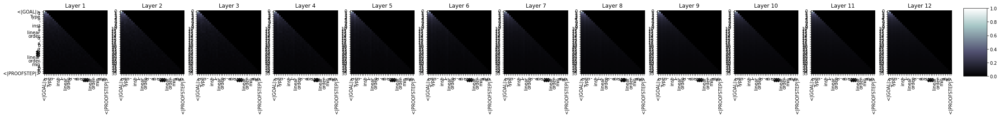

12800it [13:14, 16.11it/s]

  Step 12,800  of  157,103. Loss: 54.718990325927734.   Elapsed: 0:13:14.
><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|

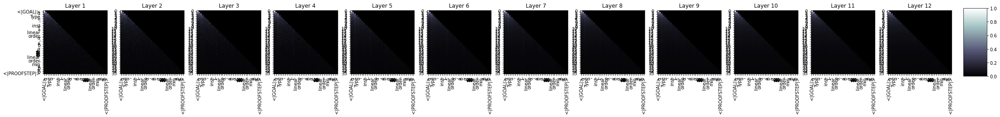

16000it [16:35, 12.98it/s]

  Step 16,000  of  157,103. Loss: 43.39201354980469.   Elapsed: 0:16:36.
><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|P

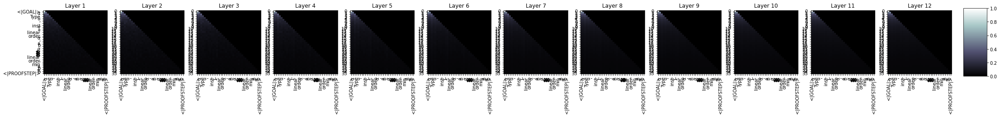

19199it [19:56, 17.24it/s]

  Step 19,200  of  157,103. Loss: 45.70503234863281.   Elapsed: 0:19:56.
><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|>_111 : � � � � � � � � � � � � � � � � � � � �.. : � �.__1111 : α α α α α α α α α α α α α α α α α α α α α α α α α,	_1 : � � � � � � �

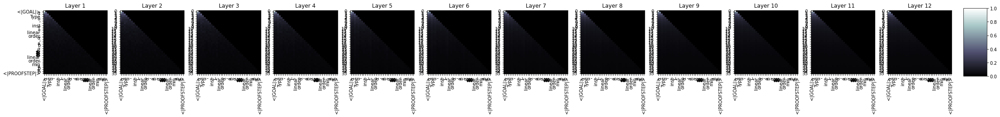

22400it [23:16, 16.84it/s]

  Step 22,400  of  157,103. Loss: 35.90944290161133.   Elapsed: 0:23:16.
><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|>,	_11,	_inst_inst_inst__11 : � � ℄�����������������������������������������������������������������������������._inst_,	_inst_11 : � ℄����������������������������������������������������������...,	_111
<|PROOFSTEP|> -> 0.9798347353935242
_ -> 0.019469229504466057
, -> 0.0006799467373639345
 : -> 1.5190824342425913e-05
. -> 9.259183002541249e-07
 managers -> 1.5460297486669106e-09
 Design -> 5.174087824855178e-10
 defendants -> 5.2134928318903206e-11
 annually -> 3.405554310775827e-11
 Prescott -> 3.316098090566655e-11


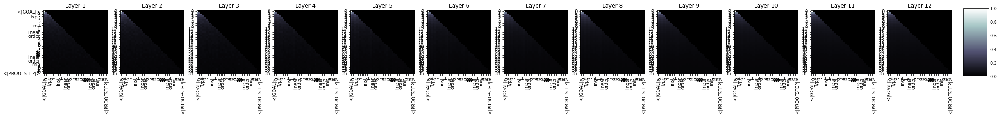

25600it [26:36, 15.79it/s]

  Step 25,600  of  157,103. Loss: 48.08265686035156.   Elapsed: 0:26:36.
><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|P

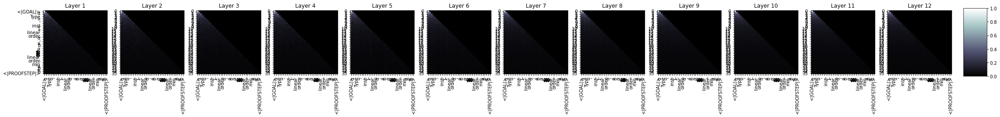

28800it [29:56, 15.97it/s]

  Step 28,800  of  157,103. Loss: 31.012292861938477.   Elapsed: 0:29:56.
> : ℄���������,	⊢,	_inst_inst_inst_inst_inst_inst_inst_inst_inst_1 : ℄ : ℄,	h : �,	_1 : ℄������������,	_inst_fffffffff : ℕ,	_1 : ℄,	_inst_inst_1 : ℕ,	⊢ ( : �,	_inst_11 : � ℄���,	. = = = = = = = = = = = = = = = = = = = = = = = = = = = = = = = = = = = = = = = = = = = = = = = = = = = = = = = = = = = = =
<|PROOFSTEP|> -> 0.929645299911499
 : -> 0.033658333122730255
, -> 0.01950448751449585
_ -> 0.017139393836259842
. -> 5.1904160500271246e-05
 managers -> 3.7711987488364684e-07
n -> 2.3003505589258566e-07
), -> 3.169191487017997e-08
ibus -> 1.3134574317064107e-08
 ( -> 8.417599062227055e-09


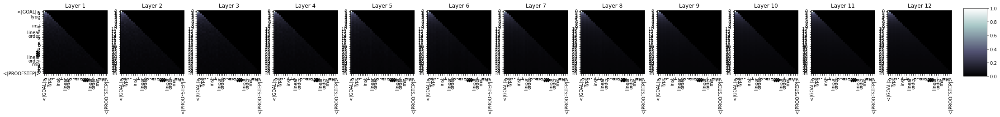

31999it [33:16, 15.14it/s]

  Step 32,000  of  157,103. Loss: 39.798709869384766.   Elapsed: 0:33:17.
>_inst_inst_1 : α,	_)._inst_inst_inst_1 : ℕ,	_inst_inst_1 : Type u_inst_f : ℕ,	h :.. (_inst_1 : : � : �.. : α,	h : � : ℕ�������������,	_inst_inst_sectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsectorsector
_ -> 0.5514785647392273
 : -> 0.2592133581638336
<|PROOFSTEP|> -> 0.16622816026210785
, -> 0.018994782119989395
. -> 0.004076594486832619
 managers -> 4.48

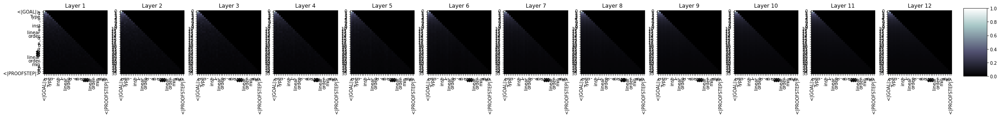

35199it [36:38, 16.83it/s]

  Step 35,200  of  157,103. Loss: 29.328947067260742.   Elapsed: 0:36:38.
><|PROOFSTEP|>,	_inst_inst_inst_1 : ℕ���,	_inst_inst_inst_inst_inst_inst_inst_inst_inst_inst_inst_inst_inst_inst_inst_inst_erenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenerenereneren
_ -> 0.6189621686935425
<|PROOFSTEP|> -> 0.33358168601989746
 : -> 0.040408506989479065
, -> 0.005637127906084061
. -> 0.001406536204740405
� -> 3.665919393824879e-06
 Mandarin -> 6.041445033133641e-08
 allies -> 5

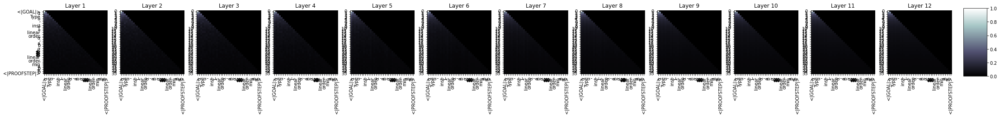

38399it [39:58, 17.64it/s]

  Step 38,400  of  157,103. Loss: 41.931640625.   Elapsed: 0:39:58.
><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|><|PROOFSTEP|>,	₂�������������������,	₂ (sss : ℕ_inst_inst_1 : � ∈ (_1 : ℕ,	⊢ (ffff : ℕ��_ff_inst_inst_inst_inst_inst_inst_inst_1 : ℕ,	_1 : �) ( ( : ℕ,	⊢ (x : ∈_inst_1,	⊢ (fff : x x x x x x x x x x x x x x x x x x x x x x x x x x x x x x x x x x x x x x x x x x x x x x x x x x x x x x x x x x x x x
_ -> 0.8764350414276123
<|PROOFSTEP|> -> 0.11701980978250504
 : -> 0.0041652643121778965
, -> 0.002099882112815976
 Mandarin -> 0.0001167864102171734
� -> 0.00011678195733111352
 managers -> 2.4578759621363133e-05
. -> 1.9885512301698327e-05
n -> 1.1615360335781588e-06
s -> 7.026231401141558e-07


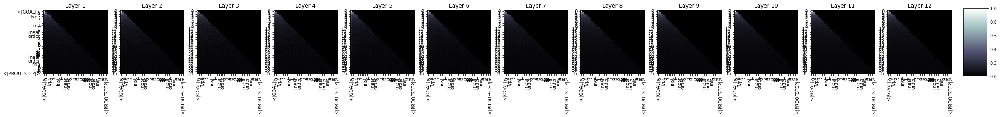

41599it [43:19, 16.83it/s]

  Step 41,600  of  157,103. Loss: 32.48139190673828.   Elapsed: 0:43:20.
>_inst_inst_inst_inst_2 : x x_2 : ℕ_1 : ℕ,	_inst_inst_inst_1 : ℕ,	_inst_2 : ℕ,	_inst_2 : ℕ_inst_inst_1 : ℕ��_1 : α,	_inst_theoryory. ( : ℕ,	_inst_inst_1 : category_2 : ℕ,	⊢_1 : ℕ�,	_1 : ℕ�,	_ (ff : ℕ_theory.ff : ℕ,	h ::\:\:\:\:\:\:\:\:\:\:\:\:\:\:\:\:\:\:\:\:\:\:\:\:\:\:\:\:\:\:\:\:\:\:\:\:\:\:\:\:\:\:\:\:\:\:\:\:\:\
<|PROOFSTEP|> -> 0.648830771446228
_ -> 0.34087055921554565
 : -> 0.009481927379965782
, -> 0.0006072702235542238
 Mandarin -> 9.66281077126041e-05
 annually -> 3.898592331097461e-05
. -> 3.833614391623996e-05
s -> 3.2406143873231485e-05
n -> 1.9218387024011463e-06
 → -> 1.27328507915081e-06


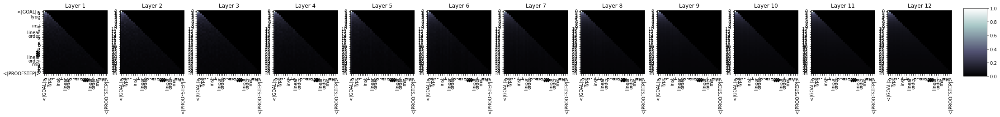

44800it [46:38, 16.45it/s]

  Step 44,800  of  157,103. Loss: 33.717491149902344.   Elapsed: 0:46:39.
>.,	₂�������_inst_inst_inst_inst_inst_inst_inst_inst_inst_inst_inst_inst_inst_inst_inst_inst_inst_inst_1 : Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei Huawei 

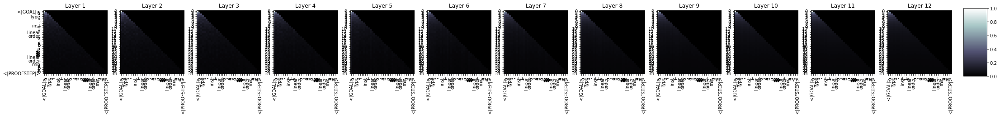

47999it [49:57, 17.56it/s]

  Step 48,000  of  157,103. Loss: 43.33578109741211.   Elapsed: 0:49:58.
>_inst_inst_inst_inst_inst_inst_inst_inst_inst_inst_inst_inst_inst_inst_inst_inst_inst_inst_inst_inst_inst_inst_inst_inst_inst_inst_inst_inst_1 :_inst_inst_inst_1 :_inst_1 : ℕ,	_inst__inst_inst_inst_inst_inst_inst_inst_1 : category_inst_inst_1 : ℕ,	_inst_inst_1 : �_inst_inst_inst_inst_2,	_inst_inst_inst_inst__inst_inst_1 : ℕ___2_inst__inst_inst_inst_1 :_inst_inst__inst_2 :_inst__inst_ panels panels panels panels panels panels panels_inst_inst_inst_2 : �
_ -> 0.8445493578910828
, -> 0.09608731418848038
<|PROOFSTEP|> -> 0.025986747816205025
. -> 0.020663034170866013
s -> 0.010935692116618156
 : -> 0.0007608435116708279
 Mandarin -> 0.0004788339720107615
 managers -> 0.00046120744082145393
n -> 5.006528226658702e-05
f -> 2.697545278351754e-05


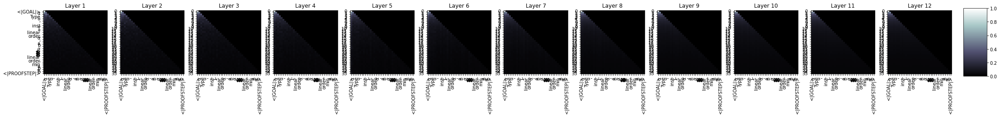

51199it [53:18, 16.75it/s]

  Step 51,200  of  157,103. Loss: 28.038101196289062.   Elapsed: 0:53:18.
>_inst_inst_inst_inst_1 : x.to_inst_inst_inst_inst_inst_inst_inst_inst_2 : Type u_setset_inst_inst_inst_inst_inst_inst_inst_inst_inst_1 : ℕ,	_inst_inst_inst_1 : ℕ,	_inst_inst_inst_pospospos : ℕ_inst_1 : category_inst_inst_inst_1 : ℕ_inst_inst_inst_inst_inst_inst_inst_inst_inst_space_inst_inst_inst_theory._inst_inst_1 : α,	_f_inst_inst_inst_theory._inst_inst_inst_inst_inst_inst_inst_inst_inst_inst_2 : α,	_inst_inst_2 : category_inst_inst
_ -> 0.8058544397354126
<|PROOFSTEP|> -> 0.11596068739891052
. -> 0.06384540349245071
, -> 0.008398497477173805
 : -> 0.004752428736537695
s -> 0.0009522440959699452
 Mandarin -> 9.951560787158087e-05
 managers -> 7.777709106449038e-05
 R -> 3.433137680985965e-05
� -> 2.4610708351247013e-05


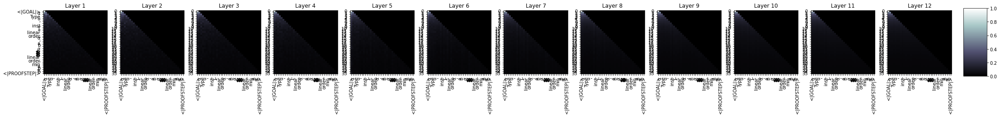

54400it [56:40, 14.16it/s]

  Step 54,400  of  157,103. Loss: 38.74958038330078.   Elapsed: 0:56:40.
>_inst_2 : α,	h : α,	h : α,	h : α,	_1 : ∈_1 : ℕ,	⊢ ∀ (x : ℕ,	h : ℕ�,	h : ℕ,	h : ℕ,	h : ℕ�,	⊢ ∈ = = ∀ (f : ℕ,	hh : α,	⊢ (λ (f : ι�� → →. = 0,	⊢ ∈ = = 0,	⊢ (f : ∈ = = = = = = = = = = = = = 0 0 0 0 0.f : ∈_inst_ astounding astounding astounding astounding astounding astounding astounding astounding astounding astounding astounding astounding astounding astounding astounding astounding astounding astounding astounding astounding astounding astounding astounding astounding astounding ∀ (nn : ∈_2001
_ -> 0.7233902215957642
, -> 0.19775934517383575
. -> 0.028057442978024483
<|PROOFSTEP|> -> 0.014217302203178406
 裏覚醒 -> 0.01274800207465887
s -> 0.011449051089584827
 managers -> 0.004969426896423101
 : -> 0.0030767719727009535
 α -> 0.0027989333029836416
f -> 0.0015335485804826021


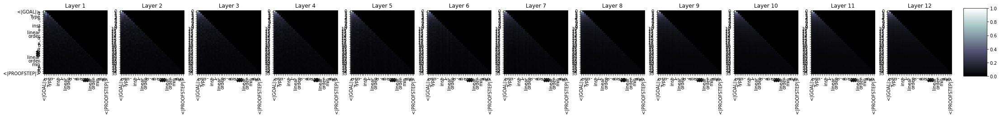

57599it [1:00:00, 17.01it/s]

  Step 57,600  of  157,103. Loss: 34.494468688964844.   Elapsed: 1:00:00.
>s : ℕ,	⊢ ∀ (λ (x : ℕ,	⊢ (λ (x : ℕ),. ∈ (s : ℕ�,	⊢ ∈_inst_ gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul gul
s -> 0.9118829965591431
_ -> 0.08190137147903442
. -> 0.0033179984893649817
, -> 0.002773814834654331
 managers -> 7.054863090161234e-05
 R -> 2.264558497699909e-05
<|PROOFSTEP|> -> 1.1542080756044015e-05
 α -> 8.32093610370066e-06
 annually -> 7.201060270745074e-06
 b -> 3.54071403

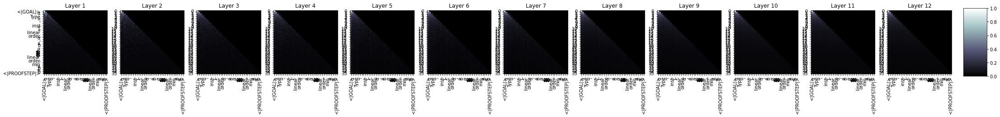

60800it [1:03:20, 15.78it/s]

  Step 60,800  of  157,103. Loss: 29.4580020904541.   Elapsed: 1:03:20.
>s : ℕ,	⊢ (n : ∈_mm.f : α,	⊢ (λ (s : ℕ,	⊢ (λ (f : ℕ,	₁,	⊢ (a : ℕ,	⊢ (⊢ (₂�.f. commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission com

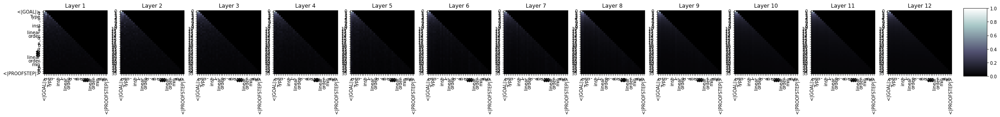

64000it [1:06:40, 13.15it/s]

  Step 64,000  of  157,103. Loss: 48.85462188720703.   Elapsed: 1:06:40.
>s : ℕ,	₁_1,	_1 : ℕ),	⊢ ∈_theory.to_inst_1 : ∈ ℕ,	⊢ (₂�������� : ℕ,	_1 : ℕ,	₂���� : ℕ,	₂�����������,	₁. stimul stimul stimul stimul stimul stimul stimul stimul stimul stimul stimul stimul stimul stimul stimul stimul stimul stimul stimul stimul stimul stimul stimul stimul stimul stimul stimul stimul stimul stimul stimul stimul stimul stimul stimul stimul stimul stimul stimul stimul stimul stimul stimul stimul stimul stimul stimul stimul stimul stimul stimul stimul stimul stimul stimul stimul stimul stimul stimul stimul stimul stimul stimul stimul stimul stimul stimul stimul stimul stimul stimul stimul stimul stimul stimul stimul stimul stimul stimul stimul stimul stimul stimul stimul stimul stimul stimul stimul stimul stimul stimul stimul stimul stimul
s -> 0.999228835105896
_ -> 0.0006814839434809983
. -> 3.77764918084722e-05
 annually -> 2.9763981729047373e-05
 裏覚醒 -> 1.2409745977493003e-05
, -> 4.636722678696969

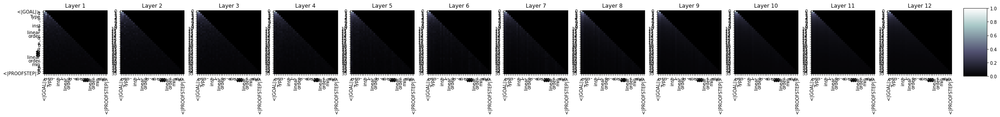

67200it [1:10:00, 15.52it/s]

  Step 67,200  of  157,103. Loss: 28.988515853881836.   Elapsed: 1:10:00.
>s : ℕ,	⊢ (f : ℕ,	⊢ (λ (f : ℕ,	⊢ (λ (f : ℕ),	⊢ (f : ℕ,	⊢ (a b) (f : α,	⊢ (f : ℕ (fff : ℕ,	h : ℕ), (f.ff : ℕ),	⊢ (fff : ℕ,	⊢ (ff : ℕ,	₁) (ffff : x ∈ s.f : ℕ,	₂��) (λ (fff (n (f (x : ℕ,	⊢_ wipe wipe wipe wipe wipe wipe wipe wipe wipe wipe wipe wipe wipe wipe wipe wipe wipe wipe wipe wipe wipe
s -> 0.9997629523277283
f -> 0.00022479479957837611
 annually -> 6.5147287386935204e-06
 裏覚醒 -> 2.096563093800796e-06
 Mandarin -> 1.5370411574622267e-06
 α -> 6.598538675461896e-07
Render -> 5.462164835989824e-07
gu -> 3.114955404726061e-07
. -> 2.6370614136794757e-07
 Diff -> 1.79028390334679e-07


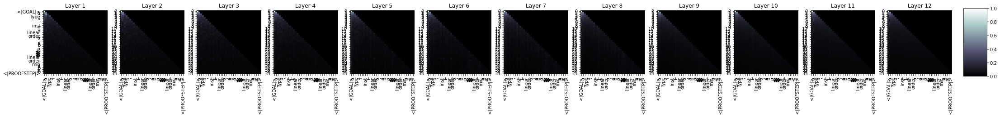

70399it [1:13:20, 17.18it/s]

  Step 70,400  of  157,103. Loss: 30.383991241455078.   Elapsed: 1:13:21.
>s : list.to_inst_inst_1 : α,	⊢ (a : α,	⊢ ∀ (x : x ∈ ∈ (n : α,	⊢ (a b : ∀ (a : x x ∀ (x : ∈ (n : ℕ,	⊢ (λ (f : x x ∈ (x : x ∈ (n : x x ∈. (λ (a : ∀ (λ (λ (x : ℕ,	⊢ (x : ∈ (f. existing existing existing existing existing existing existing existing existing existing existing existing existing existing existing existing existing existing existing existing existing existing existing existing existing existing existing existing existing existing existing existing existing existing existing existing existing existing existing existing existing existing existing existing existing existing existing existing existing existing existing existing existing existing existing existing existing existing existing existing existing existing existing existing existing existing existing existing existing existing existing existing
s -> 0.9999992847442627
 b -> 2.1953597695301141e-07
 裏覚醒 -> 1.7921286143973703e-07
rw -> 1.156546787228

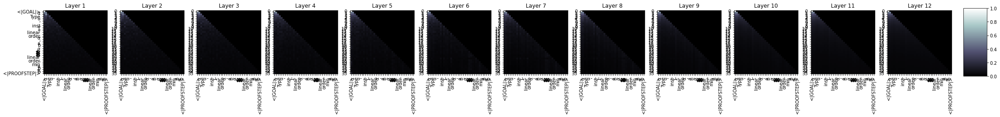

73600it [1:16:40, 16.29it/s]

  Step 73,600  of  157,103. Loss: 30.597368240356445.   Elapsed: 1:16:41.
>s : α,	_inst_inst_inst_inst_inst_inst_inst_inst_inst_inst_inst_inst_inst_1 : f_inst_inst_inst_inst_inst_inst_inst_space.map_of_inst_inst_inst_inst_inst_1 : α,	_inst_inst_space α,	_inst_inst_space.map,	_inst_inst_1 : category_inst_inst_inst_inst_inst_inst_inst_inst_inst_inst_inst_inst_inst_inst_inst_space. Persons Persons Persons Persons Persons Persons Persons Persons Persons Persons Persons Persons Persons Persons Persons Persons Persons Persons Persons Persons Persons Persons Persons Persons Persons Persons Persons Persons Persons Persons Persons Persons Persons Persons Persons Persons Persons Persons Persons Persons Persons Persons Persons Persons Persons Persons Persons Persons Persons Persons Persons Persons Persons Persons Persons Persons Persons Persons Persons Persons Persons Persons Persons Persons Persons Persons Persons Persons Persons
s -> 0.9853892922401428
rw -> 0.014606490731239319
 Mandarin -> 1.

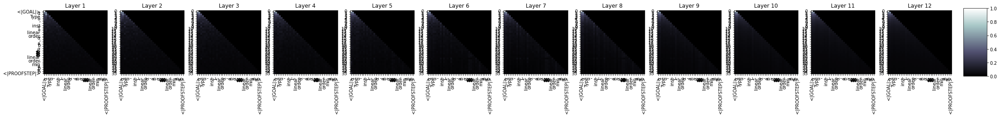

76799it [1:20:01, 17.30it/s]

  Step 76,800  of  157,103. Loss: 34.941322326660156.   Elapsed: 1:20:01.
>s : ℕ,	⊢ ∈.s : ℕ),	_1 : ℕ),	⊢⊢ (x : x.s.susususu.map.f.n : α),	⊢ (a b b b b_inst_inst_inst_1 : ℕ,	⊢ (f.s : ℕ,	⊢ (n.to_inst_f.f.n : ℕ_inst_inst_pospospos_inst_inst_inst_inst_1 : ⊢_1 : ℕ,	⊢ ∀ (a : ℕ,	₁.to_f.f : ℕ,	_f.f..map.sususu_inst_ Keith Keith Keith Keith Keith Keith Keith Keith Keith Keith Keith Keith Keith_1 : �
s -> 0.9999581575393677
rw -> 3.699319495353848e-05
 裏覚醒 -> 3.385928721399978e-06
f -> 5.035882963966287e-07
_ -> 4.974024818693579e-07
 b -> 1.355482623921489e-07
Render -> 1.0664823690831327e-07
 Effect -> 6.070424518611617e-08
 annually -> 6.052019330127223e-08
. -> 3.842438900392153e-08


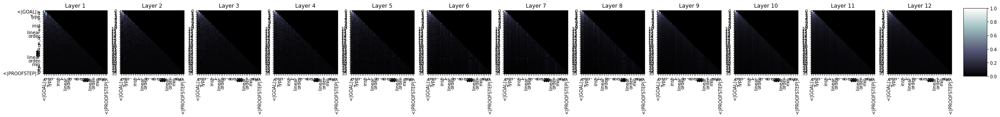

80000it [1:23:21, 13.02it/s]

  Step 80,000  of  157,103. Loss: 28.76557731628418.   Elapsed: 1:23:22.
>s : α,	_inst_inst_1 : α,	⊢ ∈ s,	_inst_inst_inst_inst_inst_inst_inst_inst_inst_inst_inst_inst_inst_inst_inst_2 : ℕ,	_inst_inst_inst_inst_1 : ℕ,	_inst_ actu actu actu actu actu actu actu actu actu actu_inst_f : ℝ�,	f : α,	₂�_inst_inst_inst_inst_inst_inst_inst_inst_inst_map_space_inst_inst_theory.f : ι,	_inst_2 :_f : ι),	_f : ⟨��_inst_inst_4 : R,	₂����������������� : ℕ
s -> 0.8438411355018616
rw -> 0.15576300024986267
 裏覚醒 -> 0.00029097095830366015
f -> 5.2669325668830425e-05
_ -> 2.019967905653175e-05
 Hel -> 9.403833246324211e-06
 annually -> 7.759024811093695e-06
 termin -> 6.564833711308893e-06
 b -> 4.240321686665993e-06
� -> 4.1167963900079485e-06


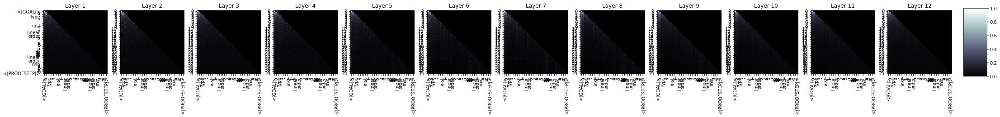

83200it [1:26:40, 16.48it/s]

  Step 83,200  of  157,103. Loss: 32.33243179321289.   Elapsed: 1:26:40.
>rw_1 : α,	⊢ (n : ∀ (λ (λ (λ (λ (f : ℕ,	⊢ (λ (λ (λ (f.f (a : ℕ,	h : α), x ∀ (λ (n : 0.map f f.map (f.map (λ (f.f.f.f : ℕ),	⊢ (λ (λ (λ (λ (f.n.s : ℕ), (x : ∈_inst_inst_2 : ∈.map_1.to_1.map.f : ℕ), (λ (λ (λ (f.n : x ∀ (a.f (λ (λ (λ (f.s.to_1 (λ (f.to_1,	_1 : ⊢ (a : ℕ),),
rw -> 0.8824812173843384
s -> 0.11751466989517212
f -> 2.9221766908449354e-06
 裏覚醒 -> 1.204393583975616e-06
Sequ -> 4.781998441671931e-08
77 -> 1.5899829008958477e-08
 Effect -> 9.572117320999496e-09
 clock -> 8.652505378847763e-09
err -> 7.2874741796624676e-09
592 -> 6.570888277934728e-09


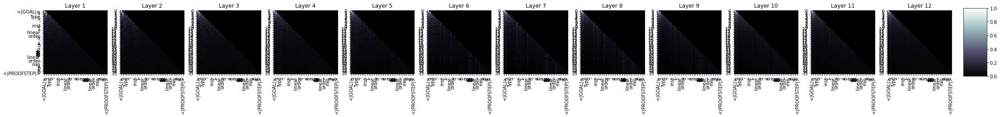

86399it [1:29:59, 16.56it/s]

  Step 86,400  of  157,103. Loss: 35.579349517822266.   Elapsed: 1:29:59.
>rw_inst_inst_inst_inst_1 : ℕ,	₁_2 : ℕ��,	₂� : ∈ (n : ∀ (n : ℕ,	₂������ : ℕ�,	₁.plotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplotplot
rw -> 0.9988460540771484
s -> 0.0011398766655474901
{ -> 7.755385922791902e-06
 Effect -> 5.635651177726686e-06
 circumstances -> 2.8581109745573485e-07
 裏覚醒 -> 1.5788565121965803e-07
 Fir -> 1.2737385191030626e-07
 ming -> 7.767695819893561e-08
 exposition -> 4.314411228278914e-08
 b -> 4.026570010751129e-08


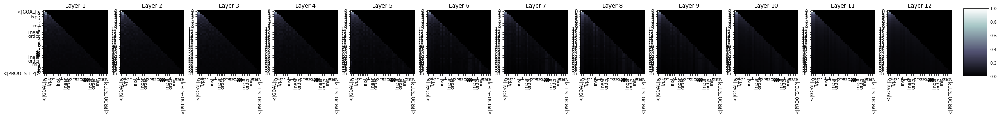

89599it [1:33:18, 17.68it/s]

  Step 89,600  of  157,103. Loss: 26.43304443359375.   Elapsed: 1:33:19.
>rw_3 : α,	_inst_inst_inst_inst_eq_space.map_3 : α,	_space_inst_inst_space.map_inst_inst_inst_map_space_enhagenenhagenenhagenenhagenenhagenenhagenenhagen_inst_space_3 : α,	_space.map_4 : α,	h_inst_inst_space.map_map_map_space_inst_3 : f_space.map_space.map_space_space_inst_map_inst_ Hus_inst_inst_space_inst_inst_1 : f f_space_inst_map_space.f : f_space_space,	h_eq_space_3 : α,	_space_space. resigned resigned resigned resigned resigned resigned resigned resigned resigned resigned resigned resigned resigned resigned resigned resigned resigned resigned resigned resigned resigned resigned resigned resigned resigned resigned resigned resigned resigned resigned resigned_inst_space
rw -> 0.9999996423721313
s -> 3.3414013955734845e-07
 Effect -> 3.806371662307129e-09
{ -> 6.091779858330426e-10
 裏覚醒 -> 1.569752487717846e-11
 ETF -> 1.1349321005563184e-12
 b -> 2.552568616545625e-13
f -> 2.5015555490774666e-13
Sequ -> 1.850

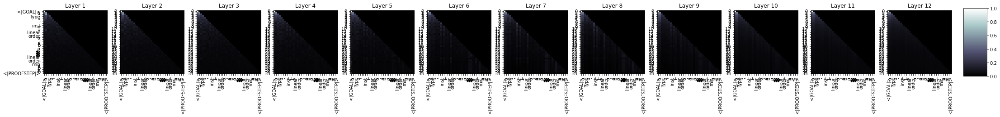

92799it [1:36:38, 17.07it/s]

  Step 92,800  of  157,103. Loss: 26.626968383789062.   Elapsed: 1:36:38.
>rw [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [_inst_inst_colourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolourcolour

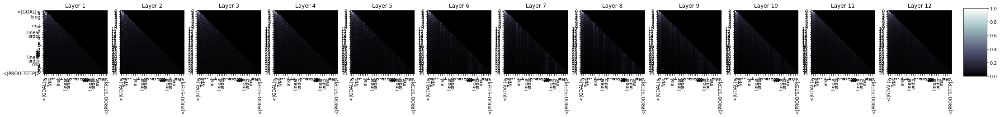

95999it [1:39:59, 17.12it/s]

  Step 96,000  of  157,103. Loss: 23.587417602539062.   Elapsed: 1:40:00.
>rw [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [
rw -> 0.9999310970306396
s -> 6.806241435697302e-05
{ -> 8.572305318921281e-07
ex -> 3.70620476530803e-08
 Effect -> 7.913695476702287e-09
Sequ -> 4.00372235365154e-10
 clock -> 1.9691748232020245e-10
 annually -> 6.700598409459246e-11
 Insect -> 6.291796250668114e-11
 exposition -> 5.363950256187522e-11


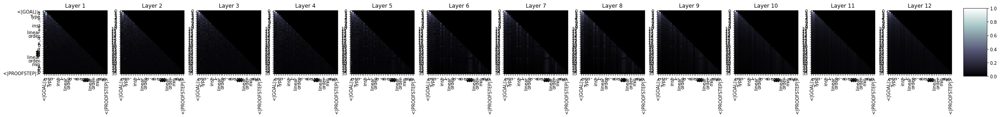

99199it [1:43:21, 17.01it/s]

  Step 99,200  of  157,103. Loss: 29.14564323425293.   Elapsed: 1:43:22.
>rw [ [ [ [ [ [ [_eq_eq_inst_inst_eq_space.map_4 : ℕ,	_space.map_3 : α,	_inst_inst_eq_space.map_inst_space_inst_4 : ℕ,	_space.in_inst_space_space_inst_inst_inst_eq_inst_space_map_inst_inst_n_monoid_space_4 : M,	_space_inst_inst_inst_space_inst_eq_inst_space_inst_space.map_space_eq_inst_monoid_space_space_space_2 : ι_2,	_map_space. pseudo pseudo pseudo pseudo pseudo pseudo pseudo pseudo pseudo pseudo pseudo pseudo pseudo pseudo pseudo pseudo pseudo pseudo pseudo pseudo_space.n_2_eq_map_mon_space_space_4 : category_space
rw -> 0.9999997615814209
{ -> 1.4744804843758175e-07
s -> 4.9926121903354215e-08
ex -> 1.0648624343412294e-10
 Fir -> 7.79244984511207e-12
 exposition -> 5.60503119612088e-12
 Effect -> 4.969420708267336e-12
Oper -> 4.1969311598104297e-13
 pistols -> 4.0237276943515254e-13
 TEAM -> 3.52082187189684e-13


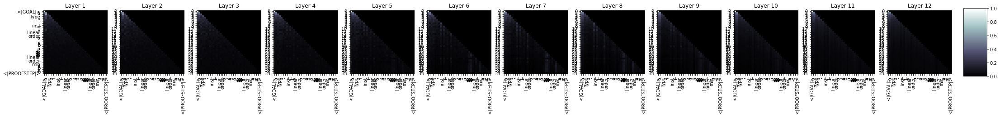

102400it [1:46:43, 15.52it/s]

  Step 102,400  of  157,103. Loss: 19.03689193725586.   Elapsed: 1:46:43.
>rw [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [_m_m_inst_ERSERS_eq_inst_inst_map_group_inst_inst_eq_map_inst_inst_theory.map_all_inst_theory.map_eq_ERS_f_theory.map_pos_map_ decreasing_inst_map_�����,	_inst_1_one_inst_eq_ wander wander wander wander wander wander wander wander wander wander wander wander wander wander wander wander wander wander wander wander wander wander wander wander wander wander wander wander wander wander wander wander wander wander wander wander wander wander wander wander wander wander wander wander wander wander wander wander wander wander wander wander wander wander wander wander wander wander wander wander wander wander wander wander wander wander wander wander wander wander wander wander wander wander wander wander wander wander wander wander wander wander wander wander wander wander wander
s -> 0.6679152846336365
rw -> 0.33204251527786255
{ -> 4.2212632251903415e-05
 Effect

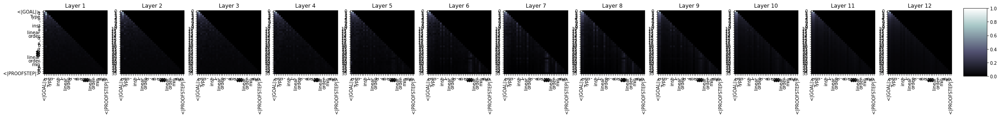

105600it [1:50:03, 15.64it/s]

  Step 105,600  of  157,103. Loss: 23.909120559692383.   Elapsed: 1:50:04.
>rw [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [ [_inst_inst_inst_inst_inst_inst_inst_inst_inst_inst_inst_inst_inst_inst_1 : �_theory.succ_eq_2_inst_eq_space_2 : ℕ�_pos_map_inst_inst_inst_1 : category_inst_ring_inst_1_1_inst_eq_2 : ⟨_inst_space_2,	_1 : category_space_2,	_theory.f : fin_2 : ℕ,	_eq_inst_inst_inst_sub,	_2,	_eq_3_inst_ring_inst_one_2_2 : category_inst_ring R,	_2 : category_1_2
rw -> 0.9999821186065674
s -> 1.7794291125028394e-05
{ -> 5.0935568651766516e-08
t -> 2.1732724508893853e-09
Sequ -> 2.949843494470805e-11
 Fir -> 2.083740645308918e-11
Oper -> 1.5222191562802578e-11
 TEAM -> 5.653462507165807e-12
 Effect -> 5.206505365729086e-12
apply -> 7.00747782283323e-13


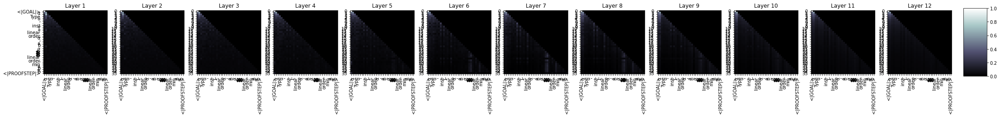

108799it [1:53:23, 17.53it/s]

  Step 108,800  of  157,103. Loss: 22.589078903198242.   Elapsed: 1:53:23.
>rw [ [ [ x ∈ s_eq_mul_eq_eq_eq_eq_space α,	⊢ ∈ s.map_eq_inst_space.un (a_eq_eq_of_inst_eq_eq_le_inst_eq_eq_space.in_mul_mul_eq_inst_mul_eq_eq_mul_space_eq_m_le_le_inst_mul_of_eq_eq_mul_m_eq_le_inst_mul_eq_set. reserv reserv reserv reserv reserv reserv reserv reserv reserv reserv reserv reserv reserv reserv reserv reserv reserv reserv_eq_eq_eq_space_eq_mul_mul_le_le_m_theory.oneoneone_inst_m_inst_m_inst_inst_ERSERSERS_mul_4 : topological_
rw -> 0.9999774694442749
s -> 2.2557918782695197e-05
{ -> 1.9327856648487796e-08
 TEAM -> 2.8641258201927977e-12
t -> 8.241998121320815e-13
 Fir -> 1.4413318628891947e-13
 Effect -> 4.908226941741957e-14
ex -> 1.4113682248460043e-14
Render -> 1.3595380246936295e-14
Sequ -> 8.459423076314157e-15


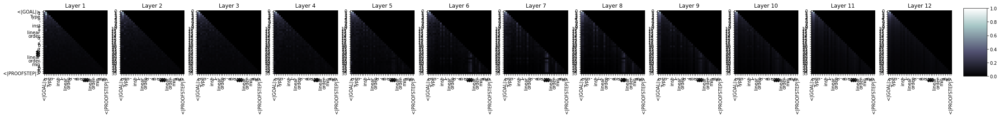

111999it [1:56:43, 17.37it/s]

  Step 112,000  of  157,103. Loss: 35.683563232421875.   Elapsed: 1:56:44.
>rw [ [ x,	h₁,	h : α,	h : a ∈ s,	h�,	₁ : a ∀ (n : α,	₁ : ⟨ a ∈ s,	₁,	₂�����.c.acementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacementacement

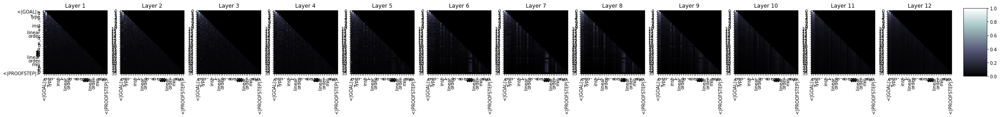

115199it [2:00:04, 16.83it/s]

  Step 115,200  of  157,103. Loss: 28.83291244506836.   Elapsed: 2:00:04.
>rw [ [_inst_inst_inst_inst_space_inst_eq_eq_eq_space_space_inst_space_inst_ conspiracy conspiracy conspiracy_set_eq_inst_ expl_monoid_4 : α,	_one_inst_one_theory.​​_1 : ℕ_4 : α,	_space_one_theory.one_one_theory. pract_inst_inst_space_inst_4 : category_4 : ℕ,	_theory.of_theory.f :_theory.simp_space_one_theory.s_eq_theory.s_le_theory.s_space_theory. Hus Hus_3,	_1_inst_one_space_one_theory.category_theory.s : category_of_fet_space_theory.f_one_one
rw -> 0.995604395866394
s -> 0.004363361746072769
{ -> 3.228033529012464e-05
t -> 2.5702043160436006e-08
 TEAM -> 1.1353717271900265e-10
ex -> 9.722469357376085e-11
 Hel -> 1.8302855758767222e-11
 Effect -> 1.633862142802478e-11
Oper -> 4.937171331487189e-12
Sequ -> 4.287263686425513e-12


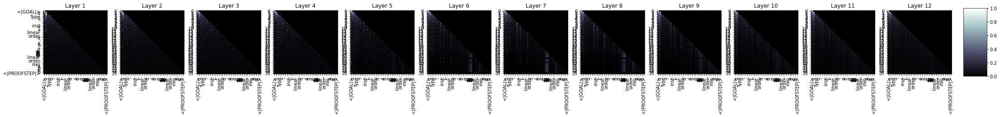

118400it [2:03:24, 16.18it/s]

  Step 118,400  of  157,103. Loss: 28.50759506225586.   Elapsed: 2:03:25.
>simp [ [ [ [ [n_ roadmap_le_3 : ∧_le_le_3 : ∧_succ_3 : Type u_3,	_space.un_inst_space.in_3,	_ Acceler_inst_44 : ι_space_3 : Type u_44_space.ed_space_f x_le_3 : ∀ (f_3_3_le_le_3,	_space_1_3_group_group_Staff_3 : f_4 : Type u_space_le_space_space_space_4_theory.f_space_3,	_theory.category_space_3_f_inst_3,	_group_3,	h_f_4 : ∧_f_space_le_inst_f x ∀ (f : ∈_3 : x_
s -> 0.9153549075126648
rw -> 0.08291618525981903
{ -> 0.001701522502116859
ex -> 1.8936849301098846e-05
t -> 5.927819984208327e-06
 TEAM -> 1.663506168370077e-06
 Effect -> 5.71825864881248e-07
f -> 1.8493221887183608e-07
 Fir -> 8.360451175803973e-08
 exposition -> 5.325833996039364e-08


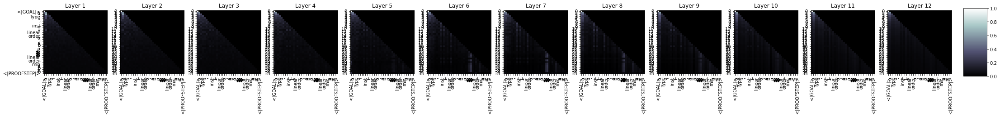

121599it [2:06:44, 17.45it/s]

  Step 121,600  of  157,103. Loss: 19.209753036499023.   Elapsed: 2:06:44.
>rw [ [⊢ ∀ (simp [m_le_mul_m_map_4 : ℕ,	⊢ ∈_group.unununun_theory.to_of_map_inst_of_of_of_theory.un_theory. Cinderella Cinderella Cinderella Cinderella Cinderella Cinderella Cinderella Cinderella Cinderella Cinderella Cinderella Cinderella Cinderella Cinderella Cinderella Cinderella Cinderella Cinderella Cinderella Cinderella Cinderella Cinderella Cinderella Cinderella Cinderella Cinderella Cinderella Cinderella Cinderella Cinderella Cinderella Cinderella Cinderella Cinderella Cinderella Cinderella Cinderella Cinderella Cinderella Cinderella Cinderella Cinderella Cinderella Cinderella Cinderella Cinderella Cinderella Cinderella Cinderella Cinderella Cinderella Cinderella Cinderella Cinderella Cinderella Cinderella Cinderella Cinderella Cinderella Cinderella Cinderella Cinderella Cinderella Cinderella Cinderella Cinderella Cinderella Cinderella Cinderella Cinderella Cinderella Cinderella Cinderella Cinderella Cin

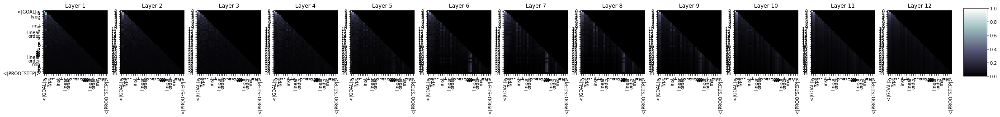

124799it [2:10:04, 16.93it/s]

  Step 124,800  of  157,103. Loss: 33.20856857299805.   Elapsed: 2:10:04.
>rw [ [ Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research 

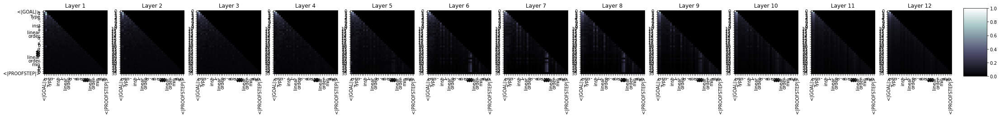

127999it [2:13:24, 17.25it/s]

  Step 128,000  of  157,103. Loss: 23.49965476989746.   Elapsed: 2:13:24.
>simp [ Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Camb Cam

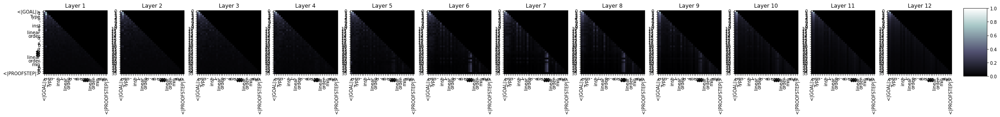

131200it [2:16:45, 15.34it/s]

  Step 131,200  of  157,103. Loss: 15.003179550170898.   Elapsed: 2:16:46.
>simp [ Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research_iff_1_ 141_iff_inst_le_inst_iff_monoid_mon_le_inst_n_one_space_iff_inst_inst_iff_iff_iff_le_theory.category_1_1,	_4,	_iff_theory.​​_eq_inst_pos,	_inst_monoid_theory.​​_iff_iff_theory.simp [_3,	_le_le_inst_theory.succ_group_inst_iff_theory.c_theory.in_3,	_theory.limits.​​_theory.in_iff_monoid_2 : category_mon_2
s -> 0.8231211304664612
rw -> 0.17677676677703857
{ -> 9.809375478653237e-05
t -> 3.412330443097744e-06
ex -> 5.005433649785118e-07
apply -> 1.3510277341310939e-08
 Hel -> 6.854015133228586e-10
 TEAM -> 4.728839542167407e-10
c -> 1.1296690666240

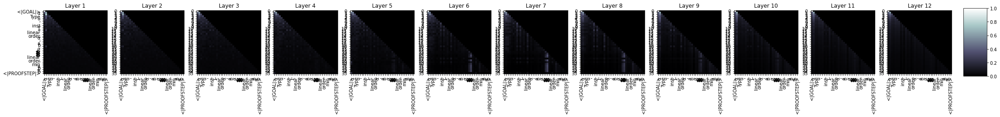

134400it [2:20:06, 16.18it/s]

  Step 134,400  of  157,103. Loss: 25.367481231689453.   Elapsed: 2:20:07.
>simp [h⊢ ∈ s,	₁�simp [₁,	h : α), x ∈ s) = 0 = 0,	h⊢ ∈ t) (⊢ ∈ s) = 0<|PROOFSTEP|>simp [₂��,	⊢ (x_map_le_mul_le_map_map_map_ decreasing_le_le_le_le_le_map_le_1_le_iff_le_le_le_le_le_3 : ∀ (f.map_theory.to_map_theory.f) (n + 1)<|PROOFSTEP|>simp [₁_le_map_map_map_le_le_le_le_ shortened_iff_map_map_le_le_le_le_m_le_theory.map_le_of_
s -> 0.9091697335243225
rw -> 0.0761318951845169
{ -> 0.014698274433612823
apply -> 1.1357526830124698e-07
t -> 5.22941476788219e-08
 TEAM -> 3.3825631184924987e-09
 Effect -> 2.8467741497451016e-09
 Hel -> 9.866075734166202e-10
arrow -> 1.452708647819989e-10
ex -> 1.249011588599913e-10


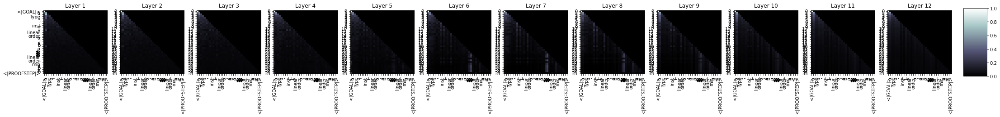

137600it [2:23:28, 15.78it/s]

  Step 137,600  of  157,103. Loss: 48.878849029541016.   Elapsed: 2:23:28.
>{,	_inst_inst_inst_inst_inst_le_inst_algebra_space_algebra_inst_inst_le_ conspiracy conspiracy_inst_inst_inst_4,	_4 : R,	_inst_le_inst_4 : M,	_2 : topological_inst_4 : M_inst_4,	_space_le_inst_space_inst_space M,	_le_le_inst_inst_inst_1 : has_inst_inst_top_ revert_inst_inst_space_theory.ed_space_monoid_theory.c : M,	_space_le_space_space_theory.to_inst_ mapping mapping mapping_algebra_inst_inst_space_tabletabletabletabletabletabletabletabletabletabletabletabletabletabletabletabletabletabletabletabletabletabletabletabletabletabletabletabletabletable
rw -> 0.7332683205604553
{ -> 0.2047506719827652
s -> 0.06198074668645859
t -> 7.791501843712467e-08
have -> 7.599638962574318e-08
ex -> 4.051409163707831e-08
ext -> 1.503472546460216e-08
apply -> 1.2891612222176718e-08
arrow -> 7.948475655439324e-09
 TEAM -> 4.61192684042544e-09


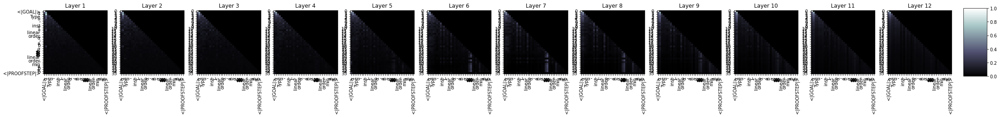

140800it [2:26:48, 16.74it/s]

  Step 140,800  of  157,103. Loss: 20.09731674194336.   Elapsed: 2:26:48.
>rw [h⊢ ∈ s ∈ s ∈ s.simp [h⊢ a ∈ s.to_ singer_ Beans_of_set_of_monoid_of_of_of_3,	⊢ (a_space_noon_C_n + 1<|PROOFSTEP|>simp [h_theory. [*]_m_of_theory.to_map_ decreasing_n_n_monoid_theory.to_sub_n_group_iff_of_ 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906
rw -> 0.9845771193504333
s -> 0.015422695316374302
t -> 1.4868021480651805e-07
{ -> 2.1529514171447772e-08
have -> 1.2882902522548534e-09
 Hel -> 3.708910401023502e-10
 Effect -> 1.7176073063840391e-10
ext -> 1.7802261401134167e-11
 Fir -> 8.270423408618388e-12
arrow -> 6.69560023

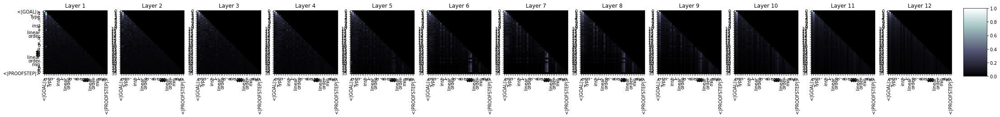

144000it [2:30:08, 13.08it/s]

  Step 144,000  of  157,103. Loss: 25.54335594177246.   Elapsed: 2:30:09.
>rw [ [simp [m_eq_eq_eq_eq_eq_eq_eq_eq_eq_eq_eq_one_ Beans_eq_eq_eq_eq_one_ Beans_1_one_eq_eq_of_pos_eq_eq_eq_eq_eq_eq_one_ Beans_eq_space_one_theory.map_pos_map_eq_space_ Beans_le_space_theory. commenter_one_group_theory.map_eq_eq_theory.map_1,	_eq_eq_theory.map_inst_theory.2_theory.succ,	hf_eq_one_theory.map_one_of_theory.map_eq_one_theory.map_theory.map.map_of_theory..].].].].].].]_one
rw -> 0.9972413778305054
s -> 0.0027569883968681097
{ -> 1.594299760654394e-06
t -> 5.91709112263139e-11
ext -> 3.4170966837360206e-12
 Effect -> 3.3005870172381213e-12
 Hel -> 8.607008877316302e-13
have -> 3.83737095918657e-14
 TEAM -> 1.5978856421610538e-14
arrow -> 6.719062172556899e-15


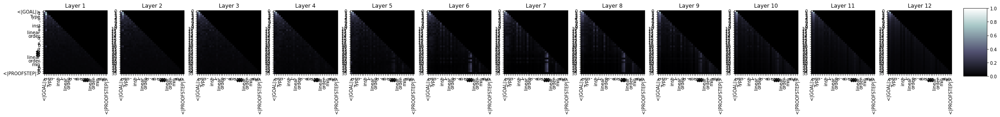

147200it [2:33:29, 16.34it/s]

  Step 147,200  of  157,103. Loss: 22.078651428222656.   Elapsed: 2:33:29.
>rw [hx : α,	₁,	₁ : α,	₁] x ∈ s.succ,	₁,	₂� : α,	₂� : α,	₂�� : α), x ∀ (a : α), x ∀ (₁ : α,	₂������� : ℕ,	₁,	₂����� : α), f.of_inst_inst_inst_inst_inst_1 : x ∀ (₂� : α,	₂����� : x₂��₂����� : ℂ������₂�����������������������
rw -> 0.9999688863754272
s -> 1.6277375834761187e-05
apply -> 1.4357829059008509e-05
{ -> 4.6917540430513327e-07
t -> 1.5952350551629024e-08
ext -> 3.2391613835613953e-09
cases -> 4.3662188448090333e-11
 STEM -> 1.9001104509253075e-11
have -> 9.105220917515755e-12
 TEAM -> 4.373368420879098e-12


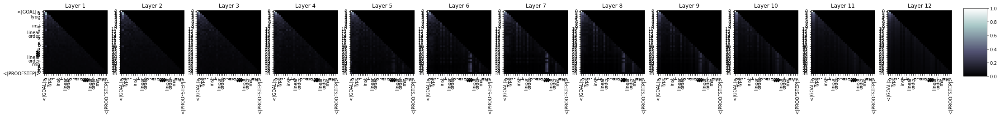

150400it [2:36:50, 15.90it/s]

  Step 150,400  of  157,103. Loss: 23.095815658569336.   Elapsed: 2:36:51.
>rw [hf.succ_3,	h : Type u_eq_inst_eq_3,	_eq_ Guide_inst_ Beans Beans_eq_inst_inst_eq_inst_eq_eq_3,	hf : ι),	_3 : Ghosts Ghosts Ghosts Ghosts_inst_inst_group_inst_inst_inst_f : Ghosts Ghosts Ghosts Ghosts Ghosts Ghosts Ghosts Ghosts_monoid_set.in_le_inst_eq_inst_1 : ℕ,	⊢ (a : ⟩,	a b) = ⟨set.is_inst_monoid.un_ Persons Persons_2 : ℕ,	_eq_map_set.in_3,	h : ⟩,	_ Persons Persons_comm_inst_add_inst_ Persons_inst_inst_DallasDallasDallasDallasDallasDallasDallasDallasDallas_m_
rw -> 0.9999998807907104
s -> 4.042709278451184e-08
{ -> 3.252500135886294e-08
ext -> 8.174522690695962e-12
apply -> 6.775336043075841e-13
t -> 7.508078868638437e-15
 TEAM -> 7.000404377745652e-16
cases -> 6.635743459062874e-16
 Effect -> 3.350410500200211e-16
have -> 1.8735259709499812e-16


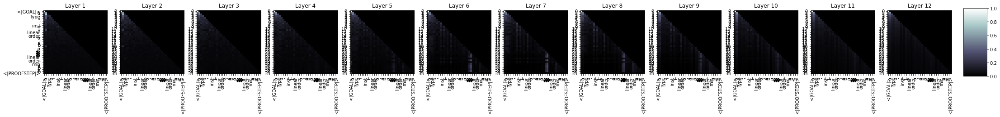

153599it [2:40:10, 17.78it/s]

  Step 153,600  of  157,103. Loss: 20.132736206054688.   Elapsed: 2:40:11.
>{,	_inst_inst_inst_1 : α,	⊢ x<|PROOFSTEP|>{_3 : α,	_inst_inst_1 : α,	_inst_1 : α,	_1 : α,	_inst_1 : α,	_inst_inst_1 : α,	_1 : α,	_inst_inst_1 : α,	⊢ ∈_inst_3 : α,	h_1 : α,	_inst_1 : ι' : α,	⊢ ∈_inst_inst_1 : α,	_1 : α,	⊢ x = x ∈ ⊢ (n : α), x_inst_inst_1 : α,	⊢ (x : α,	_DallasDallasDallasDallasDallasDallasDallasDallasDallasDallasDallasDallasDallasDallasDallasDallasDallasDallasDallasDallasDallasDallasDallasDallasDallas
{ -> 0.5170308351516724
rw -> 0.482941597700119
s -> 2.538460830692202e-05
ext -> 1.2904246204925585e-06
have -> 8.885543252290518e-07
t -> 1.5909696671201345e-08
apply -> 1.2802919835408488e-10
 Hel -> 1.521166526075035e-11
 Effect -> 1.2679217918643015e-11
 STEM -> 6.097076836464321e-12


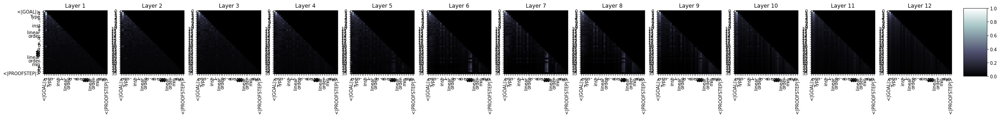

156799it [2:43:31, 14.42it/s]

  Step 156,800  of  157,103. Loss: 14.184261322021484.   Elapsed: 2:43:31.
>rw [hf x ∈ s ∈ t<|PROOFSTEP|>{ r_eq_3 : α), x ∈_map_space_le_space_space_3,	h_inst_ pressuring pressuring pressuring pressuring_space_3,	h₁_3 : ⟩_eq_space.in_one_eq_space_map_space_space_iff_map_ pressuring pressuring pressuring_space_eq_3, ↥f : α,	hf : ⟩_inst_eq_iff_ revert revert_map_eq_map_space_eq_space_space_space_space_map_space_3,	hf : ⟶_ Persons_3 :_ revert revert revert_3_map_le_iff_space_map_3 : category_map_map_ aspiring_3,	_eq_3 :_space_anishanishanish_3 :_3
rw -> 0.9998241066932678
s -> 0.00017330818809568882
{ -> 2.06339768737962e-06
ext -> 5.395975790634111e-07
t -> 8.269560591855907e-10
ex -> 4.6321191327081124e-10
c -> 7.675584885562248e-13
cases -> 6.021740181147428e-13
have -> 2.34279718021313e-13
 Hel -> 7.195511005607391e-14


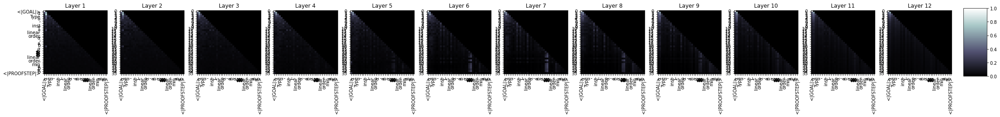

157103it [2:43:56, 15.97it/s]



  Average training loss: 35.54
  Training epoch took: 2:43:57

Running Validation...
  Validation Loss: 17.55
  Validation took: 0:02:43

======== Epoch 2 / 21 ========
Training...


3200it [03:12, 16.72it/s]

  Step 3,200  of  157,103. Loss: 21.50677490234375.   Elapsed: 0:03:12.
>rw [n + 1<|PROOFSTEP|>rw [n_eq_eq_eq_eq_eq_eq_eq_eq_eq_eq_succ_eq_3,	h_eq_eq_comm_map f_3,	h_eq_of_eq_eq_le_eq_eq_eq_eq_m_eq_le_ Beans_theory.to_pos_le_theory.category_eq_map_eq_4 : α,	_theory. permissions_eq_comm_eq_eq_ aspiring_mul_eq_eq_eq_theory.to_ fs fs_eq_eq_le_le_eq_n : ι_comm_fun_eq_3_eq_comm_le_le_f_zero_eq_eq_map_R_le_theory. Penguin_iff_ Beans_ incub_eq_ impoverished impoverished impoverished impoverished
rw -> 0.988840639591217
{ -> 0.011106039397418499
re -> 3.432647281442769e-05
s -> 1.8726594134932384e-05
ext -> 1.9105394244434137e-07
t -> 4.2869945815482424e-08
have -> 9.416200263956398e-09
cases -> 9.595756134128663e-11
 STEM -> 2.963116904619589e-11
int -> 1.8263311002408855e-11


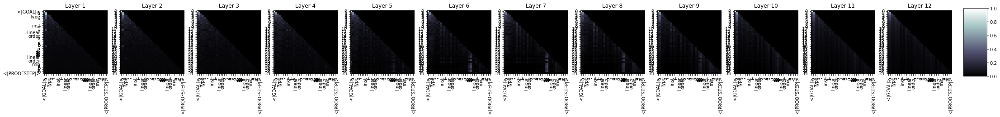

6399it [06:32, 17.06it/s]

  Step 6,400  of  157,103. Loss: 21.349790573120117.   Elapsed: 0:06:32.
>rw [n + 1<|PROOFSTEP|>rw [ Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research Research_1,	hf.map_1_eq_space α,	⊢ ∀ (x_ roadmap_eq_1,	h⊢ (x y) (x : ℕ,	h : ℕ), f_lt_space.mul_eq_space.succ_monoid_monoid.n : ℕ), x)<|PROOFSTEP|>exact_1,	⊢ (n : ⟨_1<|PROOFSTEP|>{ rww_eq_eq_eq_map_1.succ,	hf x ∀ (x : ℕ,	�
{ -> 0.4828139841556549
rw -> 0.47927600145339966
s -> 0.025352489203214645
cases -> 0.0062663066200912
ext -> 0.0043894643895328045
t -> 0.0018094078404828906
ex -> 6.991309783188626e-05
hav

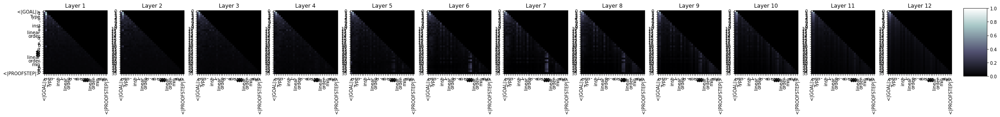

9600it [09:51, 16.38it/s]

  Step 9,600  of  157,103. Loss: 30.178054809570312.   Elapsed: 0:09:52.
>{ rww [set.nil_lt_le_le_le_eq_le_le_le_eq_le_le_le_eq_eq_le_le_le_le_eq_le_le_le_le_le_le_lt_le_le_le_le_le_eq_space_le_le_le_iff_le_le_le_le_le_le_le_le_ mapping mapping mapping_le_le_le_lt_le_eq_eq_le_lt_eq_le_le_le_le_le_le_le_theory.f : module_le_le_le_inv_eq_le_le_le_le_le_inv_le_eq_le_ Variety_comm_le_le_le_le_le_comm_iff_f_le_monoid_comm_le
{ -> 0.6987088322639465
rw -> 0.3006255626678467
int -> 0.0006281239911913872
s -> 3.4861401218222454e-05
have -> 1.3134176697349176e-06
ext -> 1.2684901093962253e-06
t -> 2.7577067740480743e-08
ex -> 2.393251818944009e-08
re -> 9.004546441815364e-09
cases -> 4.616402815571519e-09


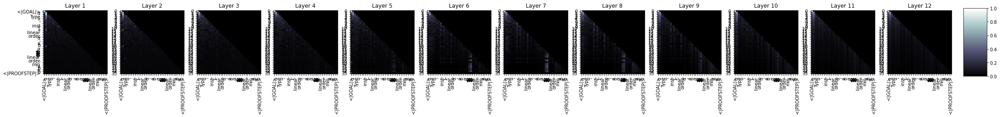

12799it [13:12, 17.23it/s]

  Step 12,800  of  157,103. Loss: 22.978294372558594.   Elapsed: 0:13:13.
>rw [hf x ∈ s,	hf : α,	hb : α,	⊢ ∈ s.to_1 : α,	⊢ ∈ a ∈ s.map f.map f.map f.to_map.map f.map.to_map f.to_map_map f.cipled_iff_map f.to_map_map_map_map_map_eq_map f.to_inst_ Viz Viz Viz Viz Viz Viz Viz Viz Viz Viz Viz Viz Viz Viz Viz Viz_map_map_map_1_map f. pract_map_map.to_one_map_map_map f.map_map_map_map f.to_map_map_map_map_map_map_one_map_map_one_map_map_inst_map_map_f_one_map_map_a_
rw -> 0.999601423740387
{ -> 0.0003984256472904235
s -> 1.1245256104075452e-07
int -> 9.964796987560476e-08
re -> 1.1822338663591836e-08
have -> 6.223853432629767e-09
ext -> 8.001130313850524e-10
cases -> 4.590877955568118e-10
ex -> 1.0576949038831884e-10
 Hel -> 7.863179551925725e-11


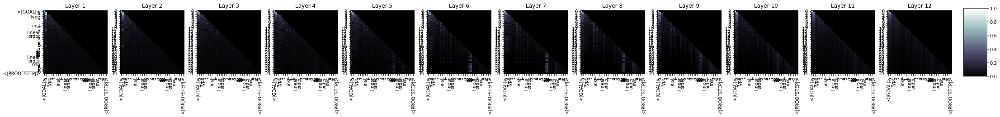

15999it [16:32, 17.32it/s]

  Step 16,000  of  157,103. Loss: 20.682998657226562.   Elapsed: 0:16:32.
>rw [hf x ∨1,	₁ = 0,	hforsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsorsors
rw -> 0.9999939203262329
s -> 4.086662102054106e-06
{ -> 2.003185500143445e-06
have -> 1.7414038266938547e-10
ext -> 1.768358679973825e-13
int -> 1.1127401354938532e-13
 Hel -> 2.071169367197541e-14
 Fir -> 1.2893486395194019e-14
cases -> 1.2018234545301942e-14
ref -> 3.9070517010759715e-15


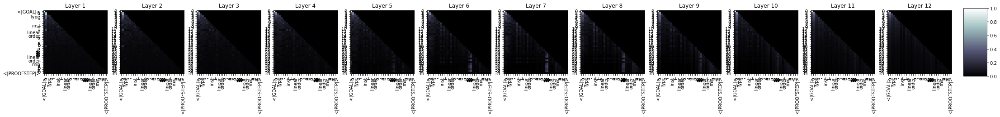

19199it [19:52, 16.83it/s]

  Step 19,200  of  157,103. Loss: 16.508865356445312.   Elapsed: 0:19:52.
>rw [cipled_eq_1 = (a b)<|PROOFSTEP|>exact_mul_mul_3 : α) = c_succ_1 : set α,	⊢ ∈ s) = ↑a : α,	₁_of_spokenspokenspoken_mul_group.in_f ⟨_eq_1 : α) = x ∈ s,	p_succ_1_1 : α,	_1 : α)<|PROOFSTEP|>rw [a : ℕ), ⇑(f : α) = ⇑(f x = c_space.univ_1 : α),	₂��_1 : ℕ,	_1 σ (a : ⟨1_1)<|PROOFSTEP|>s : α), ⇑(mul_m_ aspiring aspiring_zero_1_of_iff_fst,	a_1 : �
rw -> 0.97869473695755
{ -> 0.020243780687451363
s -> 0.001059678033925593
int -> 1.700264533610607e-06
ext -> 5.727873286787144e-08
have -> 1.1869385474483352e-08
ex -> 5.838681538250512e-09
apply -> 2.2791457610082944e-09
cases -> 4.425931149354412e-11
 Hel -> 1.631840322591227e-11


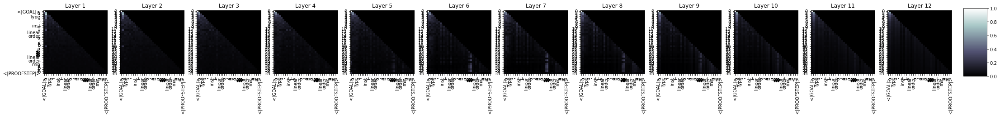

22399it [23:12, 17.09it/s]

  Step 22,400  of  157,103. Loss: 30.251922607421875.   Elapsed: 0:23:13.
>rw [h_eq_eq_le_group M,	_le_le_le_le_le_eq_le_le_iff_comm_3,	_3 : set α,	h_le_group_inst_le_le_le_le_comm_eq_le_le_le_ 184_space_eq_le_mul_sub_mul_le_iff_le_le_le_le_theory.is_of_group_theory.to_comm_of_le_one_mul_mul_1_le_iff_le_sub_theory.is_le_le_le_one_m_le_le_le_mul_le_le_le_m_comm_ shortened_of_le_one_ aspiring_le_le_le_le_le_prprprpr_le_m_
rw -> 0.999619722366333
{ -> 0.0003799438418354839
ext -> 2.690123892534757e-07
int -> 4.9020332681948275e-08
s -> 1.3727535774776811e-09
t -> 1.0555422091940159e-09
have -> 5.8178586948010036e-11
cases -> 1.2971794645377788e-11
ex -> 4.516816608235441e-12
 Fir -> 1.2189261102205085e-12


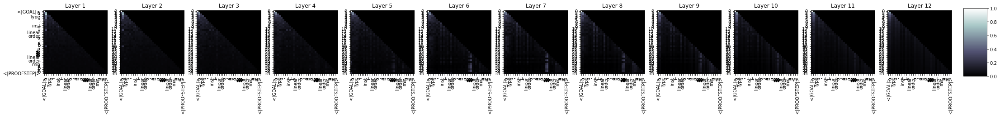

25600it [26:33, 15.39it/s]

  Step 25,600  of  157,103. Loss: 22.731935501098633.   Elapsed: 0:26:33.
>{{_inst_inst_zero_zero_set_eq_space α,	_eq_space_space.succ_inst_space_space_zero_inst_space_4 : α, ↔_inst_space_inst_set_set_space_of_C_space_space_eq_4,	_set_space_space_space_zero_set_ mitigation_space_space_4,	_space_inst_4 : E,	_inst_4 : ⊢ ⇑(f : ⊢ ⇑(f_C_space_space_space_4 : ⟩_space_space_space_space_space_ Persons_space_space_set_inst_set_inst_C_inst_space_space_space_theory. GitHub_space.to_iff_eq_space_4 : ⟩_4,	_space
{ -> 0.9886494874954224
rw -> 0.01134434062987566
have -> 5.068214704806451e-06
s -> 1.0661391343091964e-06
re -> 1.368718649530365e-08
int -> 8.625552716523543e-09
ext -> 3.1120506172044315e-09
t -> 2.4594504210995183e-09
 Fir -> 1.6519331735853626e-10
ex -> 1.4497843203731264e-10


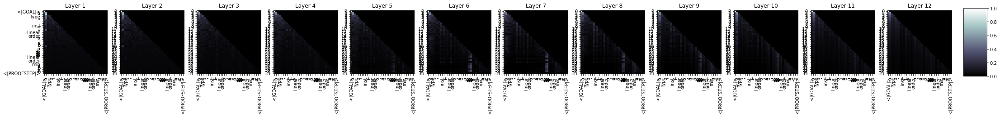

28800it [29:54, 16.38it/s]

  Step 28,800  of  157,103. Loss: 22.662607192993164.   Elapsed: 0:29:55.
>{{ rw [← Forums Forums Forums_eq_eq_eq_eq_le_comm_succ_eq_eq_le_iff_of_eq_eq_eq_zero_comm_group_le_space α,	h_of_space_instance_le_eq_eq_eq_eq_1_eq_le_iff_le_eq_of_eq_inst_theory.​​_le_le_iff_of_le_1_one_group_eq_iff_of_le_inst_eq_inst_space_comm_5,	_Aw_ shortened_theory. stare_ stare_le_le_comm_comm_eq_of_group_le_eq_le_C_iff_eq_iff_space_comm_of_fet_group_le_inst_of_iff_ 神_of_group_3 : �
{ -> 0.9995514750480652
rw -> 0.0004322871973272413
s -> 1.5659801647416316e-05
have -> 2.5571424089321226e-07
ext -> 1.5604805980728997e-07
int -> 1.23949064345652e-07
ex -> 1.070800976776809e-07
re -> 8.933401574040545e-09
apply -> 1.7556185394340673e-09
cases -> 1.381373765374505e-10


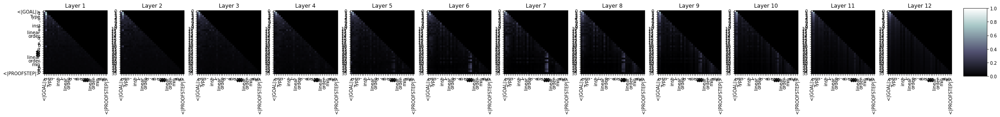

32000it [33:16, 16.06it/s]

  Step 32,000  of  157,103. Loss: 16.554744720458984.   Elapsed: 0:33:16.
>rw [← x.succ_1,	h_inst_eq_instance_eq_eq_eq_eq_f x<|PROOFSTEP|>{_space.succ_eq_instance_eq_fst_space.succ_3,	h_f_space.univ_f : α,	h_succ_eq_f_f_f_f : α,	h : α,	⟩,	h : α,	_inst_f : ℝ_eq_f : α,	h : α,	_f_f.succ_space.univ.succ,	f : α,	⊢ (x : α,	h_f : α,	fst_inst_f (x : α,	h : ⟩_f : ∀ (x : α,	hf : α,	h : α,	
{ -> 0.616492509841919
s -> 0.28439295291900635
rw -> 0.09513913840055466
apply -> 0.001915259868837893
have -> 0.0019045063527300954
re -> 8.492979395668954e-05
ext -> 6.974417919991538e-05
ex -> 9.068213557839044e-07
t -> 4.156720478931675e-08
int -> 1.3238324214626118e-08


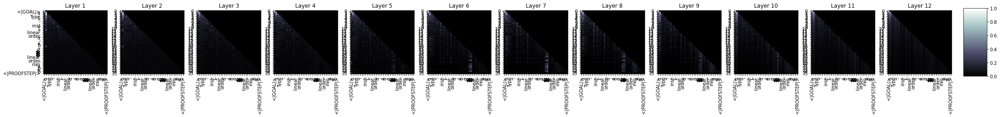

35199it [36:36, 17.41it/s]

  Step 35,200  of  157,103. Loss: 15.993609428405762.   Elapsed: 0:36:37.
>rw [a_eq_instance_3, _₁, _ _₁_add_グ,	_inst_c_add_space_inst_inst_inst_add_inst_add_map_inst_inst_one_add_instance_algebra_C_ expl_eq_eq_inv_prpr_add_inst_of_algebra_one_add_algebra_C_set_le_5,_one_inst_pr_al_add_add_instance_pr_1_eq_algebra_inst_one_comm_one_space_al_sub_theory.is_C_space_add_C_one_space_add_group_al_C_one_C_3,_al_algebra_1_inst_one_group_one_inst_prpr_al_al_2 : module_al_al
rw -> 0.9999921321868896
{ -> 4.957469172950368e-06
re -> 2.6636230359144974e-06
s -> 2.2654639053598657e-07
ext -> 2.3076347943629116e-08
cases -> 1.4156469330117716e-09
have -> 1.3178176327954816e-09
apply -> 5.245516798701999e-10
t -> 1.122104770212573e-10
ex -> 5.602789412972875e-11


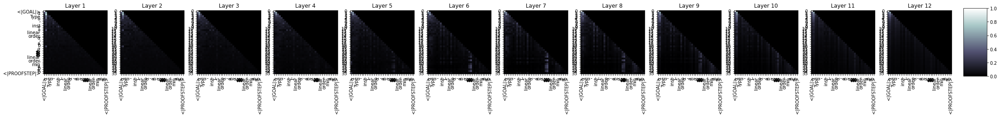

38399it [39:57, 16.00it/s]

  Step 38,400  of  157,103. Loss: 16.35823631286621.   Elapsed: 0:39:58.
>rw [n + b c c = (n_le_sub_1,	h⇑(algebra_le_instance_succ_instance_le_le_instance_instance_le_instance_le_le_of_instance_le_instance_instance_le_instance_group_le_one_group_instance_group_le_le_monoid_instance_group_inst_le_group_group_group_le_group_le_of_group_instance_le_instance_instance_ Cherokee_group_instance_le_instance_le_le_monoid_algebra_group_le_le_le_le_instance_one_one_group_of_group_of_le_le_group_group_one_le_group_comm_of_le_group_le_group_group_algebra_al_le_4 : ℕ
apply -> 0.6780120134353638
re -> 0.2192801982164383
rw -> 0.10011383891105652
{ -> 0.0025811290834099054
s -> 1.2464763130992651e-05
ex -> 3.446778293891839e-07
cases -> 9.631130382103947e-08
ext -> 1.3807796683806828e-08
have -> 6.494484949826074e-09
t -> 1.8193601070137788e-09


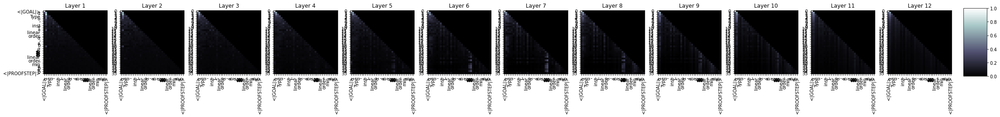

41600it [43:18, 16.65it/s]

  Step 41,600  of  157,103. Loss: 18.87955665588379.   Elapsed: 0:43:18.
>rw [mul_eq_eq_eq_eq_eq_le_eq_le_eq_eq_eq_mul_succ_space.nil_le_fst_m_le_mul_aux_of_eq_m_m_m_C_mul_mul_zero_eq_space ℝ,	_le_zero_mul_m_succ_mul_le_aux_ mapping mapping mapping_zero_m_one_f_eq_m_m_m_m_m_m_m_f : α,	_m_m_m_m_ mapping mapping_le_m : α,	_m_m_mul_polynomial.nil_le_m_m_f_m_m : α_mul_m : α,	_Evidence_f_mul_m_m_to
rw -> 0.999717652797699
s -> 0.00028159483917988837
{ -> 3.4814607374755724e-07
re -> 3.2540779670853226e-07
apply -> 3.7023056620455463e-08
t -> 5.758651368259482e-12
cases -> 1.0111409322680065e-12
have -> 4.637718702994731e-13
 Hel -> 2.399948729331358e-13
int -> 1.4892640343589642e-13


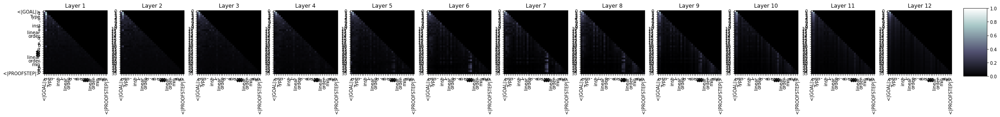

44800it [46:38, 15.06it/s]

  Step 44,800  of  157,103. Loss: 20.592206954956055.   Elapsed: 0:46:39.
>rw [LicenseLicenseLicenseLicenseLicenseLicense_lt_comm_lt_lt_group. rebell_lt_lt_lt_lt_succ_iff_lt_group. English_instance_group_comm_group_lt_lt_group_group.is_of_lt_lt_eq_monoid_lt_group_lt_group_lt_of_comm_lt_group_group.symm_lt_group. stare_lt_lt_comm_of_group_lt_comm_lt_of_lt_eq_comm_of_lt_lt_space.h_of_comm_group_comm_3,	_lt_space. Girls_group_space_lt_group_of_3,	_group_of_lt_comm_lt_comm_of_m_group_group_group_group_lt_group M,	_4,_of_
{ -> 0.6583043932914734
rw -> 0.34010928869247437
re -> 0.0009261881932616234
s -> 0.000501941074617207
apply -> 0.00015829503536224365
have -> 2.026443546299106e-08
int -> 4.041162071644067e-09
t -> 3.36585426197189e-10
ex -> 1.7162796184244655e-10
ext -> 1.5216999882383675e-10


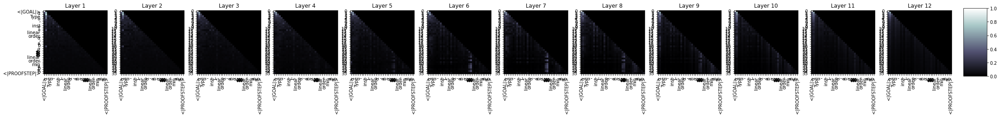

47999it [50:00, 16.64it/s]

  Step 48,000  of  157,103. Loss: 14.408711433410645.   Elapsed: 0:50:00.
>rw [mul_le_1_1_le_iff_le_le_le_le_algebra_mul_algebra_iff_le_set_le_algebra_le_al_le_le_le_le_le_1_algebra_le_algebra_le_one_one_space_le_le_mul_le_mul_le_f_le_le_le_le_iff_le_al_1_one_al_le_Staff_one_le_one_mul_mul_1_le_al_al_mul_algebra_le_eq_le_theory.m_iff_algebra_m_polynomial_le_le_mul_mul_algebra_one_m_mul_al_le_map_le_al_le_le_al_le
rw -> 0.999996542930603
apply -> 3.3618621273490135e-06
s -> 4.83338169487979e-08
{ -> 3.096026190974044e-08
re -> 7.022525672084612e-09
int -> 2.1650785608784417e-09
have -> 1.4625184743821684e-11
ext -> 1.1378204801959502e-11
cases -> 5.093637100647697e-13
ex -> 1.0093450597895015e-13


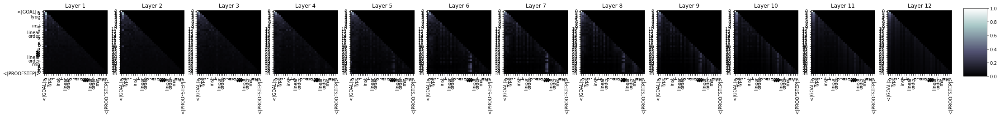

51200it [53:20, 16.05it/s]

  Step 51,200  of  157,103. Loss: 25.12678337097168.   Elapsed: 0:53:20.
>rw [mul_eq_eq_eq_eq α,	₁,	_inst_inst_eq_inst_mul_inst_eq_eq_eq_instance_inst_comm_mul_3,	_instance_eq_instance_inst_inst_instance_3 : α,	_eq_comm_inst_inst_mul_eq_inst_mul_inst_comm_mul_ TBA_inst_ Software_inst_mul_one_group_eq_comm_eq_comm_inst_space_inst_group_comm_comm_space_comm_mul_comm_3 : α,	_set.to_mv_instance_algebra_mul_instance_comm_comm_space α,	_one_comm_inst_comm_group_mul_eq_3_instance_instance_3 : α,	_2
s -> 0.5716683268547058
rw -> 0.4282055199146271
apply -> 0.00012591494305524975
{ -> 1.817507353507608e-07
re -> 3.115562563493768e-08
ex -> 1.0410300177454701e-08
have -> 4.2261492083639496e-09
cases -> 2.9091651310153566e-10
int -> 2.7912994138290514e-10
ext -> 1.6670406721708275e-10


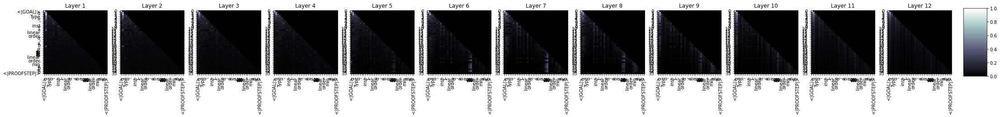

54400it [56:41, 16.67it/s]

  Step 54,400  of  157,103. Loss: 28.159400939941406.   Elapsed: 0:56:41.
>rw [h_eq_eq_eq_measure_eq_eq_set_ rifle_1, ↔_one_set_set_set_eq_set_eq_one_one_one_one_one_one_one_one_set_one_eq_one_eq_eq_one_one_set_one_set_one_one_sub_one_one_set_set_one_one_one_ring_one_one_one_space_one_one_one_one_set_one_one_set_set_set_one_set_one_one_one_one_one_one_one_set_one_one_set_one_one_ Becker_one_one_one_one_one_one_one_one_one_one_one_one_one_one_space_set_one_one_set_one_
rw -> 0.9467073082923889
apply -> 0.042413223534822464
s -> 0.010441336780786514
{ -> 0.0004365814384073019
ext -> 1.198555764858611e-06
have -> 1.778329874468909e-07
re -> 8.823544561664676e-08
ex -> 7.131876866850462e-09
cases -> 2.7821855930199035e-09
int -> 2.1557115814641037e-10


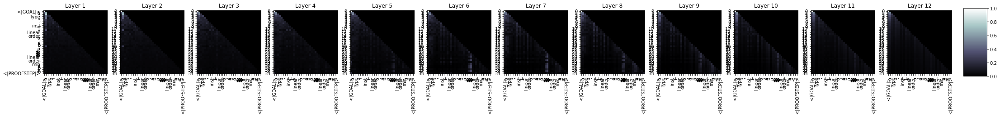

57599it [1:00:01, 16.13it/s]

  Step 57,600  of  157,103. Loss: 25.315994262695312.   Elapsed: 1:00:01.
>rw [ed_eq_iff_iff_group.has_eq_eq_le_eq_eq_le_iff_iff_le_iff_eq_eq_eq_eq_iff_iff_group_le_iff_eq_iff_iff_iff_eq_le_iff_iff_eq_iff_group_iff_iff_iff_iff_iff_one_iff_iff_theory.some_iff_le_iff_le_sub_iff_one_iff_iff_iff_iff_iff_iff_iff_iff_group_iff_iff_iff_iff_group_theory. stare_iff_le_space ⟩,	_iff_le_ mapping_ 212_iff_le_iff_ Ravens Ravens Ravens Ravens Ravens Ravens Ravens Ravens Ravens Ravens Ravens Ravens Ravens Ravens Ravens Ravens Ravens Ravens Ravens Ravens Ravens Ravens Ravens Ravens,	�,	_iff_
rw -> 0.9416340589523315
{ -> 0.0571262501180172
s -> 0.0012215743772685528
ext -> 1.8032893422059715e-05
ex -> 1.120122519182587e-07
cases -> 1.4304351481086997e-08
apply -> 8.981808186092621e-09
have -> 2.2240611574630975e-09
t -> 3.5711750223654803e-10
int -> 3.440082108063791e-10


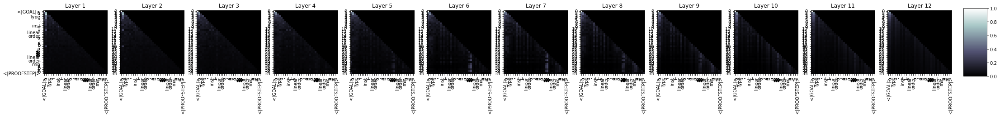

60799it [1:03:21, 17.00it/s]

  Step 60,800  of  157,103. Loss: 15.328277587890625.   Elapsed: 1:03:21.
>rw [a b, _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _, hf.to_eq_instance_measure_eq_eq_succ,	₁_instance_eq_ satisf_eq_succ, hf_one_eq_eq_eq_f_f_f.to_f_one_le_f_le_le_eq_f_f_eq_one_f_eq_eq_eq_to_one_one_eq_one_f_to_eq_to_f_f : α, _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _, h_f_f_f.to_f_one_f_le_f_eq_one_eq_of_to_one_one_to
rw -> 0.9960532188415527
s -> 0.0039253453724086285
{ -> 1.2372099263302516e-05
apply -> 7.996564818313345e-06
have -> 4.960122623742791e-07
ext -> 3.0165568887241534e-07
ex -> 2.65875286231676e-07
cases -> 2.0614225604287384e-10
re -> 1.5733702535269956e-11
 Fir -> 1.1936099678089285e-11


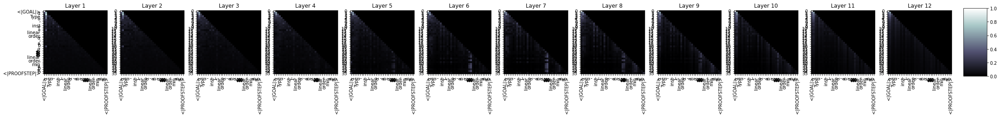

63999it [1:06:39, 17.14it/s]

  Step 64,000  of  157,103. Loss: 31.239688873291016.   Elapsed: 1:06:39.
>rw [h_eq_ delightful delightfulFrancFrancFrancFranc_iff_lt_le_le_iff_iff_eq_iff_le_iff_space α, ↔_inst_lt_inst_of_le_le_le_le_le_le_lt_iff_iff_le_le_one_space_space_iff_space_le_iff_iff_anish_le_inst_le_le_le_le_iff_le_sub_sub_one_iff_zero_le_iff_iff_iff_space_theory.sub_space_iff_theory.map_theory.is_ overlap_space_le_one_one_eq_iff_le_ Becker_ overlap_one_iff_iff_one_iff_one_theory.s_iff_le_iff_theory. youthful_inst_anishanish_4_one_sub
rw -> 0.8259364366531372
s -> 0.17116354405879974
{ -> 0.002860264852643013
apply -> 3.6056550015928224e-05
ext -> 3.022408691322198e-06
have -> 3.5339968462722027e-07
ex -> 3.4192621001238876e-07
cases -> 1.9941401419032445e-08
re -> 2.536754584170353e-09
int -> 5.3911992925481655e-11


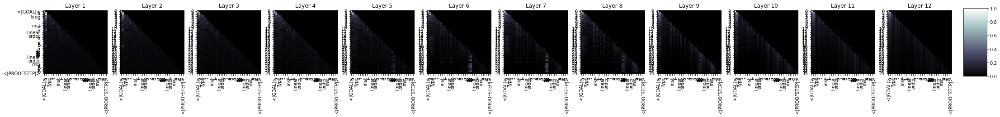

67199it [1:10:01, 16.91it/s]

  Step 67,200  of  157,103. Loss: 18.97453498840332.   Elapsed: 1:10:01.
>apply_eq_eq_eq α, h_eq_zero_eq_eq_le_eq_zero_eq_zero_le_zero_zero_zero_ Roche_zero_instance_instance_zero_eq_eq_zero_le_eq_instance_eq_space_instance_le_le_zero_eq_space α, h_m_one_zero_one_ Becker_eq_eq_map_eq_1,	_one_le_zero_mul_lt_eq_eq_eq_one_one_mul_instance_le_space_set_eq_eq_le_eq_one_le_le_map_zero_m_3_m_mul_map_instance_le_le_ Ravens Ravens, h_one_zero_one_m_one_zero_one_f_ impoverished impoverished_instance_le_4_one_ Roche
apply -> 0.978263795375824
s -> 0.012535389512777328
{ -> 0.0035078786313533783
cases -> 0.0031805613543838263
ext -> 0.0014071293408051133
rw -> 0.0011048984015360475
have -> 4.782233986588835e-07
re -> 2.5595390695798415e-08
ex -> 1.8429762604910138e-08
int -> 1.4027411454620164e-09


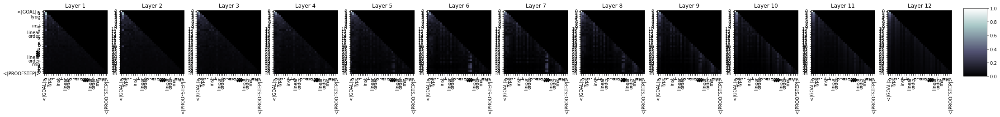

70400it [1:13:20, 16.33it/s]

  Step 70,400  of  157,103. Loss: 17.868684768676758.   Elapsed: 1:13:21.
>{ rw [uddenly_monoid_add_add_eq_eq_eq_add_add_4,	_eq_C_add_space α,	_eq_inst_inst_eq_add_add_1,	₁_instance_map_top_eq_ Beans Beans Beans_inst_group_C_eq_eq_f_f_top_instance_add_add_le_add_le_C_eq_f_inst_set_C_f_eq_C_eq_group_models_space_C_space_top_space_iff_set_sub_add_�, ↥_le_eq_C_f_f_fst,	_3_le_C_inst_eq_C_add_C_inst_add_group_zero_inst_f_al_f_group_group_f : �
{ -> 0.6048493981361389
rw -> 0.1918170303106308
ext -> 0.1567453294992447
s -> 0.023318031802773476
cases -> 0.018545422703027725
int -> 0.004449169617146254
re -> 0.00027540174778550863
apply -> 7.858150041784029e-08
 Hel -> 6.409281638752873e-08
t -> 4.5985197871800665e-09


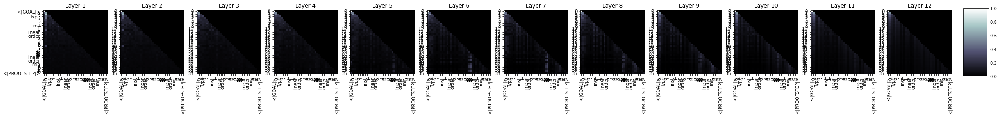

73599it [1:16:41, 17.50it/s]

  Step 73,600  of  157,103. Loss: 22.19900894165039.   Elapsed: 1:16:42.
>ext_eq_eq_monoid_eq_eq_eq_eq_eq_le_eq_le_eq_eq_le_le_eq_eq_le_zero_eq_one_eq_eq_eq_eq_le_le_one_eq_comm_eq_ shortened_le_one_one_theory.████████_le_iff_one_monoid_eq_theory.is_le_le_theory.is_one_theory.is_eq_comm_le_le_one_one_theory.is_eq_theory.is_theory.succ_top corner_le_eq_one_theory.map_one]]_eq_eq_theory.f (x_comm_one_theory.map_theory.to_theory.to_mon_theory.succ_one_the
rw -> 0.9025634527206421
ext -> 0.09556595236063004
{ -> 0.001268962281756103
s -> 0.0005220939638093114
cases -> 4.8097706894623116e-05
re -> 2.9164944862714037e-05
apply -> 1.3458173953040387e-06
int -> 8.603690844211087e-07
ex -> 5.5542582089174175e-08
 Hel -> 7.82382603148335e-09


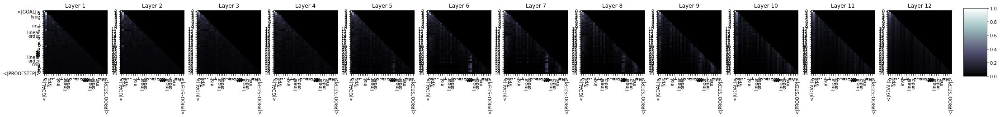

76799it [1:20:02, 17.68it/s]

  Step 76,800  of  157,103. Loss: 18.4959716796875.   Elapsed: 1:20:02.
>cases_3,	h_le_3,	h_le_eq_le_eq_3, ↔_le_le_le_space α, ↔_inst_le_inst_one_le_le_inst_le_le_le_4,	h_eq_le_eq_one_set_eq_le_iff_le_le_le_space_set_space_inst_group_space_le_opol, M,	h_one_inst_eq_set_of_le_inst_one_C_le_le_le_al_set_inst_c_le_set_eq_le_ 神_3 : α,	_le_group_3_al_le_le_set_le_al_eq_eq_le_ Miliband Miliband Miliband Miliband Miliband Miliband Miliband Miliband Miliband Miliband Miliband Miliband Miliband Miliband Miliband Miliband Miliband_4_le
cases -> 0.9751832485198975
{ -> 0.012487909756600857
s -> 0.01064259186387062
rw -> 0.0014532327186316252
ext -> 0.00023303246416617185
apply -> 4.3423654005891876e-08
ex -> 2.8890092540478918e-09
int -> 1.518850822890272e-09
have -> 9.403529066531746e-10
 wardrobe -> 2.146526983937136e-10


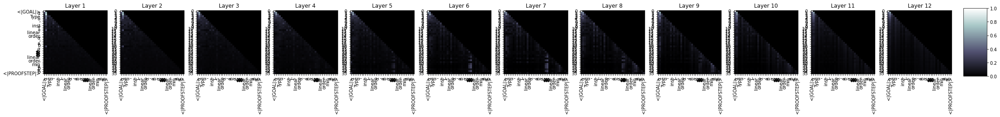

79999it [1:23:21, 14.39it/s]

  Step 80,000  of  157,103. Loss: 14.16382884979248.   Elapsed: 1:23:22.
>rw [h_eq_instance_iff_eq_eq_eq_eq_eq_eq_of_of_eq_eq_le_iff_eq_eq_eq_eq_instance_iff_space_of_opol,	h_eq_instance_eq_iff_instance_iff_inst_f h_of_eq_iff_iff_of_one_one_apply_m_of_of_of_of_eq_apply_theory.to_one_f_of_one_of_iff_of_of_theory.is_eq_inv_of_of_of_eq_f_iris_of_eq_one_one_eq_of_of_of_f_one_iff_of_one_iff_one_one_of_one_one_anish, h_of_iff_f_of_of_ impoverished impoverished_of
rw -> 0.9918099045753479
{ -> 0.007012403570115566
s -> 0.0011726594530045986
ext -> 2.661492317201919e-06
apply -> 1.496999630035134e-06
ex -> 9.570404699843493e-07
ref -> 1.4670694881147028e-08
 Fir -> 1.10385087737086e-08
cases -> 1.0078319512274447e-08
have -> 9.316228677391791e-09


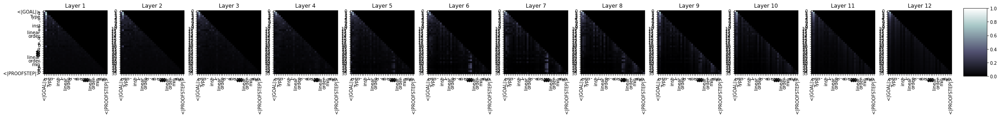

83199it [1:26:42, 13.50it/s]

  Step 83,200  of  157,103. Loss: 27.311220169067383.   Elapsed: 1:26:42.
>rw [← h_instance_instance_eq_eq_eq_eq_eq_eq_eq_eq_eq_eq_succ_eq_eq_eq_instance_eq_instance_eq_eq_eq_eq_eq_eq_instance_eq_instance_instance_eq_eq_sub_eq_eq_eq_Aw_eq_iff_eq_instance_m_eq_le_eq_le_le_eq_eq_sub_instance_ Variety_eq_eq_ 1906 1906_le_eq_eq_C_instance_eq_eq_f_eq_eq_eq_eq_eq_eq_eq_eq_n_m_eq_iff_le_eq_Aw_le_C_iff_eq_m_eq_eq_m_m_ benchmark_instance_eq_f_iff_f_anish,	h_instance_sub
rw -> 0.8930178880691528
{ -> 0.10441108793020248
s -> 0.001981568755581975
ex -> 0.0003765019937418401
cases -> 0.00019252444326411933
ext -> 1.8536582501837984e-05
apply -> 9.078950711227662e-07
have -> 4.4160930201542214e-07
ref -> 3.574761251456948e-07
re -> 2.9045534688521e-07


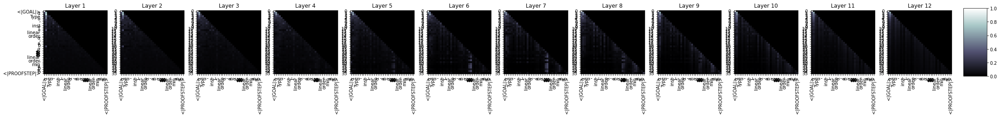

86399it [1:30:02, 16.96it/s]

  Step 86,400  of  157,103. Loss: 19.52361297607422.   Elapsed: 1:30:03.
>simp [LicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLic

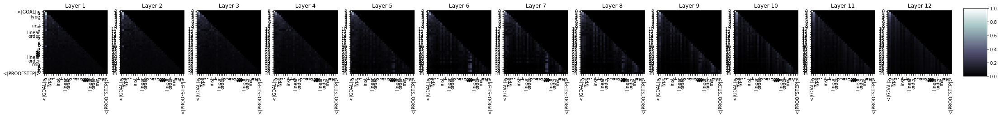

89599it [1:33:22, 15.02it/s]

  Step 89,600  of  157,103. Loss: 11.77247428894043.   Elapsed: 1:33:22.
>simp [�_eq_eq_eq_eq_eq_eq_eq_eq α, ↔ a b, rw [a b, h⟩, _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _
s -> 0.9719156622886658
{ -> 0.016503965482115746
rw -> 0.009644762612879276
ext -> 0.0016603287076577544
apply -> 0.00024296532501466572
re -> 2.654429954418447e-05
ex -> 4.2003671296697576e-06
have -> 1.6092740224848967e-06
 Fir -> 2.158617640191096e-08
cases -> 6.021189657978709e-10


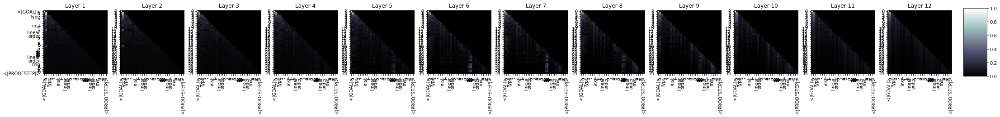

92799it [1:36:42, 16.91it/s]

  Step 92,800  of  157,103. Loss: 16.51616096496582.   Elapsed: 1:36:42.
>rw [← TEAM_zero,	⟩,	⟩, simp [← h⟨x_set.to_zero, hx, h_inst_zero_contin_ sunglasses.nil.measure_iff_mul_of_of_le_zero_monoid_zero_one_zero_iff_zero_of_iff_zero_zero_mul_hom.to_of_of_zero_iff_eq_of_monoid_iff_eq_of_of_le_of_one_iff_iff_iff_iff_iff_set.to_of_iff_iff_eq_iff_theory.of_iff_iff_le_of_monoid_of_iff_one_iff_zero_iff_zero_one_zero, _, h_eq_of_monoid_of_of_zero_zero_
rw -> 0.9911502599716187
s -> 0.006898411083966494
{ -> 0.001739964820444584
cases -> 0.000204381431103684
apply -> 3.5817790831060847e-06
 Fir -> 1.9058420548390131e-06
ext -> 9.027665441863064e-07
have -> 6.294205832091393e-07
re -> 5.51925349867588e-09
ref -> 4.274819165317467e-09


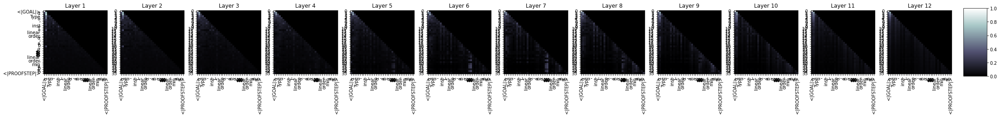

95999it [1:40:01, 15.11it/s]

  Step 96,000  of  157,103. Loss: 15.687145233154297.   Elapsed: 1:40:01.
>simp [h⟨_eq_eq_eq_eq_eq_eq_eq_eq_eq_eq_eq_ recreational_eq_eq_eq_eq_eq_eq_contin_eq_eq_eq_eq_le_eq_eq_eq_le_eq_eq_eq_eq_anish_eq_space α, h_iff_eq_eq_mul_ shortened_eq_eq_eq_eq_𝕜_4,	h_eq_eq_ 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906 1906
s -> 0.45608171820640564
re -> 0.2797175645828247
{ -> 0.2603636682033539
have -> 0.0032045040279626846
rw -> 0.00032638810807839036
ext -> 0.00030566961504518986
apply -> 4.2123932075810444e-07
cases -> 5.284469395405722e-08
int -> 2.0347503237871933e-08
ex -> 1.984387942854937e-08


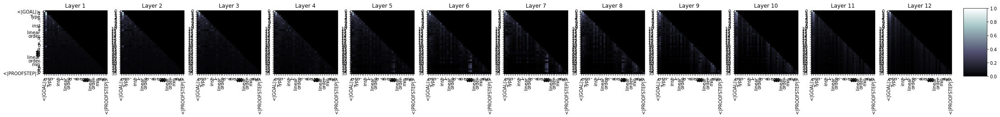

99200it [1:43:20, 16.46it/s]

  Step 99,200  of  157,103. Loss: 16.828811645507812.   Elapsed: 1:43:21.
>rw [h_group.measure_group.measure_group.measure_eq α,	⟩, h_ remember, hx, h,	h_inst_add_inst_of_inst_of_inst_group.map_of_inst_comm_add_group.inr_one_of_of_space.to_of_theory.to_of_of_group_of_group.abling_of_of_inst_n_one_inst_of_of_of_of_of_of_theory.is_space.measure_2,_monoid_ unsub unsub_one_2,	h_of_f_one_of_group.is_fst_of_of_eq_comm_one]], ↔_mul_one_inst_of_iff_fst,	h_f Libraries Libraries Libraries
rw -> 0.9962098598480225
ext -> 0.0026714380364865065
int -> 0.0005968702025711536
s -> 0.00029249812359921634
{ -> 0.00021409416513051838
re -> 1.4833426575933117e-05
apply -> 3.4651446867428604e-07
ex -> 1.2085267542261136e-07
have -> 4.14848280172464e-08
cases -> 3.4714122687518056e-09


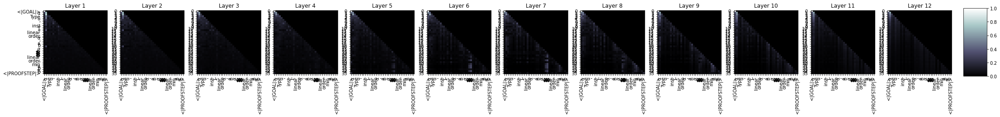

102400it [1:46:40, 15.61it/s]

  Step 102,400  of  157,103. Loss: 13.575583457946777.   Elapsed: 1:46:41.
>apply_instance_set.nil_instance h_set_space α, ↔ a, h_inst_instance_instance_instance_instance_set.finset.size_instance_algebra_top_instance_f_of_algebra_instance_set_instance_algebra_n_inst_instance_instance_instance_set α, h_f_set_set_ mitigation_set_set_algebra_le_aux mould mould mould mould mould mould mould mould mould mould mould mould mould mould mould mould mould mould mould mould mould mould mould mould mould mould mould mould mould mould mould mould mould mould mould mould mould mould mould mould mould mould mould mould mould mould mould mould mould mould mould mould mould mould mould mould mould mould mould mould mould mould mould mould mould mould mould mould mould mould mould mould mould mould mould mould mould mould mould mould mould mould mould mould mould mould mould mould mould mould mould mould mould mould mould mould mould mould mould mould mould mould
{ -> 0.338509738445282
ext -> 0.30884748

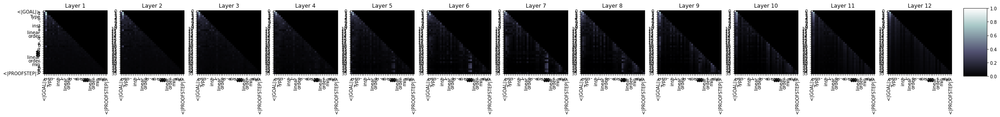

105599it [1:49:59, 15.79it/s]

  Step 105,600  of  157,103. Loss: 17.21784782409668.   Elapsed: 1:50:00.
>rw [LicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLicenseLice

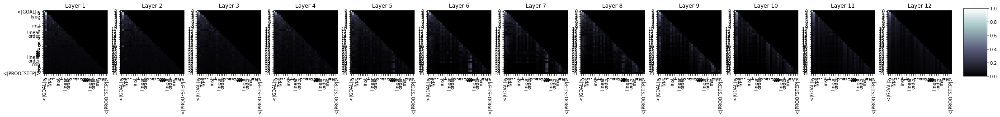

108799it [1:53:19, 16.94it/s]

  Step 108,800  of  157,103. Loss: 21.92626190185547.   Elapsed: 1:53:20.
>{ rw [add_instance_iff_eq_eq α, h, simp [h_eq α, h, h_inst_iff, h_eq_inst_inst_eq α, _ _ _, _ _ _ _ _, h, h_iff_instance_inst_inst_inst_of_eq_x, h_ERSERSERSERS_iff_one_ roadmap_inst_inst_iff_inst_iff_iff_iff_of_inst_set.measure_inst_one_instance_set.to_iff_set. pract_iff, h_iff_eq_of_iff_eq α, h_eq_eq_eq_of_one_one_one]]], h_one_iff_inst_one_iff_one]]]] at_iff_iff_iff_eq_of_instance_of_of_eq_one_one
{ -> 0.8900467753410339
s -> 0.10401131957769394
rw -> 0.005563861224800348
re -> 0.000263829599134624
int -> 0.00011294225259916857
ext -> 1.2277442920094472e-06
apply -> 4.866016567461884e-08
cases -> 7.007541213965851e-09
 Fir -> 3.266525938627751e-09
have -> 7.373620047879115e-10


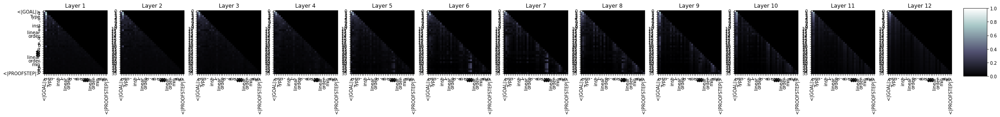

112000it [1:56:39, 16.09it/s]

  Step 112,000  of  157,103. Loss: 22.085908889770508.   Elapsed: 1:56:39.
>apply_eq_eq α, _, h_eq_eq α, _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _, h_zero_inst_iff_eq_f_1, h_eq_inst_iff_eq_instance_iff_to_instance_iff_inst_to_eq_iff_opol_iff_f_iff_iff_instance_1, h_iff_Therefore_eq_iff_iff_eq_inst_1_one_iff_to_iff_eq_iff_iff_iff_iff_iff_1, h_iff_iff_iff_ Miliband Miliband Miliband Miliband Miliband Miliband Miliband Miliband Miliband_iff_iff_ shortened_iff_f_iff_eq_iff_iff_iff_WhitWhitWhitWhitWhitWhitWhitWhitWhitWhitWhitWhitWhitWhitWhitWhitWhitWhitWhitWhitWhitWhitWhitWhitWhitWhitWhitWhitWhitWhitWhitWhitWhit
s -> 0.833970308303833
apply -> 0.1098095253109932
rw -> 0.047795407474040985
re -> 0.006291914731264114
{ -> 0.0020039561204612255
ext -> 7.08222869434394e-05
int -> 5.4454423661809415e-05
have -> 2.459184543113224e-06
ref -> 1.0141177426703507e-06
cases -> 7.652651845546643e-08


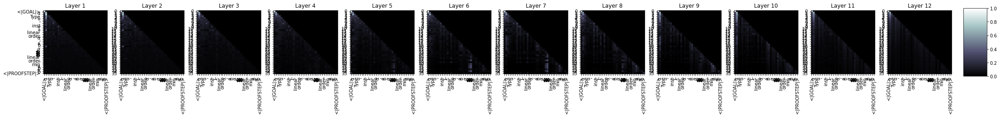

115199it [1:59:58, 16.69it/s]

  Step 115,200  of  157,103. Loss: 18.799699783325195.   Elapsed: 1:59:59.
>rw [← Cay_top, ↔ a, ↔_inst_eq_eq_1, ↔_eq_eq_2, ↔_eq_inst_inst_1, ↔_1, _, _, ↔_inst_1,_eq_inst_eq_1, h, h_1, ↔_inst_inst_opol, h, ↔_inst_inst_inst_inst_1,	_1, h, ↔_1, __inst_inst_eq_inst_inst_inst_inst_inst_1, ↔_eq_1, h_inst_2, ↔_1,,_3, ←_inst_inst_inst_1, _,_inst_inst_inst_1, h_eq_1_ Miliband Miliband Miliband Miliband Miliband Miliband Miliband Miliband Miliband Miliband Miliband Miliband Miliband Miliband Miliband Miliband Miliband, passively passively passively
rw -> 0.9993106126785278
{ -> 0.0006883225287310779
s -> 1.006761067401385e-06
re -> 2.0307034276356717e-08
int -> 3.3241496222302658e-09
ext -> 1.0366156821817185e-09
ex -> 1.342354977174054e-10
 Fir -> 4.090017560742787e-11
ref -> 3.938676815251618e-11
t -> 3.262588463281979e-11


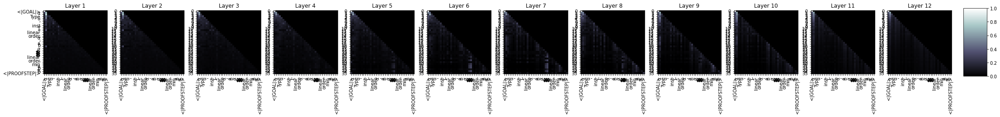

118400it [2:03:18, 16.36it/s]

  Step 118,400  of  157,103. Loss: 27.4764347076416.   Elapsed: 2:03:18.
>rw [← ambassador_eq_eq_eq_eq_eq_eq_eq_eq_eq_eq_eq_eq_succ_ infographic_eq_eq_space.fable_eq_group_eq_mul_eq_mul_eq_eq_m_eq_eq_eq_eq_mul_m_mul_group M, h_inv_mul_eq_mul_mul_m_mul_one_mul_mul_eq_mul_m_eq_mul_mul_eq_eq_mul_mul_mul_m_mul_eq_eq_m_m_eq_mul_mul_mul_mul_m_eq_m_mul_mul_m_mul_m_eq_m_monoid M, h_m_mul_
rw -> 0.6137046813964844
ext -> 0.14910833537578583
re -> 0.1483096182346344
{ -> 0.05034520849585533
s -> 0.03809138387441635
have -> 0.00024994066916406155
apply -> 0.0001017655449686572
int -> 8.555474050808698e-05
t -> 2.640299726408557e-06
ex -> 8.450502377854718e-07


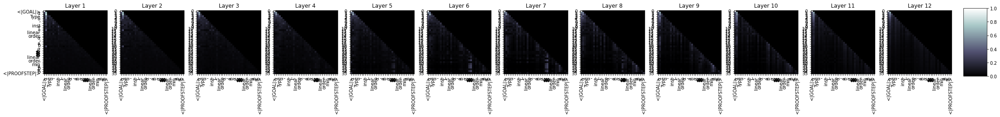

121600it [2:06:38, 16.29it/s]

  Step 121,600  of  157,103. Loss: 11.466435432434082.   Elapsed: 2:06:38.
>rw [ed_eq_top, ↔ a, ↔ a, ↔ a,	h_inst_inst_ Hel_succ_inst_set_eq_eq_eq_eq_le_1, _,	h_le_eq_iff_inst_add_eq_ Beans_inst_one_eq_inst_add_iff_f_iff_iff_iff_inst_eq_le_set_iff_ recreational_iff_eq_set.f_one_iff_eq_iff_eq_x_le_iff_set_add_add_iff_iff_set.f_eq_iff_top_eq_le_eq_eq_eq_n_of_of_eq_eq_le_iff_f_f_f_iff_set_map_mul_one_inst_f_iff_f_c_iff_set_m_
rw -> 0.9489614963531494
s -> 0.05086654797196388
{ -> 9.789557952899486e-05
have -> 5.0206203013658524e-05
re -> 1.9978573618573137e-05
ext -> 2.4350561034225393e-06
apply -> 1.31970170968998e-06
int -> 6.953566611400674e-08
cases -> 2.519914232834708e-08
t -> 1.740440147557365e-08


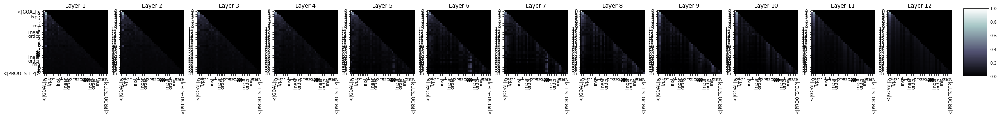

124799it [2:09:57, 16.46it/s]

  Step 124,800  of  157,103. Loss: 21.69647789001465.   Elapsed: 2:09:57.
>rw [h_eq_zero_iff_iff_space.le_eq_zero_eq_space ⟩, h_iff_zero, h_zero_le_zero_le_le_space.succ_opol]] } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } }con⟩, simp [hf, simp [a, hfst, hfst, simp [hfst, simp_f Az_f.map_funetetetetetetetetet.f;;;;;;;;;;;;;;;;;;; simp_le_inst_le_le_ret_f
rw -> 0.9064549803733826
{ -> 0.09188378602266312
s -> 0.0010929621057584882
re -> 0.0005631240201182663
ext -> 4.1225403037969954e-06
apply -> 7.060803000058513e-07
have -> 2.1706439667923405e-07
t -> 7.865871509693534e-08
int -> 4.3391107595880385e-08
ind -> 2.5467175035487344e-09


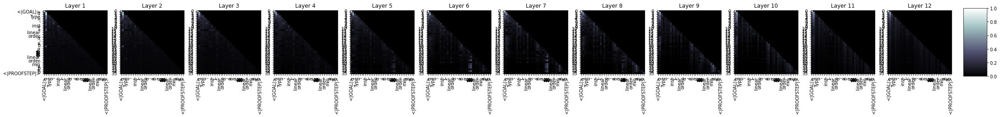

128000it [2:13:16, 16.49it/s]

  Step 128,000  of  157,103. Loss: 22.79853630065918.   Elapsed: 2:13:16.
>rw [←simp [add_lt_eq_iff] } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } hx, simp [hf a, hx, simp [hfst, simp [h⟩, simp [hfst_one_lt_lt_eq_of_x, h⟩, h⟩, hx, h⟩⟩⟩, simp [h⟩, h⟩, simp [hfst⟩, h⟩⟩, h⟩_lt hx, h⟩⟩, _⟩, hfst_
{ -> 0.9427176713943481
rw -> 0.05470804497599602
re -> 0.0015061746817082167
s -> 0.0010497961193323135
apply -> 9.526458597974852e-06
ext -> 8.867585165717173e-06
cases -> 4.0256360023249727e-08
norm -> 3.3866387472158976e-10
have -> 8.60047588702173e-11
int -> 7.962424122820444e-12


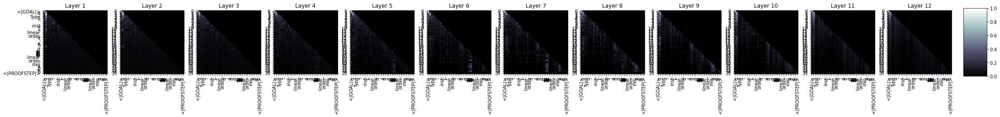

131200it [2:16:37, 15.97it/s]

  Step 131,200  of  157,103. Loss: 26.479829788208008.   Elapsed: 2:16:38.
>{, h, _ _, ↔ a b,	h_inst_inst_inst_inst_inst_1,_inst_inst_inst_inst_set_comm_1, _, ↔_1,	hf_inst_inst_1,_inst_inst_1,	_inst_inst_inst_inst_1 : α,	h_1 : M,_inst_inst_inst_inst_1,	_1 : E,_1_1_inst_inst_comm_comm_comm_inst_space_2 : category_comm_set.to_group_inst_set_inst_set_comm_1 : has_3 : has_comm_set_group_3,	h_1_3,_inst_3,_comm_inst_comm_group_group_inst_inst_space.to_group]]]_comm_2
{ -> 0.9277364611625671
rw -> 0.07069942355155945
s -> 0.0014537698589265347
ext -> 6.358973769238219e-05
apply -> 3.165718953823671e-05
re -> 1.4987378563091625e-05
int -> 5.4626276835278986e-08
cases -> 2.3021495820785276e-09
norm -> 8.911403281963715e-10
ind -> 3.866492959136991e-10


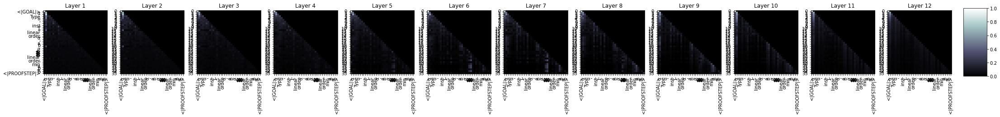

134400it [2:19:57, 16.60it/s]

  Step 134,400  of  157,103. Loss: 12.389771461486816.   Elapsed: 2:19:58.
>{ rw [add_instance_instance_zero_eq_eq_eq_instance_instance_eq_instance_instance_instance_instance_instance_instance_eq_eq_instance_instance_instance_instance_instance_iff_instance_zero_instance_instance_instance_ MOT_instance_instance_instance_one_sub_eq_zero_iff_instance_sub_one_ impoverished impoverished impoverished impoverished impoverished impoverished impoverished impoverished_apply_iff_eq_instance_sub_instance_one_instance_sub_instance_one_instance_apply_one_eq_one_instance_instance_instance_zero_instance_eq_instance_f_instance_instance_sub_3,_eq_one_one_ prescription_instance_sub_one_inst_one_instance_one_ring_sub_one_one_instance_inst_f_iff_f_instance_zero_zero_one_
apply -> 0.5572496652603149
{ -> 0.43669670820236206
rw -> 0.0024298576172441244
s -> 0.0023589832708239555
ext -> 0.0010787200881168246
re -> 0.00018604291835799813
split -> 5.547083903323369e-10
cases -> 2.1959813134575512e-10
norm -> 1.

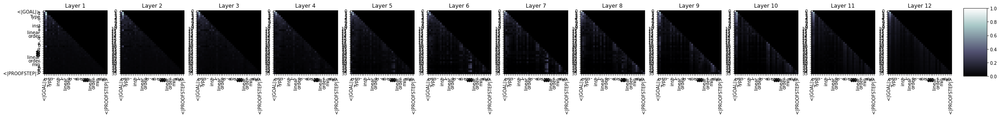

137600it [2:23:17, 15.43it/s]

  Step 137,600  of  157,103. Loss: 24.435142517089844.   Elapsed: 2:23:17.
>refl_anishanishanishanishanishanishanish, ↔ a, h, simp [add_inst_eq_eq_eq_le_eq_eq_eq_eq_eq_le_contin_le_le_opol,	h_le_le_eq_top, _, h_inst_one_eq_inst_eq_inst_eq_eq_eq_le_le_of_le_le_le_le_eq_le_contin_contin_one_lt_eq_eq_eq_le_le_eq_eq_le_f_iff_eq_set_sub_top_one_top_eq_le_eq_top_f_iff_f_f_le_f_le_le_f_f_C_contin_contin_le_inv_le_iff_eq_mul_f_top, _, h_one_
re -> 0.5305514335632324
apply -> 0.42186450958251953
s -> 0.024880951270461082
ext -> 0.018837668001651764
rw -> 0.0019345757318660617
{ -> 0.0019305357709527016
split -> 2.659582207797939e-07
ind -> 7.977963178973368e-08
have -> 3.133548531764063e-08
ex -> 2.1023922602836365e-09


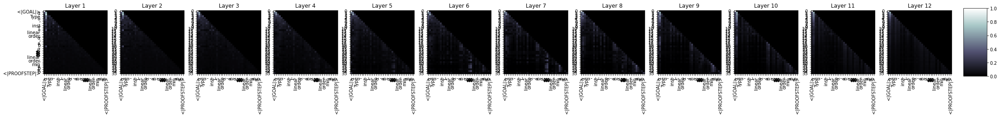

140799it [2:26:36, 16.70it/s]

  Step 140,800  of  157,103. Loss: 20.250776290893555.   Elapsed: 2:26:37.
>exact_le_iff_le_lt_le_iff_le_le_le_le_iff_eq_le_c_iff_c_le_le_of_le_le_contin_le_le_of_le_le_le_contin_iff_iff_le_le_contin_inv_space_iff_iff_of_iff_ roadmap_le_iff_of_le_anish_le_le_inv_le_contin_le_le_of_iff_iff_of_iff_le_iff_iff_le_le_iff_iff_iff_c_c_le_top_inv_le_le_of_f_iff_of_inv_le_iff_le_le_set_iff_f_iff_contin_contin_le_le_iff_inv_of_le_of_le_inv_iff_of
s -> 0.8270586133003235
ex -> 0.10409349948167801
{ -> 0.046533603221178055
rw -> 0.008211914449930191
apply -> 0.006943302694708109
ext -> 0.006671351380646229
re -> 0.0004289031494408846
split -> 4.280905341147445e-05
ref -> 1.3309874702827074e-05
have -> 2.8034928618581034e-06


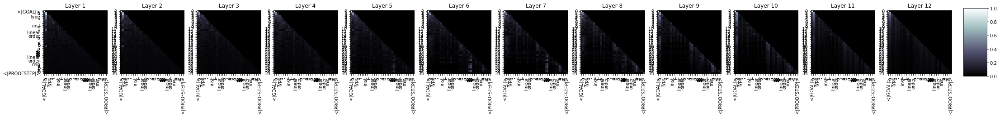

143999it [2:29:56, 17.67it/s]

  Step 144,000  of  157,103. Loss: 15.672274589538574.   Elapsed: 2:29:56.
>{ rw [add_instance_iff_eq_iff_le_eq_le_instance_le_eq_eq_eq_le_le_le_eq_le_instance_le_le_iff_le_iff_eq_le_le_iff_le_le_iff_le_eq_mul_m_mul_iff_le_le_le_iff_mul_le_le_mul_le_mul_le_mul_le_le_mul_mul_eq_mul_mul_le_le_mul_mul_le_le_le_le_le_le_mul_mul_mul_inv_eq_instance_le_le_mul_mul_iff_mul_mul_le_le_inv_mul_f_le_mul_mul_
{ -> 0.9852348566055298
s -> 0.007835038006305695
re -> 0.006315161474049091
apply -> 0.000353410083334893
ex -> 0.00022082285431679338
rw -> 3.777141682803631e-05
split -> 1.945128360603121e-06
have -> 4.396189581257204e-07
cases -> 2.048883800398471e-07
norm -> 1.7870544866127602e-07


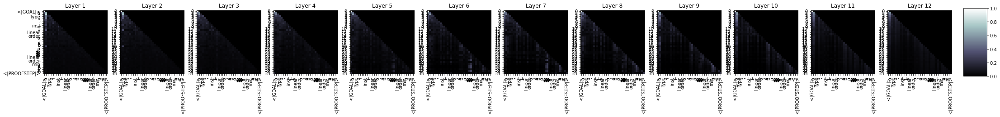

147200it [2:33:17, 16.71it/s]

  Step 147,200  of  157,103. Loss: 15.197619438171387.   Elapsed: 2:33:18.
>rw [h_eq_top, h_eq_eq_inst_eq_open_eq_eq_top_top_eq_comm_eq_eq_top_comm_eq_top_comm_top_f_opol_top_num_top_space_eq_n_instance_space_eq_top_f_one_space α_top_inv_top_inv_le_inst_le_inv_le_space_iff_eq_one_inv_one_inst_eq_top_n_top_one_one_comm_top_comm_n_space_space_mul_comm_one_space_top_inv_one_one_space_inv_space α_f_f_top_le_space_f_space_top_a_one_top_le_inv_inv_one_f_space_inv_inv_instance_top
rw -> 0.9999998807907104
s -> 1.1800604227119038e-07
re -> 4.6505696515986017e-10
{ -> 3.3391928111470293e-10
apply -> 8.358521513818218e-11
have -> 3.806281678730983e-11
ext -> 1.8688838671065966e-11
ex -> 9.219445519514924e-12
t -> 2.9867255858188196e-14
un -> 2.8123147680672285e-15


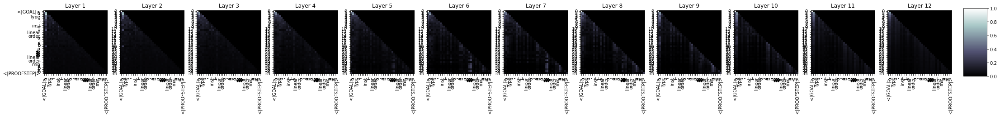

150399it [2:36:36, 15.91it/s]

  Step 150,400  of  157,103. Loss: 21.248746871948242.   Elapsed: 2:36:36.
>rw [add_le_le_le_le_le_le_eq_le_le_le_le_le_eq_le_le_le_eq_le_eq_le_le_le_le_le_eq_le_le_le_le_le_le_le_le_le_le_eq_le_le_le_le_le_eq_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_eq_le_le_le_le_le_le_mul_le_le_le_le_eq_le_le_le_eq_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le
rw -> 0.9060460925102234
s -> 0.06328041106462479
{ -> 0.030665850266814232
ext -> 5.730522389058024e-06
int -> 7.265779800036398e-07
apply -> 6.941735932741722e-07
re -> 4.114976945857052e-07
cases -> 6.178510147947236e-08
ex -> 2.513628860612016e-09
have -> 1.6602288432920886e-09


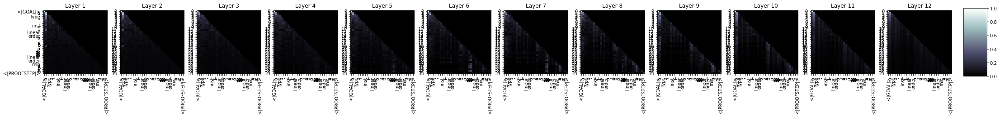

153600it [2:39:57, 16.72it/s]

  Step 153,600  of  157,103. Loss: 21.472566604614258.   Elapsed: 2:39:58.
>rw [h_eq_top, a_eq_eq_le_eq_open_le_eq_eq_top_eq_le_le_le_eq_eq_eq_le_le_le_le_le_inst_le_le_iff_le_le_eq_le_eq_set_le_set_le_inv_inv_le_le_mul_top_le_top_le_le_eq_le_le_le_one_lt_le_top_of_le_m_of_mul_le_le_ Brewing_eq_inv_le_eq_le_le_le_le_m_m_le_le_of_le_le_le_iff_inst_one_mul_eq_ nor_le_le_le_le_le_le_le_top_le_inv_mul_
rw -> 0.6203787922859192
s -> 0.37943828105926514
have -> 9.143995703198016e-05
ext -> 8.166475890902802e-05
ex -> 6.088911504775751e-06
{ -> 3.450114718361874e-06
apply -> 2.3987465169739153e-07
re -> 1.0048101728443726e-07
int -> 4.366109607190083e-08
 Fir -> 2.292333078912634e-08


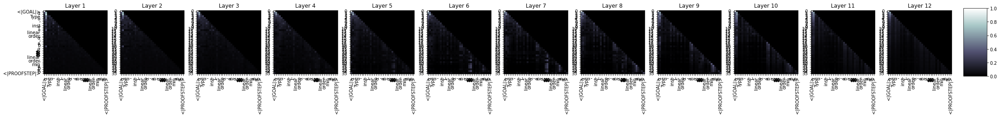

156800it [2:43:17, 16.89it/s]

  Step 156,800  of  157,103. Loss: 18.341522216796875.   Elapsed: 2:43:18.
>rw [ed_mul_le_top, ↔ a, b, simp [a, ↔ a b, h, h, b, [←, b, simpow_inst_inst_inst_inst_inst_inv_mul_inv_mul_instance_mul_instance_one_mul_inst_mul_inv_mul_inv_inst_mul_mul_mul_mul_mul_mul_one_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_le_eq_mul_eq_mul]]] } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } }
rw -> 0.984713613986969
re -> 0.010516896843910217
apply -> 0.004142046440392733
s -> 0.0006219487404450774
ext -> 5.520084869203856e-06
have -> 3.28643268154849e-09
{ -> 2.0806012468455037e-09
cases -> 5.621179632875339e-10
int -> 1.5332367320208817e-11
norm -> 1.0283146729961334e-11


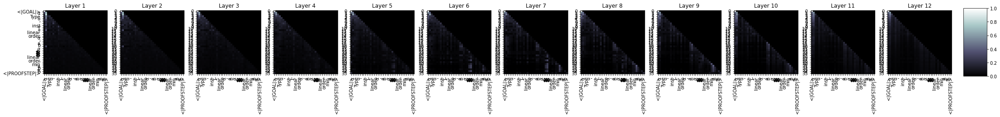

157103it [2:43:43, 15.99it/s]



  Average training loss: 20.86
  Training epoch took: 2:43:44

Running Validation...
  Validation Loss: 13.14
  Validation took: 0:02:42

======== Epoch 3 / 21 ========
Training...


3199it [03:12, 16.33it/s]

  Step 3,200  of  157,103. Loss: 19.357057571411133.   Elapsed: 0:03:13.
>rw [add_eq_eq_eq_eq_eq_le_eq_eq_eq_eq_eq_eq_eq_le_le_eq_eq_eq_eq_eq_le_le_le_eq_eq_le_le_eq_le_le_eq_le_eq_le_le_eq_le_inv_le_le_le_eq_le_le_le_le_inv_le_le_le_one_eq_le_le_le_instance_le_eq_eq_le_mul_le_le_eq_le_one_eq_le_top_eq_le_eq_C_one_one_le_le_le_eq_le_le_le_le_C_eq_C_le_le_le_inv_inv_le_le_eq_le_one_le_le
rw -> 0.9284235835075378
{ -> 0.06295867264270782
s -> 0.008415097370743752
apply -> 0.00019851203251164407
have -> 3.1193383165373234e-06
re -> 9.300939041168022e-07
int -> 6.767664473272816e-08
ext -> 3.175669505139922e-08
norm -> 4.934864961114727e-09
sim -> 1.4144774240776314e-09


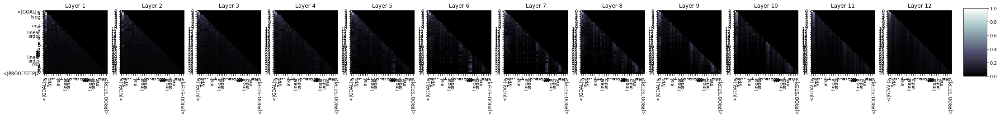

6399it [06:32, 17.52it/s]

  Step 6,400  of  157,103. Loss: 22.27949333190918.   Elapsed: 0:06:33.
>rw [a b, h_le_1, h_le_le_le_le_le_le_eq_le_le_le_le_lt_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_one_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_one_le_le_le_le_le_le_mul_mul_le_le_le_le_mul_le_le_le_le_le_le_mul_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_one_le
{ -> 0.7332755923271179
rw -> 0.2654411196708679
re -> 0.001267985557205975
s -> 1.337532557954546e-05
apply -> 1.947604914676049e-06
ext -> 2.9316600258511016e-09
have -> 7.02659541662598e-10
sim -> 1.638168767303938e-10
ref -> 1.4491131905547405e-10
 Fir -> 4.4044316804825456e-11


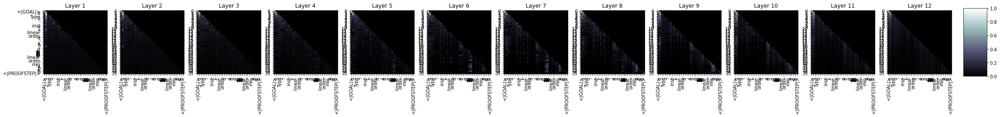

9600it [09:50, 16.47it/s]

  Step 9,600  of  157,103. Loss: 31.378803253173828.   Elapsed: 0:09:51.
>rw [← Effect Effect Effect Effect Effect_eq_eq_le_eq_le_eq_eq_eq_le_eq_le_le_eq_top, exact_eq_top, ↔_eq_le_inst_le_le_le_eq_top, _, ↔_eq_one_le_eq_le_top_le_le_mul_mul_le_mul_le_le_eq_le_le_mul_mul_le_mul_mul_mul_le_mul_mul_finset_mul_mul_eq_348348348348348348348348348348348348348348348348348348348348348348348348348348348348348348348348348348348348348348348348348348348348348348348348348348348348348348348348348348
rw -> 0.7051044702529907
{ -> 0.29125696420669556
s -> 0.002996619325131178
re -> 0.0006043482571840286
apply -> 3.4046126529574394e-05
sim -> 2.4387131816183683e-06
ex -> 4.934025810143794e-07
cases -> 4.2961525537066336e-07
ext -> 1.6434749738891696e-07
split -> 1.0596256094785872e-09


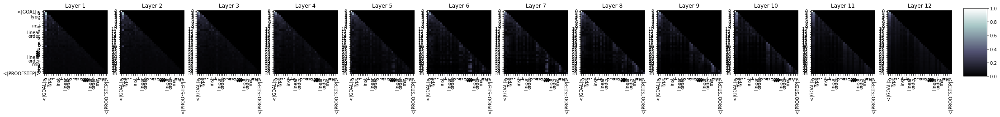

12799it [13:10, 15.82it/s]

  Step 12,800  of  157,103. Loss: 14.503728866577148.   Elapsed: 0:13:10.
>apply_eq_le_instance_le_le_le_le_mul_le_le_le_eq_le_le_le_le_zero_le_le_le_le_le_le_le_le_le_le_le_lt_le_le_le_le_le_one_le_le_le_le_iff_le_le_le_of_le_le_le_le_le_le_le_le_le_le_of_le_of_le_le_mul_mul_le_le_le_set_mul_le_le_le_le_le_le_mul_instance_le_mul_le_le_le_mul_le_le_of_mul_mul_le_le_le_le_le_of_le_le_mul_
apply -> 0.9667657613754272
s -> 0.031330887228250504
rw -> 0.0017296809237450361
re -> 0.0001702298759482801
{ -> 3.23641120303364e-06
have -> 2.7496719212649623e-07
sim -> 4.57028370703938e-09
cases -> 4.117708396478292e-09
 Fir -> 1.6756023235586781e-09
ex -> 8.668868956007714e-10


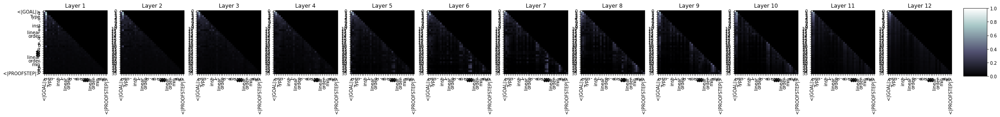

16000it [16:30, 16.35it/s]

  Step 16,000  of  157,103. Loss: 16.779260635375977.   Elapsed: 0:16:30.
>rw [h_eq_eq_le_eq_eq_eq_eq_le_eq_eq_le_eq_eq_le_le_eq_eq_le_instance_eq_le_ benchmark_le_mul_le_le_instance_eq_le_instance_eq_le_le_eq_instance_le_le_le_le_iff_instance_le_le_le_le_le_le_eq_eq_le_contin_one_lt_eq_mul_le_eq_eq_le_mul_le_le_instance_le_sub_eq_le_mul_le_le_mul_eq_iff_le_le_le_eq_le_le_mul_le_mul_contin_m_mul_le_le_mul_le_to_le_le_instance_one
rw -> 0.9736641049385071
apply -> 0.023249756544828415
{ -> 0.0028868953231722116
s -> 0.0001731507945805788
re -> 1.2623354450624902e-05
ex -> 9.54257575358497e-06
ext -> 3.5102229958283715e-06
sim -> 4.357705734037154e-07
cases -> 1.8996553663441773e-08
have -> 1.757068268659623e-08


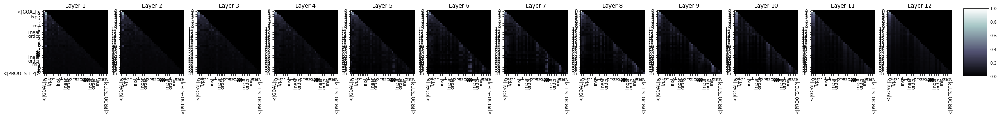

19199it [19:48, 17.75it/s]

  Step 19,200  of  157,103. Loss: 12.639179229736328.   Elapsed: 0:19:48.
>simp [��.map_iff_zero_iff_zero_eq_zero_eq_space ⟩, simp [a,	h_zero_inst_inst_le_iff_1,	h_inst_inst_1,	h_inst_n : ⟩, _, simp [h_1 : α, h, h,	h : ⟨0, h_inst_inst_1,	hfinset.c : ℕ, h, h : ℕ, [h_inst_inst_inst_1 : ⟩, h_inst_inst_inst_inst_eq_1,	h_mul_1 : ℕ�, h_inst_1 : ℕ,	₁, h_1_zero_inst_1 : ℕ, _, h,	h_1 : �
s -> 0.9990659356117249
rw -> 0.000679846212733537
{ -> 0.0002303198998561129
apply -> 2.3158756448538043e-05
re -> 5.707317427550151e-07
ext -> 1.9061194223013445e-07
ind -> 1.6500170119115865e-08
cases -> 5.470774944171808e-09
 Fir -> 1.0685499152174316e-09
sim -> 9.987755067442095e-10


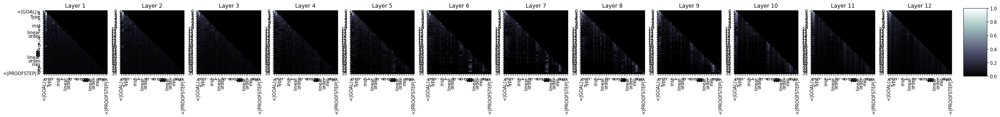

22400it [23:08, 15.36it/s]

  Step 22,400  of  157,103. Loss: 13.811624526977539.   Elapsed: 0:23:08.
>simp [h⟨a, _ _, _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _, _ _ _, _ _ _ _ _ _ _, _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _, _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _ _
apply -> 0.7250052094459534
s -> 0.2745308578014374
{ -> 0.00033567851642146707
rw -> 0.00012822638382203877
have -> 6.483992232020341e-10
cases -> 7.679037961061397e-12
re -> 1.7930527939150065e-12
 Fir -> 1.6732101815186695e-12
t -> 9.601402789147229e-13
 IB -> 1.5534570700116712e-13


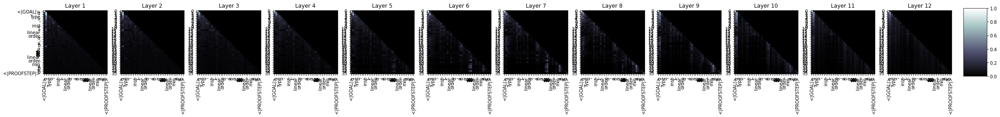

25599it [26:28, 16.48it/s]

  Step 25,600  of  157,103. Loss: 18.552217483520508.   Elapsed: 0:26:29.
>rw [h_eq_instance_iff_zero_eq_le_eq_open_eq_eq_le_iff_instance_le_iff_le_iff_le_instance_eq_iff_iff_le_iff_eq_le_le_iff_le_le_iff_le_eq_iff_le_one_le_iff_of_le_one_iff_fraction_le_le_le_le_iff_le_one_zero_one_inst_one_iff_one_le_iff_one_iff_one_le_one_iff_zero_one_tasktasktasktasktasktasktasktasktasktasktasktasktasktasktasktasktasktasktasktasktasktasktasktasktasktasktasktasktasktasktasktasktasktasktasktasktasktasktasktasktasktasktasktasktasktasktasktasktasktasktasktasktasktasktasktasktasktasktasktasktasktasktask
rw -> 0.9998071789741516
{ -> 0.00017495793872512877
apply -> 9.599890290701296e-06
s -> 8.291232916235458e-06
re -> 7.635229337665805e-09
ex -> 3.4880167643080995e-09
have -> 1.4581257035128914e-10
 Fir -> 1.2540997407217702e-10
cases -> 7.248266570281103e-11
ind -> 4.921477114727679e-11


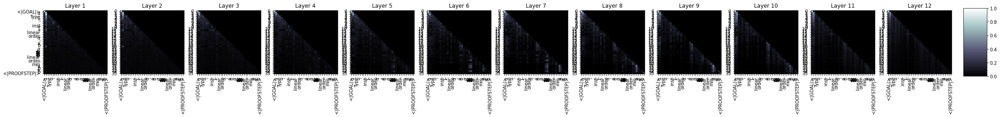

28799it [29:48, 15.95it/s]

  Step 28,800  of  157,103. Loss: 15.96147632598877.   Elapsed: 0:29:49.
>rw [h_le_iff_le_iff_le_le_iff_le_iff_iff_le_le_iff_le_le_le_set_le_mul_le_one_le_iff_one_le_le_le_iff_le_iff_iff_le_one_one_iff_le_iff_le_iff_top_inv_le_iff_le_le_le_one_iff_f_le_inv_one_iff_iff_mul_set_iff_mul_mul_le_le_inv_one_inv_le_iff_le_le_le_le_one_mul_one_le_inv_le_iff_le_le_set_iff_f_iff_one_one_le_le_iff_inv_one_le_iff_le_one_one_one
rw -> 0.9993164539337158
{ -> 0.0005643389304168522
s -> 8.752626308705658e-05
apply -> 3.1656167266191915e-05
have -> 5.422920423825417e-08
re -> 4.230566119645118e-08
cases -> 1.3568248746764766e-09
ref -> 9.011411061798924e-10
ext -> 5.493120958099951e-10
ex -> 3.329256315076634e-10


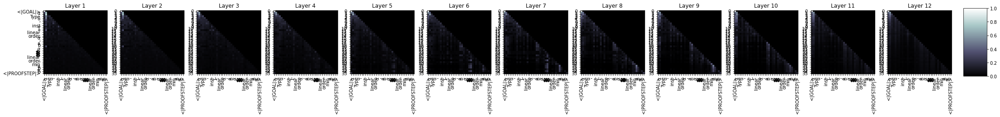

31999it [33:08, 17.28it/s]

  Step 32,000  of  157,103. Loss: 26.8317813873291.   Elapsed: 0:33:08.
>simp [add_iff_eq_iff, ↔ a, exact I, simp [add_eq_eq_top, h, h, exact h, h_inst_inst_inst_inst_top, exact_inst_inst_of_2 : is_eq_­­_eq_inst_iff_eq_C_eq_eq_top, h, h, h, exact h_eq_inst_eq_ Ramsey_eq_ infographic_eq_mul_one_inst_eq_C : is_top, h, mul_eq_one_top : topological_eq_C_eq_eq_eq_C] at h_eq_top, h_iff_C] } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } }
{ -> 0.590246856212616
s -> 0.40741968154907227
rw -> 0.0017681752797216177
re -> 0.00040375374373979867
ref -> 0.00012782456178683788
split -> 2.1253847080515698e-05
apply -> 8.514330147590954e-06
have -> 2.5126869331870694e-06
cases -> 9.89040131571528e-07
ext -> 4.903206445305841e-07


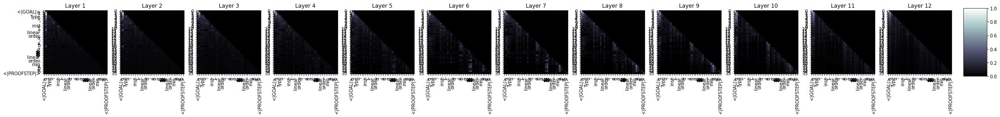

35200it [36:28, 16.44it/s]

  Step 35,200  of  157,103. Loss: 23.906356811523438.   Elapsed: 0:36:28.
>{ rw [a, mul_eq_eq_eq_eq_eq_le_eq_eq_eq_eq_eq_le_le_eq_eq_eq_eq_eq_eq_top, _, _, __le_top, nat.some a, _ _, nat.some_set.some a, hf, h, h, h_inst_inst_inst_inst_inst_eq_1, nat.some a,	h_eq_inst_eq_inst_set. μg_eq_eq_inst_set.some_eq_set_eq_eq_eq_eq_2, h, h_eq_inst_mul_one_of_2 : is_2 : has_le_set_eq_3 :000000_eq_C_top, h, _, b, h_eq_eq_2 : α, h_2
{ -> 0.3866017758846283
apply -> 0.2671259939670563
rw -> 0.22956831753253937
s -> 0.1163768395781517
split -> 0.0003171360003761947
norm -> 7.618318704771809e-06
ex -> 2.0815566585952183e-06
t -> 1.8310267080323683e-07
have -> 8.944638096863855e-08
by -> 1.4452097296668853e-08


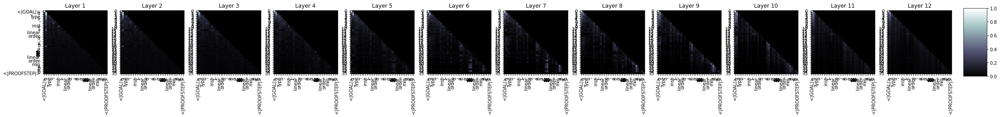

38399it [39:47, 15.14it/s]

  Step 38,400  of  157,103. Loss: 17.185195922851562.   Elapsed: 0:39:48.
>rw [h_eq_instance_le_eq_eq_le_eq_al_iff_le_le_one_mul_iff_sub_ roadmap_le_sub_le_one_top_le_fraction_eq_le_fraction.some a]]]]] } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } }
rw -> 0.9997864365577698
s -> 0.00020468904403969646
apply -> 8.790709216555115e-06
{ -> 7.690056946785262e-08
int -> 4.930947739012481e-08
ext -> 1.4137907511369008e-09
t -> 3.749918431328325e-10
have -> 2.3602128584876425e-10
re -> 9.405844159093846e-11
by -> 8.464667161645067e-11


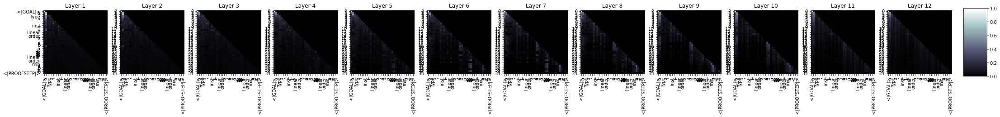

41600it [43:08, 16.53it/s]

  Step 41,600  of  157,103. Loss: 22.989696502685547.   Elapsed: 0:43:08.
>simp only [←_top, _,	h_le_ roadmap_open_instance_eq_le_top,	h : α, hx,	h_inst_top, h_of_instance_le_inst_iff_le_instance_inst_top,	h_inst_eq_one_top_one_le_iff_instance_top, h_set_inst_�_inst_le_le_iff_finset_set_one_inst_eq_instance_one_top,_top, ← h_le_iff_set_one_inst_iff_one_one_one_le_one] at at h_eq_iff_one_of_f_one_top, mul_one_iff_one_one_one_top_iff_one_inst_top_iff_f_top,	h_one_one
s -> 0.9999212026596069
apply -> 4.2362826206954196e-05
rw -> 3.59081823262386e-05
{ -> 5.298222731653368e-07
have -> 6.997159118782292e-08
ext -> 8.095598857948971e-09
t -> 7.032504800719153e-09
re -> 5.561895832784103e-09
cases -> 1.0676792783215205e-09
by -> 7.081036867973012e-10


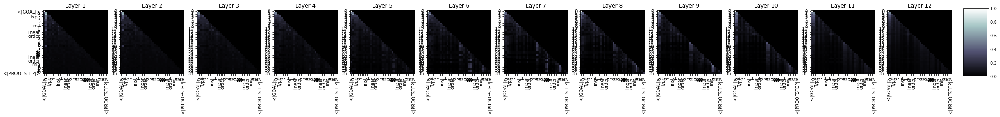

44799it [46:27, 14.81it/s]

  Step 44,800  of  157,103. Loss: 24.358612060546875.   Elapsed: 0:46:28.
>simp [← s, rw [a, rw [uddenly, simp [h_inst_le_of_instance_le_le_of_of_of_instance_le_le_le_le_mul_le_le_le_of_of_instance_le_le_of_of_of_le_of_of_iff_one_le_le_of_le_le_le_le_le_of_of_le_sub_of_of_le_of_le_le_mul_mul_le_le_iff_le_mul_le_le_le_le_le_le_mul_mul_le_le_le_le_of_of_of_le_of_eq_of_mul_le_of_le_of_le_of_le_le_mul_
s -> 0.9999997615814209
rw -> 1.54129779161849e-07
{ -> 1.1558064016981007e-07
have -> 4.17667394003729e-08
re -> 2.5775643841541296e-09
by -> 2.071469940023718e-10
t -> 1.0022740450088552e-11
apply -> 1.837025974046891e-12
ext -> 3.875579327947132e-13
sim -> 4.725453494757066e-14


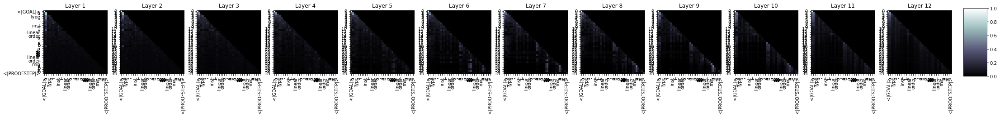

47999it [49:47, 17.18it/s]

  Step 48,000  of  157,103. Loss: 33.747432708740234.   Elapsed: 0:49:48.
>simp only [add_eq_eq_eq_eq_eq_eq_eq_eq_eq_eq_eq_eq_le_eq_le_eq_eq_eq_eq_continued_eq_le_eq_eq_eq_le_eq_eq_eq_eq_mul_eq_le_eq_le_le_le_eq_eq_eq_mul_le_mul_instance_eq_mul_contin_mul_mul_eq_mul_mul] } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } }
s -> 0.9994074106216431
apply -> 0.0005403146496973932
{ -> 3.7585436075460166e-05
ex -> 9.870645953924395e-06
have -> 4.785530109074898e-06
re -> 7.050512351725047e-08
rw -> 5.7690112242880787e-08
int -> 3.083926358726785e-08
split -> 1.129917759357113e-08
by -> 8.358741254710367e-09


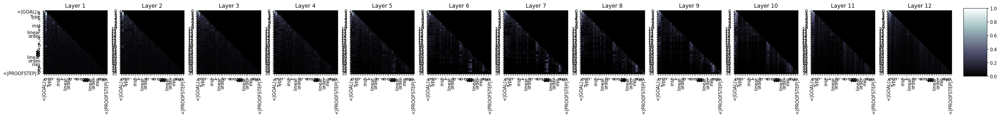

51200it [53:08, 16.26it/s]

  Step 51,200  of  157,103. Loss: 24.303232192993164.   Elapsed: 0:53:08.
>rw [h_le_instance_iff_of_iff_of_mul_mul_of_of_one_mul_iff_mul_mul_iff_le_mul_mul_lt_of_mul_mul_of_of_mul_lt_of_one_mul_mul_mul_mul_mul_mul_mul_mul_of_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_m_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_m
rw -> 0.9999967813491821
s -> 2.4735545594012365e-06
apply -> 7.420615020237165e-07
{ -> 6.125370788367945e-08
cases -> 3.397712555752719e-09
re -> 1.085038392467652e-09
have -> 1.016930095687485e-09
ext -> 2.282359579108828e-10
by -> 1.1520991799462976e-10
split -> 4.8346108366681406e-11


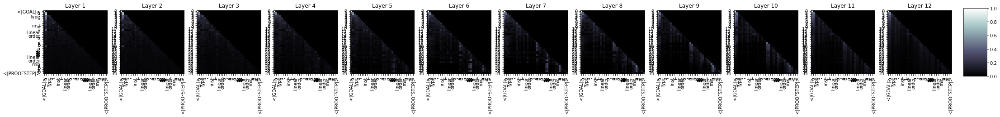

54400it [56:29, 16.13it/s]

  Step 54,400  of  157,103. Loss: 13.559989929199219.   Elapsed: 0:56:29.
>{ rw [ Roche_instance_iff_le_le_le_le_le_instance_le_le_of_of_le_le_le_le_le_instance_le_le_le_le_le_le_le_of_eq_le_le_le_le_le_le_le_of_le_le_of_le_le_of_le_le_le_le_of_le_le_le_of_of_le_le_le_le_le_le_le_le_le_le_le_le_of_of_le_le_le_le_le_le_le_mul_le_le_le_le_le_le_le_le_le_le_of_le_le_le_le_le_le_of_le_of_le_le_ retrieve_le
{ -> 0.9693901538848877
rw -> 0.030070295557379723
s -> 0.00046519405441358685
ext -> 3.919551818398759e-05
split -> 2.6751869881991297e-05
apply -> 6.484296591224847e-06
re -> 1.5408370472869137e-06
have -> 2.017595051029275e-07
by -> 1.8541774693403568e-07
ex -> 1.3966777956397891e-08


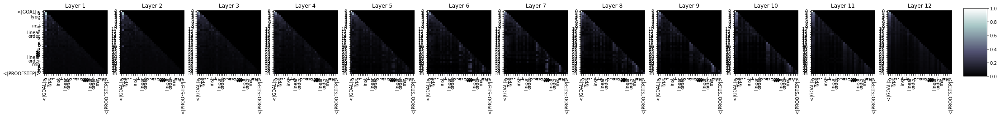

57599it [59:48, 16.97it/s]

  Step 57,600  of  157,103. Loss: 19.995059967041016.   Elapsed: 0:59:48.
>rw [← commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commission commis

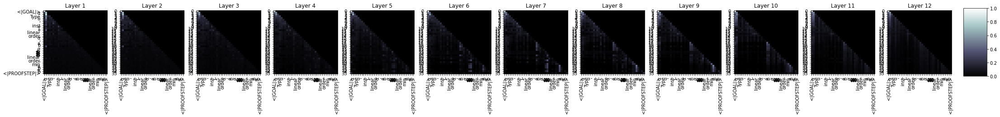

60800it [1:03:08, 13.29it/s]

  Step 60,800  of  157,103. Loss: 12.3357572555542.   Elapsed: 1:03:09.
>rw [←_eq_eq_eq_eq_iff_eq_eq_eq_eq_eq_eq_eq_le_iff_eq_eq_le_eq_top, h_eq_eq_eq_inst_eq_le_eq_eq_top, h_eq_iff_zero_eq_eq_eq_eq_eq_iff_top, h_le_le_le_eq_le_iff_eq_eq_inst_zero_le_eq_eq_eq_eq_le_mul_le_eq_le_eq_ Brewing_eq_eq_eq_eq_eq_eq_le_le_m_m_eq_iff_mul_eq_eq_eq_eq_mul_eq_mul_eq_eq_mul_le_eq_m_iff_to_mul_eq_mul_
rw -> 0.9707069993019104
s -> 0.028993861749768257
have -> 0.00013547830167226493
re -> 0.00011835033365059644
ext -> 2.094433511956595e-05
{ -> 1.7900567399919964e-05
ex -> 4.446057118911995e-06
split -> 1.6789032315500663e-06
apply -> 3.4474473409318307e-07
t -> 5.531110236489667e-09


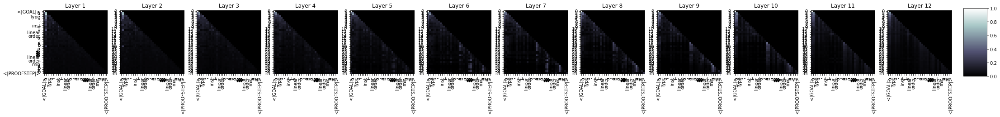

64000it [1:06:27, 16.53it/s]

  Step 64,000  of  157,103. Loss: 17.58812713623047.   Elapsed: 1:06:27.
>rw [being_eq_eq_eq_eq_eq_eq_eq_eq_eq_eq_eq_eq_eq_le_eq_eq_eq_eq_eq_eq_eq_mul_eq_eq_eq_mul_eq_eq_m_eq_eq_eq_eq_mul_eq_eq_mul_le_mul_mul_to_mul_mul_m_mul_le_mul_mul_eq_mul_m_eq_mul_mul_mul_mul_mul_mul_mul_mul_eq_mul_mul_eq_mul_mul_mul_mul_m_eq_mul_eq_mul_m_mul_m_eq_mul_mul_mul_eq_m_
rw -> 0.9840893745422363
{ -> 0.015766412019729614
apply -> 8.580416033510119e-05
s -> 5.047746526543051e-05
cases -> 3.750006044356269e-06
have -> 1.5626507092747488e-06
ext -> 1.4044321687833872e-06
int -> 1.1994428632533527e-06
split -> 1.0431270069943821e-08
re -> 3.5669227571588635e-09


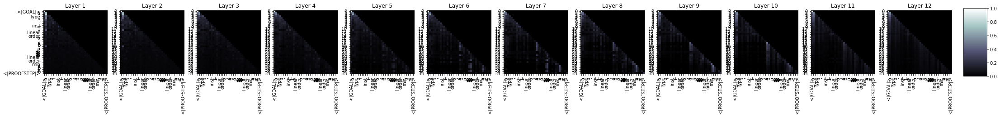

67199it [1:09:47, 17.33it/s]

  Step 67,200  of  157,103. Loss: 17.20916175842285.   Elapsed: 1:09:47.
>cases a b, b, mul_le_le_eq_le_le_le_le_of_le_lt_eq_le_le_le_le_le_instance_le_le_le_le_le_eq_le_le_one_le_le_le_le_le_le_le_one_le_le_le_le_le_of_ benchmark_le_le_le_of_le_le_le_le_of_le_le_le_le_le_le_le_le_le_le_le_fraction_le_le_eq_le_le_le_le_le_of_le_le_le_f_le_fst_le_fraction_le_f_le_of_le_le_le_le_le_le_le_of_le_le_eq_le
{ -> 0.5664612650871277
cases -> 0.39721357822418213
rw -> 0.0201332475990057
s -> 0.014425735920667648
ex -> 0.0015925548505038023
int -> 0.00011105737939942628
re -> 6.175947783049196e-05
ext -> 3.7210310210866737e-07
split -> 2.0680342061041301e-07
sim -> 5.360612576055246e-08


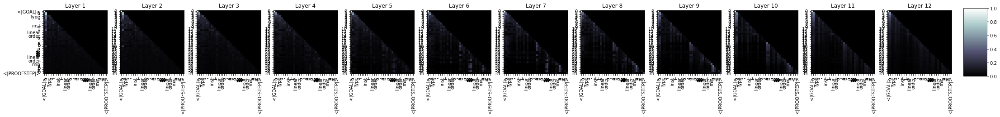

70399it [1:13:06, 17.92it/s]

  Step 70,400  of  157,103. Loss: 19.178089141845703.   Elapsed: 1:13:07.
>rw [← w, mul_le_eq_le_le_eq_le_le_eq_le_le_le_le_le_le_eq_le_eq_le_le_le_le_le_eq_le_le_le_le_le_le_le_le_le_le_eq_le_iff_le_le_le_iff] } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } }
rw -> 0.9999860525131226
re -> 7.199781521194382e-06
{ -> 6.63558375890716e-06
s -> 5.67735547463144e-08
cases -> 6.183165784934275e-11
have -> 1.5714566800606455e-11
sim -> 1.1287856500202809e-12
ext -> 1.05281842271987e-12
apply -> 7.880854714474583e-13
int -> 5.612290146506105e-13


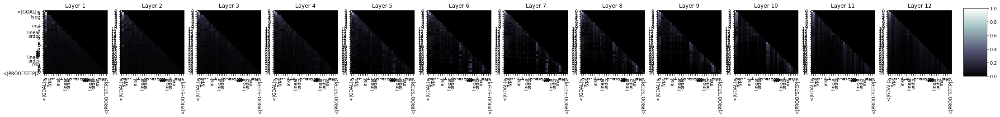

73600it [1:16:27, 15.14it/s]

  Step 73,600  of  157,103. Loss: 31.087820053100586.   Elapsed: 1:16:28.
>rw [← wseq.le_le_le_le_le_le_le_le_le_le_le_le_le_le_zero_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_of_le_le_le_le
rw -> 0.8209477066993713
cases -> 0.09713389724493027
re -> 0.04890986159443855
sim -> 0.03073805756866932
{ -> 0.0019107318948954344
split -> 0.00025772087974473834
ext -> 5.5370281188515946e-05
s -> 4.359046943136491e-05
int -> 1.910007540573133e-06
have -> 1.051544131769333e-06


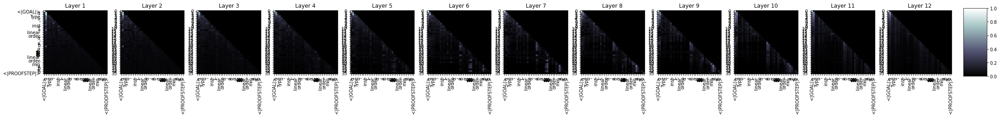

76799it [1:19:47, 15.24it/s]

  Step 76,800  of  157,103. Loss: 13.255476951599121.   Elapsed: 1:19:48.
>{ ext_le_iff_eq_iff, ↔ a, mul_iff_iff_iff_iff_iff_iff_iff, mul_comm_iff_iff_inst_iff_inst_iff_le_iff_inst_5, mul_top_iff,_inst_iff, mul_inst_t_set_eq_set_iff_iff, exact_inst_iff_inst_set_inst_space_set_ 242_iff_inst_4, mul_top, mul_inst_space_set_eq_top, M, M, mul_inst_iff_inst_inst_inst_inst_inst_t_top,	_t_m : norm_iff_group M,_set_inst_top, mul_space, M,_inst_set_inst_iff_inst_inst_hom_set_inst_inst_2 : norm_4 : measurable
apply -> 0.8142274022102356
{ -> 0.18407286703586578
rw -> 0.0009459142456762493
ex -> 0.0006464172038249671
sim -> 8.193793473765254e-05
s -> 1.390183751937002e-05
ext -> 8.964067092165351e-06
split -> 1.9349508875166066e-06
have -> 6.741669835719222e-07
int -> 1.481054834329143e-08


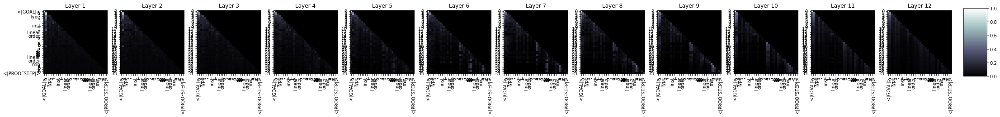

79999it [1:23:04, 16.88it/s]

  Step 80,000  of  157,103. Loss: 15.546911239624023.   Elapsed: 1:23:05.
>{ rw [add_iff_iff_iff_iff_le_iff_le_iff_iff_le_iff_iff_le_iff_le_iff_le_iff_iff_le_le_iff_iff_le_of_iff_iff_le_le_iff_le_le_iff_le_iff_le_iff_of_le_le_of_of_of_le_of_of_le_iff_le_of_of_iff_iff_iff_of_le_le_iff_le_le_le_le_of_of_of_le_iff_of_le_le_le_le_mul_iff_of_of_of_of_le_le_le_iff_le_iff_of_of_le_le_iff_le_le_le_iff_le_le_iff_of
{ -> 0.8853261470794678
rw -> 0.10332398861646652
re -> 0.009950563311576843
s -> 0.0012386078014969826
sim -> 0.00011596600234042853
split -> 3.8077618228271604e-05
apply -> 5.084782515041297e-06
cases -> 8.861546234584239e-07
have -> 6.568482717739244e-07
ext -> 5.7942084907836033e-08


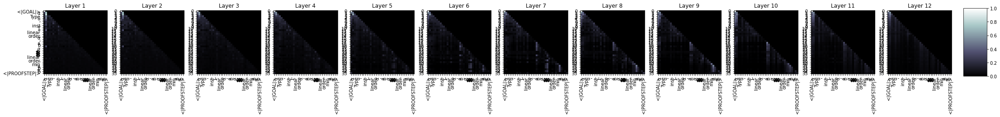

83199it [1:26:26, 15.31it/s]

  Step 83,200  of  157,103. Loss: 19.12321662902832.   Elapsed: 1:26:26.
>simp [← s, b, b, ↔ a, b, simp, exact, simp, b, simp, simp, _, b, exact, simp : ⟩, simp [h : α,, simp [h : ⟩, simp, simp, simp [←, simp, exact, simp, h, simp q, h, simp,,, simp : α, simp, h, exact h, _, simp : α, h, } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } }
s -> 0.9999992847442627
norm -> 5.358559178603173e-07
apply -> 1.742857875797199e-07
rw -> 4.086867022579099e-08
cases -> 1.758101753068786e-08
{ -> 7.934913170970503e-09
sim -> 3.3244107466856576e-09
int -> 1.8461112638590293e-09
have -> 4.6490417071609613e-10
ext -> 4.6155024246985477e-10


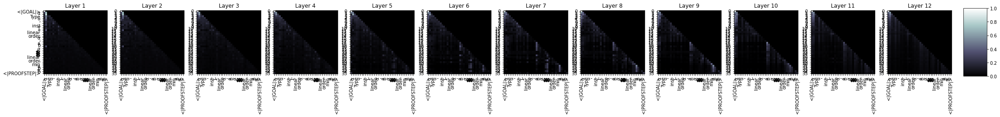

86399it [1:29:46, 17.06it/s]

  Step 86,400  of  157,103. Loss: 13.062111854553223.   Elapsed: 1:29:47.
>rw [← h, h_iff_eq_eq_eq_eq_eq_eq_eq_eq_eq_eq_iff_iff_eq_eq_eq_eq_le_le_group_iff_iff_eq_le_iff_iff_le_le_eq_iff_eq_iff_le_eq_le_iff_iff_iff_le_iff_eq_�_eq_eq_space_iff_iff_le_iff_iff_iff_iff_iff_mul_iff_iff, M, h_iff_le_iff_iff_iff_iff_eq_iff_iff_eq_le_eq_mul_eq_iff_mul_le_iff_le_le_mul_iff_iff_eq_le_m_iff_le_le_contin_iff, h_mul_le_one_le
{ -> 0.8041808009147644
rw -> 0.18762129545211792
int -> 0.007793368771672249
s -> 0.00023044263070914894
split -> 0.00012266664998605847
sim -> 4.1049643186852336e-05
norm -> 1.0239526091027074e-05
ext -> 6.775965744054702e-08
have -> 3.5050258251345667e-09
 heaviest -> 2.7372664135327796e-09


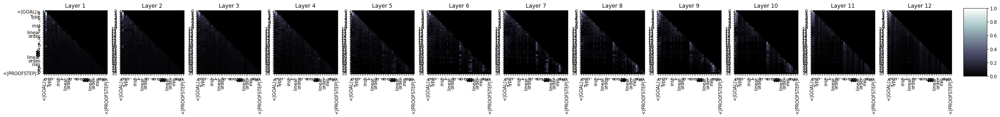

89599it [1:33:07, 16.00it/s]

  Step 89,600  of  157,103. Loss: 19.887083053588867.   Elapsed: 1:33:08.
>rw [← h_eq_mul_eq_eq_eq_eq_eq_eq_eq_eq_eq_�_eq_eq_eq_eq_�_eq_eq_eq_eq_eq_of_eq_mul_eq_eq_mul_eq_mul_eq_mul_�_eq_eq_eq_eq_instance_mul_eq_eq_eq_eq_eq_mul_contin_n_mul_mul_mul_mul_mul_mul_eq_mul_mul_mul_mul_mul_eq_eq_mul_mul_eq_mul_eq_eq_eq_eq_eq_mul_mul_eq_mul_mul_le_mul_mul_mul_mul_mul_mul
rw -> 0.8960099220275879
s -> 0.08104689419269562
{ -> 0.022912707179784775
norm -> 2.6500500098336488e-05
ext -> 2.346693918298115e-06
int -> 1.2920481822220609e-06
sim -> 2.7698618509930384e-07
split -> 4.6908343875884384e-08
cases -> 2.7247031297861213e-08
t -> 1.3559761313786112e-08


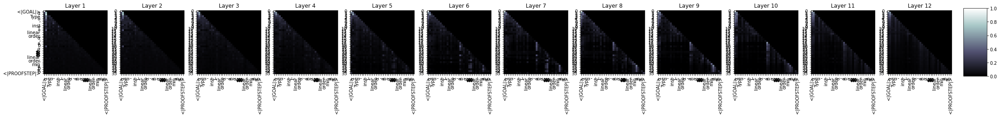

92799it [1:36:27, 15.69it/s]

  Step 92,800  of  157,103. Loss: 19.78138542175293.   Elapsed: 1:36:28.
>rw [nat_eq_eq_lt_eq_eq_eq_eq_eq_eq_eq_eq_eq_eq_le_eq_eq_eq_eq_eq_eq_eq_space α, ←, ← (𝓝≥0, h_eq_inst_eq_set.le_eq_set α, h_eq_eq_set_inst_inst_le_eq_eq_R] at h_eq_of_eq_top, mul_inst_of_set.to_top, ← h_eq_eq_set_eq_eq_eq_eq_eq_eq_le_le_one_one_set_ᾰ_eq_eq_one_top, ←_one_set.to_set_one_le_inst_eq_eq_eq_le_of_le_le_one_of
rw -> 0.9838253855705261
s -> 0.016161847859621048
{ -> 8.534340850019362e-06
int -> 3.1515116916125407e-06
have -> 6.325050776467833e-07
ext -> 1.7193720225350262e-07
t -> 1.619457492552101e-07
cases -> 1.0582646581269728e-07
sim -> 2.4006347132399242e-08
ex -> 2.1819372975073748e-08


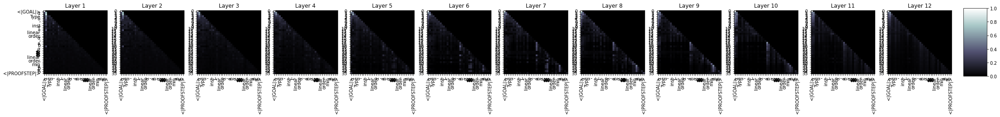

95999it [1:39:48, 16.25it/s]

  Step 96,000  of  157,103. Loss: 15.409905433654785.   Elapsed: 1:39:48.
>simp [h⟨ b⟩, h⟨_le_iff_iff_iff_num_iff_num_iff_iff_iff_iff_iff_iff_iff_le_le_iff_le_iff_le_iff_iff_le_le_iff_le_le_le_iff_iff_iff_le_iff_iff_le_le_iff_iff_le_le_le_iff_le_le_iff_iff_iff_iff_iff_iff_le_iff_iff_iff_iff_le_iff_iff_iff_iff_iff_le_iff_eq_le_iff_top, ←_iff_set_iff_le_le_iff_iff_eq_iff_iff_iff_iff_iff_iff_le_inst_of_iff_zero_le_iff_le_le_
s -> 0.8931248188018799
re -> 0.10109197348356247
rw -> 0.004656962584704161
int -> 0.001093672588467598
cases -> 2.7802241675090045e-05
sim -> 1.9209098809369607e-06
{ -> 1.663601665313763e-06
t -> 1.1457769915068639e-06
by -> 3.3867664228637295e-08
ext -> 3.075838250765628e-08


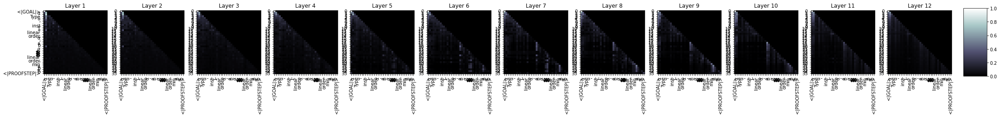

99200it [1:43:08, 15.77it/s]

  Step 99,200  of  157,103. Loss: 23.368894577026367.   Elapsed: 1:43:08.
>simp [h⟨_iff_iff_iff_le_iff_iff_iff, nat.is_iff_iff_iff_iff_iff_iff_iff_iff_iff_iff_iff_iff_iff_iff_le_iff_iff_le_C_iff_eq_iff_iff_iff_one_set_iff_iff_one_one_iff_iff_iff_iff_iff_one_iff_iff_iff_iff_iff_iff_iff] } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } }
s -> 0.6286109089851379
rw -> 0.2991540729999542
{ -> 0.07221503555774689
ex -> 1.7058000594261102e-05
re -> 1.2293581903577433e-06
ext -> 1.1339039929225692e-06
t -> 5.296448080116534e-07
apply -> 7.208655716794965e-08
have -> 8.023111064403565e-09
cases -> 4.979762824319778e-09


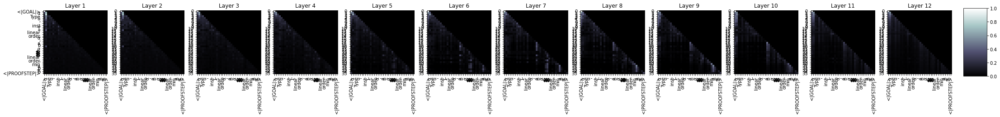

102399it [1:46:27, 17.69it/s]

  Step 102,400  of  157,103. Loss: 15.313307762145996.   Elapsed: 1:46:28.
>simp [h⟨a b⟨⟨a⟨⟨⟨simp [h⟨⟨⟨⟨⟨⟨⟨⟨⟨⟨⟨⟨⟨⟩⟨⟨⟨⟨⟨⟩⟩⟨⟨⟨⟨⟨⟨⟨⟨⟩⟩⟩⟨⟨⟩⟩⟩⟨⟨⟨⟨⟨⟩⟨⟨⟨⟨⟨⟩⟦�⟨⟩⟨⟩⟨⟨�
s -> 0.999998927116394
cases -> 7.932557082312996e-07
rw -> 1.8926621692116896e-07
apply -> 4.971626310634747e-08
ext -> 3.252496938443983e-08
{ -> 4.1067088618618186e-10
ex -> 3.735563594564617e-11
re -> 1.5179191237280065e-11
t -> 5.529844377544224e-12
sim -> 3.416286784713174e-12


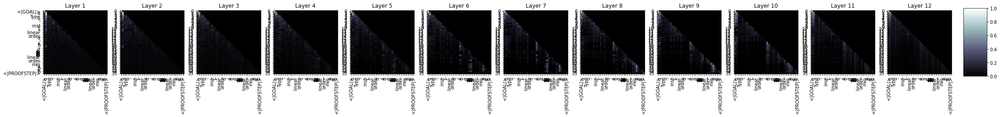

105600it [1:49:47, 16.05it/s]

  Step 105,600  of  157,103. Loss: 15.916008949279785.   Elapsed: 1:49:48.
>simp [h⟨_iff_eq_eq_eq_eq_eq_iff_eq_eq_eq_eq_iff_iff] } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } }
s -> 0.9998385906219482
rw -> 0.00016126013360917568
{ -> 1.3513660235275893e-07
ext -> 3.887280719538921e-09
sim -> 2.5970536832176094e-10
by -> 1.0182164139616035e-10
t -> 5.279858841800156e-11
have -> 5.137992115100687e-11
ex -> 3.8695062778981715e-12
cases -> 2.1714409784157063e-12


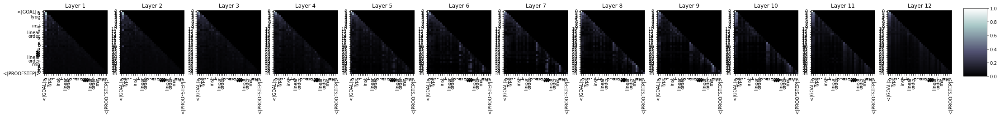

108799it [1:53:08, 15.18it/s]

  Step 108,800  of  157,103. Loss: 18.236753463745117.   Elapsed: 1:53:09.
>simp [measure_iff_iff_eq_eq_eq_eq_top, h, ↔_eq_iff_iff_iff_eq_eq_inst_ 184_top_top_top, h_inst_inst_iff_le_top_iff_top_eq_iff_inst_top_eq_top_inst_iff_zero_comm_top_instance_top_top_comm_top_top_top_eq_top_iff_set_measure_comm_set_measure_top_inst_group_set_top_top_top_top_measure_group_comm_f_hom_top_top,_top_f_comm_zero]] } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } }
s -> 0.9941503405570984
rw -> 0.005073900334537029
have -> 0.0007670444319956005
by -> 3.901657692040317e-06
int -> 3.738899977179244e-06
t -> 6.107638910179958e-07
ext -> 2.7283391546006897e-07
ex -> 1.0757535306993304e-07
{ -> 7.82028237722443e-08
sim -> 1.4813414495051802e-08


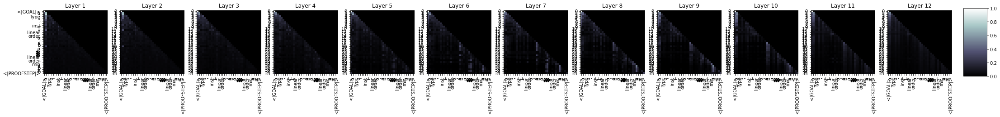

111999it [1:56:28, 17.64it/s]

  Step 112,000  of  157,103. Loss: 16.207141876220703.   Elapsed: 1:56:29.
>rw [h_eq_iff_iff_iff_eq_le_eq_open_eq_mul_eq_mul_mul_mul_eq_eq_eq_eq_iff_mul_eq_mul_le_mul_mul_mul_mul_eq_mul_m_m_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_m_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_m
rw -> 0.9869628548622131
s -> 0.012976239435374737
{ -> 5.36994484718889e-05
have -> 4.5985721044417005e-06
ex -> 2.407264219073113e-06
split -> 1.346612350516807e-07
apply -> 1.0332952626868064e-07
re -> 3.492112199410258e-08
sim -> 3.2578881814515626e-08
by -> 2.5014569970949196e-08


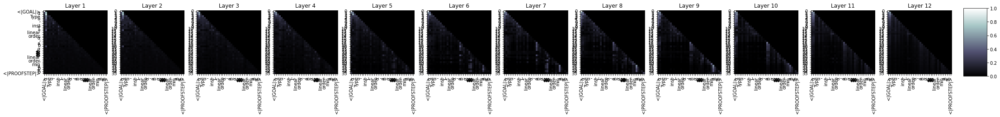

115200it [1:59:50, 16.83it/s]

  Step 115,200  of  157,103. Loss: 18.75214195251465.   Elapsed: 1:59:50.
>simp [h_iff_le_iff_eq_iff_eq_iff_mul_iff_iff_iff_iff_iff_iff_iff_iff_iff_iff_iff_iff_iff_iff_iff_iff_iff_iff_space.le_mul_iff_mul_iff_mul_iff_iff_mul_iff_mul_mul_mul_mul_mul_iff_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_iff_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_m
s -> 0.999984860420227
rw -> 1.5168602658377495e-05
have -> 5.402458480574523e-10
by -> 5.358740118310834e-10
{ -> 6.733397867053625e-11
split -> 1.2413885891460197e-11
ext -> 7.71719580600072e-12
apply -> 3.371033053395367e-12
cases -> 4.686198261036334e-13
sim -> 3.449774916685494e-13


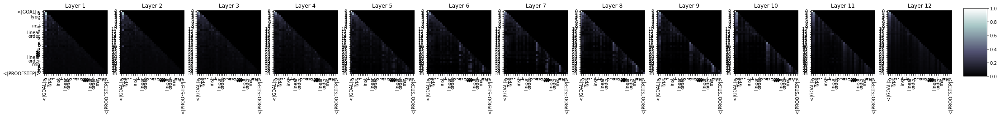

118399it [2:03:09, 12.39it/s]

  Step 118,400  of  157,103. Loss: 10.455610275268555.   Elapsed: 2:03:10.
>rw [nat_eq_instance_iff_zero_iff_zero_zero_zero_iff_iff_iff_zero_iff_zero_iff_eq_iff_zero_iff_iff_iff_iff_zero_iff_iff_iff_iff_iff_of_zero_iff_iff_iff_iff_iff_iff_zero_iff_iff_zero_zero_iff_iff_of_iff_iff_space.map_iff_zero_zero_zero_iff_iff_iff_of_zero_iff_iff_zero_zero_iff_iff_iff_space_of_iff_iff_iff_zero_iff_space_zero_iff_iff_iff_zero_of_iff_iff_top_iff_zero_zero_iff_zero_iff_zero_iff_zero_inst_top_iff_zero_of_of_zero_zero_
s -> 0.8167763352394104
rw -> 0.18321773409843445
{ -> 5.96246400164091e-06
apply -> 3.694443151402993e-08
have -> 1.1911662767261078e-08
ext -> 9.777879839134584e-09
sim -> 9.447158610953466e-09
cases -> 5.223509624840972e-09
split -> 4.53888704399219e-09
re -> 2.60874016833057e-10


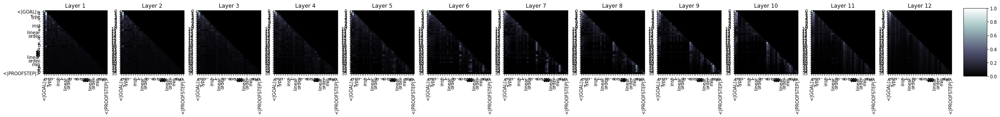

121600it [2:06:31, 16.09it/s]

  Step 121,600  of  157,103. Loss: 15.88370418548584.   Elapsed: 2:06:31.
>simp [mul_instance_of_eq_eq_eq_eq_eq_eq_eq_eq_eq_eq_instance_iff_eq_mul_zero, mul_instance_eq_eq_eq_eq_instance_mul_eq_of_mul_eq_mul_one_mul_eq_mul_of_eq_mul_mul_zero] at h_mul_mul_mul_ Cherokee, mul_to_mul_mul_mul_mul_le_mul_mul_mul_mul_mul_mul_le_le_le_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_le_mul
s -> 0.9923416376113892
{ -> 0.0033320242073386908
rw -> 0.0029406356625258923
apply -> 0.0013854593271389604
sim -> 1.5919400198072253e-07
have -> 7.677297020336482e-08
ext -> 2.7541926517216098e-09
cases -> 1.2320424680467568e-09
ex -> 8.278767255065489e-11
re -> 6.849946304621213e-11


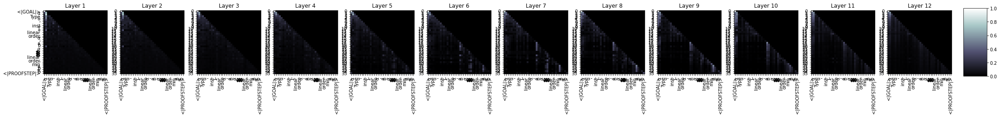

124799it [2:09:49, 14.88it/s]

  Step 124,800  of  157,103. Loss: 17.893510818481445.   Elapsed: 2:09:50.
>simp [add_iff_zero_comm_zero_iff_set_iff_iff_iff_iff_comm_iff_iff_iff, mul_zero_iff_iff_iff_iff_top, mul_le_inst_iff_le_iff_set_iff_instance_zero_iff_zero_set_space α, mul_iff_iff_set_set_iff_iff_space_inst_space_set_zero_le_iff_space_iff_top, mul_set_space_set_iff_measure_set_inst_top_set_space_set_set_set_space_top_space_set_space_top,_set_iff_set_iff_set_set_set_inst_space_iff_space_zero_inst_set_space_zero_inst_inst_iff, mul_le_space_set_set_
s -> 0.721596360206604
rw -> 0.2774498164653778
ext -> 0.0005289926775731146
apply -> 0.0002736245223786682
sim -> 8.463374979328364e-05
have -> 6.65561092318967e-05
cases -> 3.73728674674112e-08
int -> 3.061872533294263e-08
re -> 1.0829507957055284e-08
ex -> 1.0825212726217615e-08


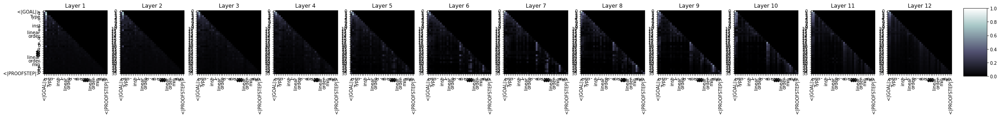

127999it [2:13:09, 17.47it/s]

  Step 128,000  of  157,103. Loss: 17.309919357299805.   Elapsed: 2:13:10.
>apply_instance_eq_instance_le_eq_le_le_of_le_of_of_of_top_of_le_le_le_top, mul_instance_le_of_le_le_iff_le_of_of_of_le_le_of_le_of_of_le_of_le_le_of_le_le_of_of_of_of_le_of_le_le_le_of_of_of_le_le_of_le_of_of_le_mul_le_le_le_of_mul_of_le_le_le_le_of_mul_of_le_le_le_le_le_le_le_le_le_of_of_le_le_le_le_le_of_le_of_le_le_of_of
apply -> 0.6145811080932617
s -> 0.3058408498764038
rw -> 0.07475877553224564
cases -> 0.0034485890064388514
ext -> 0.001088421791791916
have -> 0.00011938792886212468
re -> 9.398790280101821e-05
{ -> 5.734023579861969e-05
sim -> 5.987898475723341e-06
split -> 5.402314855018631e-06


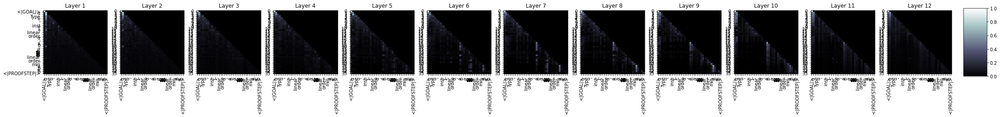

131199it [2:16:28, 18.19it/s]

  Step 131,200  of  157,103. Loss: 21.60091781616211.   Elapsed: 2:16:29.
>simp [a b, mul_lt_eq_eq_le_eq_eq_eq_eq_iff_eq_eq_le_le_eq_eq_eq_eq_iff_le_iff_le_eq_eq_iff_iff_iff_le_le_eq_le_eq_iff_le_iff_le_iff_of_le_set_eq_iff_le_eq_eq_le_le_le_le_iff_le_le_le_le_le_le_eq_le_le_instance_le_le_set_of_iff_iff_iff_le_instance_le_le_le_mul_iff_le_le_le_one_le_le_le_iff_le_iff_eq_le_iff_le_iff_eq_of_le_iff_le_le_instance_le
s -> 0.6020640730857849
rw -> 0.39671534299850464
{ -> 0.0012182580539956689
ref -> 1.0001739383369568e-06
cases -> 6.649036095041083e-07
ext -> 3.726187571828632e-07
have -> 2.5410582793483627e-07
sim -> 6.227892157539827e-08
t -> 1.6105980549241394e-08
ex -> 1.4009890136890135e-08


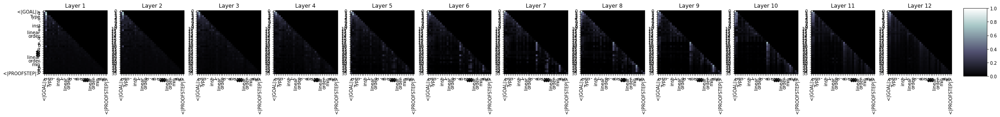

134400it [2:19:48, 16.55it/s]

  Step 134,400  of  157,103. Loss: 13.023539543151855.   Elapsed: 2:19:48.
>simp [add_eq_add, nat.div_eq_eq_eq_le_eq_eq_eq_eq_eq_eq_eq_eq_eq_instance_eq_iff_eq_eq_eq_�_eq_add_le_eq_iff_eq_eq_le_one_eq_eq_eq_eq_le_eq_eq_instance_mul_eq_mul_le_le_eq_le_le_le_one_eq_of_mul_le_eq_mul_eq_le_le_mul_eq_one] } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } }
s -> 0.999601423740387
rw -> 0.00039817646029405296
apply -> 4.2266600530638243e-07
have -> 3.584149865787367e-08
split -> 7.675354574132598e-09
cases -> 4.741670389663e-10
ex -> 2.6774474304325224e-10
sim -> 8.236770293601481e-11
by -> 5.050734136480273e-11
{ -> 2.2790640902270454e-11


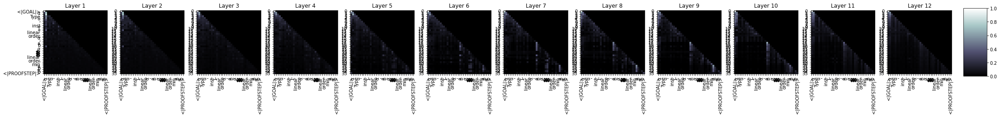

137599it [2:23:07, 17.30it/s]

  Step 137,600  of  157,103. Loss: 13.349273681640625.   Elapsed: 2:23:07.
>apply_eq_order.le_le_zero, nat.le_zero_zero_zero] } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } }
apply -> 0.43765509128570557
s -> 0.33358609676361084
rw -> 0.22731244564056396
have -> 0.000654603005386889
sim -> 0.0006490976666100323
re -> 0.00012372566561680287
{ -> 1.678345688560512e-05
split -> 1.0036967523774365e-06
ex -> 8.111766760521277e-07
t -> 3.105727444108197e-07


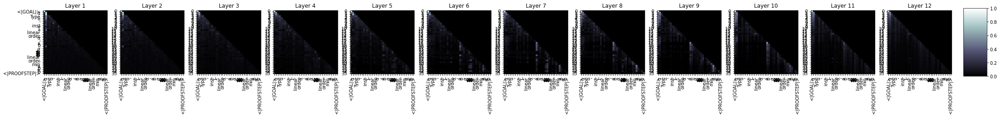

140799it [2:26:25, 15.67it/s]

  Step 140,800  of  157,103. Loss: 17.333877563476562.   Elapsed: 2:26:26.
>simp [mem_eq_numnum_eq_eq_eq_eq_open_num, exact ℝ, mul_num, mul_inst_eq_inst_one_top, mul_top, exact ℝ, exact ℝ, mul_inst_inst_inst_eq_inst_inst_one_inst_inst_eq_one_iff_top_top_one_eq_inst_set.mem_one] at, mul_inst_at_one_inst_eq_Increases_eq_top_one_one_eq_top_top_one] at_of_one_top_topableable_eq_one_eq_top, ←_measure_of_of_top,_top, exact ℝ, mul_of_continuous_one_inst_anish, exact_inst_iff] } } } } } } } } } }
s -> 0.7969805598258972
apply -> 0.17032769322395325
have -> 0.022358331829309464
ext -> 0.006522998213768005
rw -> 0.002933893818408251
norm -> 0.0005856393836438656
sim -> 0.00011520492262206972
split -> 9.636458707973361e-05
{ -> 7.713101513218135e-05
by -> 2.09604445444711e-06


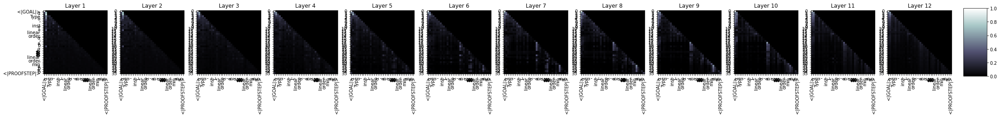

143999it [2:29:46, 16.61it/s]

  Step 144,000  of  157,103. Loss: 13.239302635192871.   Elapsed: 2:29:47.
>simp [← s, b, exact hallmark hallmark hallmark hallmark hallmark hallmark hallmark hallmark hallmark hallmark hallmark hallmark hallmark hallmark hallmark hallmark hallmark hallmark hallmark hallmark hallmark hallmark hallmark hallmark hallmark hallmark hallmark hallmark hallmark hallmark hallmark hallmark hallmark hallmark hallmark hallmark hallmark hallmark hallmark hallmark hallmark hallmark hallmark hallmark hallmark hallmark hallmark hallmark hallmark hallmark hallmark hallmark hallmark hallmark hallmark hallmark hallmark hallmark hallmark hallmark hallmark hallmark hallmark hallmark hallmark hallmark hallmark hallmark hallmark hallmark hallmark hallmark hallmark hallmark hallmark hallmark hallmark hallmark hallmark hallmark hallmark hallmark hallmark hallmark hallmark hallmark hallmark hallmark hallmark hallmark hallmark hallmark hallmark hallmark hallmark hallmark hallmark hallmark hallmark hallmark hall

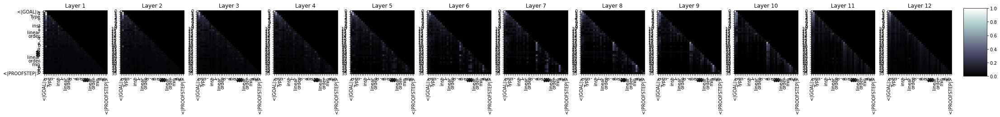

147200it [2:33:06, 16.27it/s]

  Step 147,200  of  157,103. Loss: 14.406449317932129.   Elapsed: 2:33:07.
>rw [mul_eq_eq_eq_mul_mul_mul_mul_mul_mul_mul_eq_mul_le_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_eq_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_
rw -> 0.9363617897033691
s -> 0.06355611234903336
apply -> 4.555869963951409e-05
have -> 3.504638880258426e-05
ext -> 8.246019547186734e-07
split -> 3.092947622462816e-07
ex -> 2.5585154617147055e-07
int -> 1.3500751094852603e-07
{ -> 2.203759619234802e-09
t -> 1.1984924164210042e-09


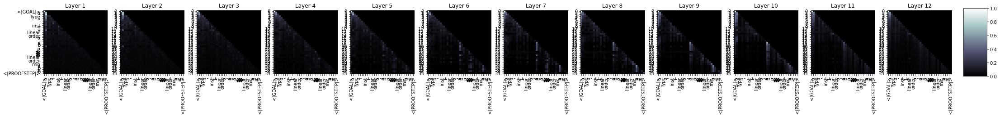

150399it [2:36:26, 16.42it/s]

  Step 150,400  of  157,103. Loss: 17.977420806884766.   Elapsed: 2:36:27.
>simp [ Roche_eq_eq_order.measure_eq_eq_eq_eq_eq_eq_eq_eq_le_eq_eq_eq_eq_eq_top_iff_top] } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } }
s -> 0.9968710541725159
apply -> 0.0018058069981634617
rw -> 0.001292355009354651
have -> 1.941978007380385e-05
split -> 4.929156602884177e-06
ex -> 4.559837179840542e-06
{ -> 9.010831831801625e-07
re -> 8.174527010851307e-07
ind -> 7.545474289827325e-08
cases -> 6.085064541139218e-08


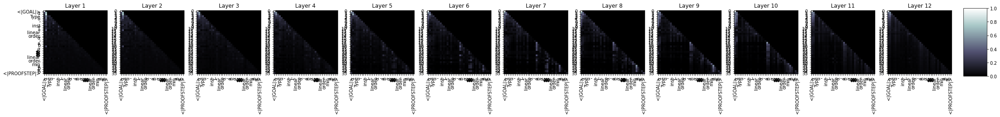

153599it [2:39:46, 16.24it/s]

  Step 153,600  of  157,103. Loss: 22.276395797729492.   Elapsed: 2:39:46.
>simp [mul_eq_eq_eq_eq_eq_eq_eq_eq_eq_eq_eq_eq_le_eq_eq_eq_eq_eq_eq_le_le_le_le_eq_le_le_eq_eq_le_eq_eq_eq_le_le_eq_le_mul_eq_le_eq_le_eq_le_eq_le_le_eq_eq_le_le_mul_le_le_mul_le_le_mul_mul_le_le_eq_eq_mul_eq_le_le_le_le_mul_mul_le_mul_le_mul_le_mul_mul_mul_mul_mul_le_le_eq_mul_mul_le_le_mul_
s -> 0.9999998807907104
apply -> 1.426435858320474e-07
have -> 1.6355095056042046e-08
split -> 1.1950589851039695e-08
rw -> 7.334792329061202e-09
ext -> 3.965013206652657e-09
ref -> 2.951314193033738e-11
t -> 1.877888469725697e-11
re -> 1.8275284063840047e-11
{ -> 2.7947904407410462e-12


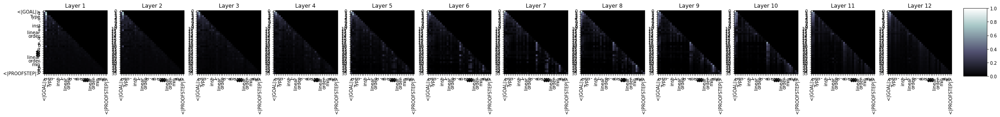

156799it [2:43:05, 15.64it/s]

  Step 156,800  of  157,103. Loss: 22.7114200592041.   Elapsed: 2:43:05.
>rw [← s, mul_mul_mul_eq_mul_mul_mul_mul_mul_mul_mul_eq_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_lt_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_eq_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_m
s -> 0.5867557525634766
rw -> 0.2618674337863922
apply -> 0.15137118101119995
ex -> 2.830428684319486e-06
have -> 2.3370741928374628e-06
t -> 2.588612062481843e-07
ref -> 8.677382368205144e-08
ext -> 8.114663785363518e-08
split -> 7.736039719929977e-08
{ -> 2.158719070166626e-08


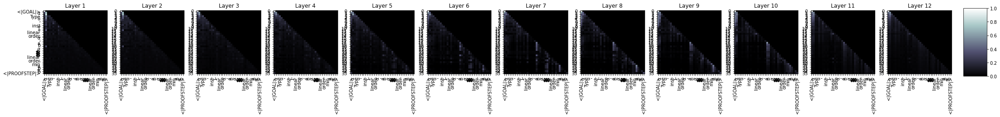

157103it [2:43:30, 16.01it/s]



  Average training loss: 17.56
  Training epoch took: 2:43:31

Running Validation...
  Validation Loss: 11.06
  Validation took: 0:02:42

======== Epoch 4 / 21 ========
Training...


3200it [03:12, 15.68it/s]

  Step 3,200  of  157,103. Loss: 8.49950122833252.   Elapsed: 0:03:12.
>apply_le_le_le_le_mul_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_mul_le_le_le_le_le_le_mul_le_le_le_le_le_le_le_mul_le_le_le_le_le_le_le_le_mul_le_of_le_le_le_le
apply -> 0.9941615462303162
rw -> 0.005730672273784876
s -> 0.00010572282189968973
ext -> 1.1849148222609074e-06
split -> 4.820548156203586e-07
have -> 4.0890557784223347e-07
{ -> 4.6129230213409755e-08
sim -> 2.5754827603918784e-08
ex -> 2.0207176376629832e-08
norm -> 1.1060883764457685e-08


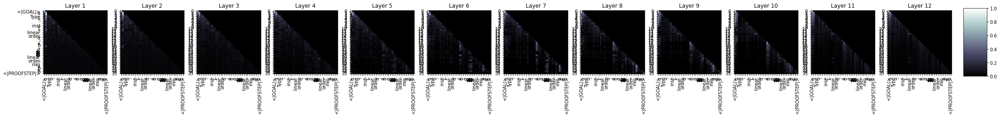

6399it [06:33, 17.16it/s]

  Step 6,400  of  157,103. Loss: 17.703227996826172.   Elapsed: 0:06:33.
>simp [h⟨⟨⟩, h⟨⟨⟩, h⟩, mul_inst_inst_eq_eq_eq_left_of_of_of_eq_eq_of_of_of_of_eq_eq_eq_of_eq_of_eq_of_eq_of_eq_eq_eq_of_of_of_of_of_of_iff_eq_of_eq_of_eq_of_of_of_eq_eq_of_of_eq_eq_of_of_of_eq_eq_of_of_of_eq_of_of_eq_of_of_eq_of_of_of_of_eq_of_of_eq_of_of_of_zero_inst_of_of_of_of_of_of_of_
s -> 0.979182779788971
rw -> 0.020423009991645813
sim -> 0.00020364020019769669
split -> 6.057554855942726e-05
have -> 4.841456757276319e-05
{ -> 4.4478576455730945e-05
apply -> 2.835136001522187e-05
ext -> 8.438582881353796e-06
cases -> 1.300982859220312e-07
ex -> 7.942683311057408e-08


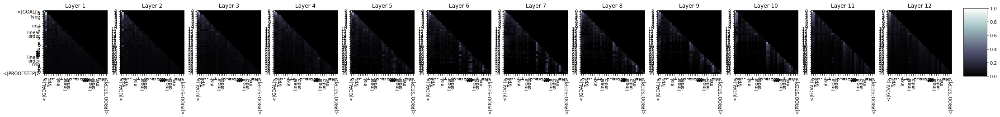

9600it [09:50, 15.63it/s]

  Step 9,600  of  157,103. Loss: 14.994532585144043.   Elapsed: 0:09:51.
>rw [h_le_instance_le_eq_le_le_eq_le_le_eq_le_eq_eq_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_one] } } } } } } } } } } } } } } } } } } } } } } } } } } } } } }
rw -> 0.8398211598396301
s -> 0.15948735177516937
apply -> 0.00068165228003636
have -> 9.109787242778111e-06
norm -> 4.059826892444107e-07
ext -> 2.633328222145792e-07
int -> 9.114852872471602e-08
sim -> 1.3053877978563833e-08
ind -> 1.362196355714218e-09
split -> 1.3431867840196787e-09


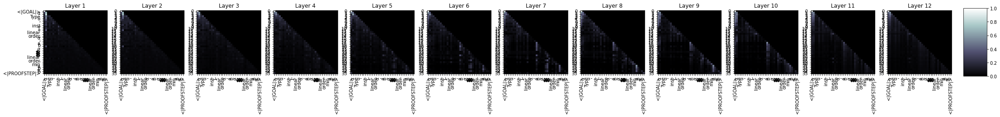

12799it [13:10, 17.07it/s]

  Step 12,800  of  157,103. Loss: 14.504997253417969.   Elapsed: 0:13:11.
>simp only [mul_add, mul_add_add, mul_le, mul_le, mul_eq_inst_le_le_space.mem_le_mem_le_add, mul_le, mul_inst_one] at h, mul_le_le_eq_le_eq_one] } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } }
s -> 0.9998610019683838
apply -> 7.251500937854871e-05
rw -> 6.514402048196644e-05
split -> 5.797737117063662e-07
sim -> 4.821882271244249e-07
have -> 1.6152145576597832e-07
re -> 1.329673580130475e-07
{ -> 1.04658672839264e-08
ext -> 1.9921342353512728e-09
rint -> 1.0607706935061856e-09


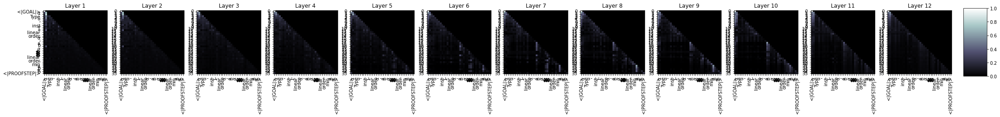

15999it [16:31, 15.17it/s]

  Step 16,000  of  157,103. Loss: 11.72463321685791.   Elapsed: 0:16:32.
>rw [← Sag_add, b c] } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } }
rw -> 0.4281129539012909
s -> 0.3091449439525604
ext -> 0.2174675017595291
ex -> 0.03770580515265465
apply -> 0.004892295692116022
split -> 0.0025096682365983725
sim -> 9.974962449632585e-05
int -> 6.092364128562622e-05
have -> 3.6549545257003047e-06
{ -> 2.451911768730497e-06


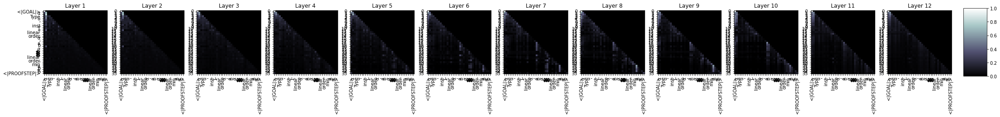

19200it [19:52, 15.06it/s]

  Step 19,200  of  157,103. Loss: 15.829779624938965.   Elapsed: 0:19:52.
>rw [← commission, mul_instance_add_eq_eq_eq_eq_eq_eq_le_top_eq_le_le_le_eq_eq_eq_le_mul_add_le_le_le_le_le_eq_le_le_mul_eq_le_le_eq_le_mul_eq_le_le_mul_le_mul_le_le_mul_le_mul_mul_le_mul_mul_mul_mul_mul_le_mul_mul_mul_le_le_le_le_le_mul_mul_mul_mul_mul_le_le_mul_mul_le_mul_mul_le_mul_mul_le_mul_mul_mul_
s -> 0.8082497715950012
rw -> 0.19152264297008514
apply -> 0.00020479346858337522
t -> 1.6894044165383093e-05
ext -> 5.080219125375152e-06
{ -> 5.169537757865328e-07
sim -> 3.668688748348359e-07
re -> 4.277903897786928e-08
have -> 3.093294509426414e-08
int -> 1.4198594300296463e-08


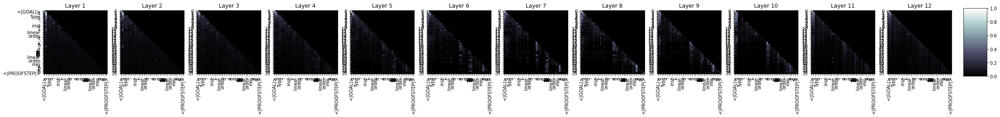

22400it [23:12, 15.77it/s]

  Step 22,400  of  157,103. Loss: 16.038625717163086.   Elapsed: 0:23:12.
>simp [← s, exact a, exact b, exact b, exact b, exact_inst_eq_inst_add_add, exact_inst_add_inst_add, mul_inst_1, exact_eq_inst_eq_add, exact_eq_top, exact_inst_inst_inst_t,_eq_le, exact_add_t, mul_add_inst_inst_inst_add, mul_add_add_eq_add_add_add, mul_add_of_zero_eq_add_add_inst_le_eq_2,_add_inst_eq_inst_top, exact_add_inst_top, exact_inst_zero]]_eq_add_eq_le_add_eq_zero_inst_eq_add_add_le_2, b, exact_le_top, exact_eq_inst_inst
s -> 0.9837313890457153
rw -> 0.01618868298828602
ex -> 4.2859061068156734e-05
t -> 3.354614455020055e-05
ext -> 2.244007646368118e-06
apply -> 1.0435762760607759e-06
have -> 2.688871063583065e-07
split -> 1.6127313529068488e-07
sim -> 3.34971161919384e-08
int -> 4.0303458348489585e-09


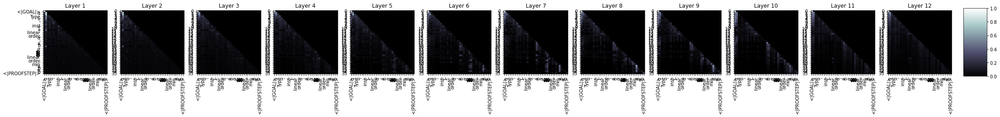

25600it [26:31, 15.93it/s]

  Step 25,600  of  157,103. Loss: 13.827801704406738.   Elapsed: 0:26:32.
>rw [h_eq_lt_le_add_eq_le_eq_eq_add_eq_le_one_eq_le_iff_le_eq_le_eq_le_le_le_le_one_one_of_le_of_le_le_le_le_of_one_le_one_le_le_le_le_le_of_le_le_mul_le_le_le_of_le_le_le_one_le_le_one_le_le_mul_mul_le_le_one_le_mul_one_le_le_le_le_le_mul_le_le_le_le_mul_le_one_one_le_mul_le_one_le_le_le_le_mul_one_le_one_le_one_
rw -> 0.9946509003639221
split -> 0.0024994707200676203
s -> 0.00233658030629158
apply -> 0.00023186700127553195
ex -> 0.00021331112657207996
t -> 4.520775473793037e-05
{ -> 1.2274539585632738e-05
re -> 5.059530394646572e-06
ref -> 4.678087407228304e-06
ext -> 7.441161073984404e-07


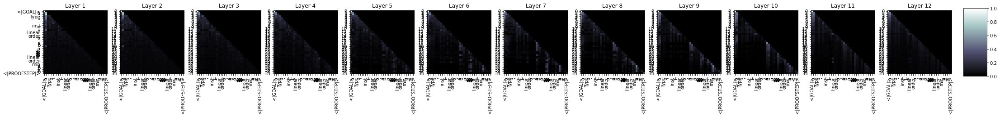

28800it [29:50, 15.86it/s]

  Step 28,800  of  157,103. Loss: 19.25387954711914.   Elapsed: 0:29:51.
>simpa [← b c] } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } }
sim -> 0.9473077654838562
ext -> 0.02265114150941372
s -> 0.01947547309100628
split -> 0.00663641607388854
rw -> 0.0030429193284362555
have -> 0.0005766276735812426
{ -> 0.0002729600528255105
ref -> 1.9273456928203814e-05
t -> 1.1854207514261361e-05
apply -> 5.6089379540935624e-06


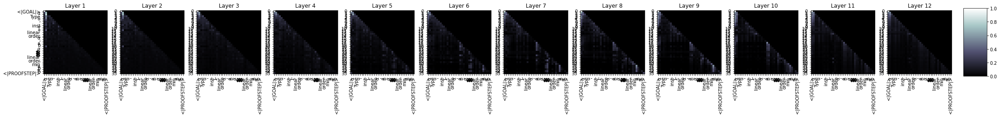

32000it [33:09, 16.54it/s]

  Step 32,000  of  157,103. Loss: 12.92793083190918.   Elapsed: 0:33:10.
>have h, mul_zero_le_le_le_of_eq_le_le_le_le_of_le_mul_le_le_mul_mul_le_le_mul_le_of_mul_of_mul_le_mul_mul_mul_mul_mul_mul_mul_mul_mul_le_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_
have -> 0.9949069619178772
ex -> 0.004867947660386562
s -> 0.0001980704109882936
ext -> 1.7366324755130336e-05
apply -> 5.694781975762453e-06
sim -> 2.5319652650068747e-06
rw -> 9.74559725364088e-07
split -> 3.921627467207145e-07
{ -> 5.936195890399176e-08
t -> 8.855670863283649e-09


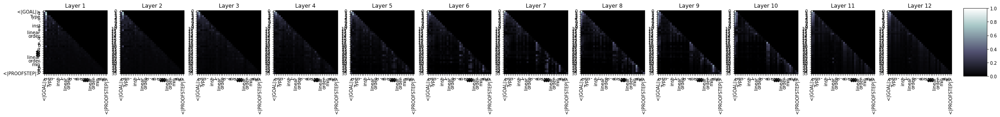

35199it [36:30, 16.58it/s]

  Step 35,200  of  157,103. Loss: 8.311483383178711.   Elapsed: 0:36:30.
>rw [h, mul_iff_iff_eq_iff_iff_eq_le_eq_iff_iff_iff_iff_le_iff_iff_iff_iff_eq_iff_iff_le_iff_iff_iff_iff_iff_iff_le_le_iff_iff_eq_iff_le_iff_iff_iff_le_eq_le_iff_iff_le_iff_iff_zero_iff_iff_iff_iff_iff_iff_iff_iff_iff_iff_iff_iff_le_iff_le_iff_iff_iff_iff_iff_iff_iff_iff_le_le_iff_mul_iff_zero, mul_iff_iff_le_iff_one_iff_eq_iff_le_le_iff_le_iff_iff_opol_iff_iff_iff_le_iff_iff
rw -> 0.990843653678894
s -> 0.00914221815764904
ext -> 7.887057108746376e-06
{ -> 3.652213308669161e-06
have -> 1.1049324939449434e-06
ex -> 1.0663877674232936e-06
sim -> 3.4358987477389746e-07
apply -> 1.3001066179185727e-07
ref -> 3.7861248358694866e-08
t -> 9.291474256656329e-09


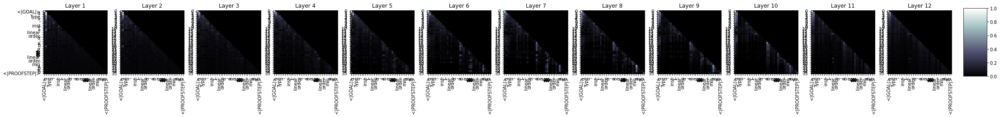

38400it [39:50, 16.47it/s]

  Step 38,400  of  157,103. Loss: 12.847350120544434.   Elapsed: 0:39:51.
>rw [← commission commission commission commission commission commission, h, exact_eq_eq_le_le_le_eq_eq_of_add_eq_eq_le_le_le_iff_eq_eq_le_iff_iff_le_le_eq_le_le_eq_le_le_eq_eq_eq_le_le_le_eq_le_le_le_le_le_le_le_eq_le_le_le_le_iff_eq_le_le_le_le_eq_eq_le_le_le_le_le_le_eq_le_le_eq_le_eq_le_eq_le_le_eq_le_measure_le_iff_eq_le_le_aux_le_le_le_le_le_of_le_contin_le_le_le_one_
rw -> 0.4857061803340912
s -> 0.4420246183872223
ext -> 0.03938726708292961
apply -> 0.02983991801738739
{ -> 0.0016226954758167267
t -> 0.0009660843061283231
have -> 0.00030188867822289467
sim -> 0.00012721962411887944
int -> 1.385191899316851e-05
ex -> 1.0164557352254633e-05


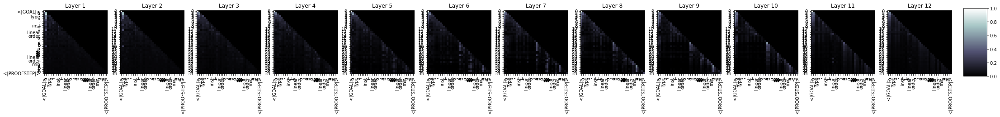

41600it [43:11, 15.45it/s]

  Step 41,600  of  157,103. Loss: 15.358418464660645.   Elapsed: 0:43:11.
>apply_eq_le_lt_iff_zero_eq_eq_mul_mul_mul_eq_mul_mul_mul_mul_mul_lt_mul_mul_mul_mul_le_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_aux_mul_mul_mul_mul_lt_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_
rw -> 0.7833054065704346
s -> 0.1578672081232071
apply -> 0.045681584626436234
sim -> 0.009658289141952991
ext -> 0.0022158438805490732
have -> 0.0007321754237636924
{ -> 0.0004709244822151959
t -> 3.1154344469541684e-05
int -> 2.0319592294981703e-05
split -> 1.7078858945751563e-05


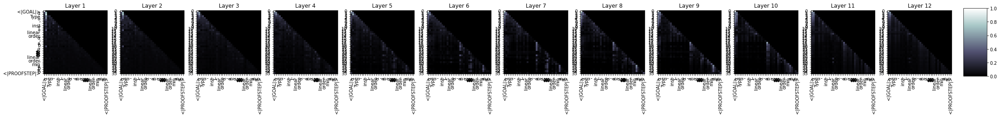

44800it [46:30, 16.25it/s]

  Step 44,800  of  157,103. Loss: 12.792113304138184.   Elapsed: 0:46:30.
>simp [←[set.simp [← b, mul_le_le_le_le_le_le_le_le_le_eq_le_le_le_le_le_le_le_of_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_of_le_le_le_le
s -> 0.7590154409408569
rw -> 0.2403373271226883
apply -> 0.0003241930971853435
{ -> 0.000322372856317088
have -> 5.805054570373613e-07
t -> 8.1674393470621e-08
sim -> 3.119203029200435e-08
ext -> 2.9999370099176303e-08
cases -> 1.3343355753647757e-08
ref -> 6.3447855858100866e-09


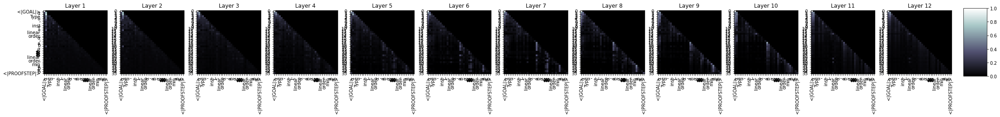

48000it [49:51, 16.43it/s]

  Step 48,000  of  157,103. Loss: 16.128314971923828.   Elapsed: 0:49:51.
>rw [←_iff_eq_iff_eq_eq_eq_eq_of_eq_eq_eq_iff_iff_iff_comm_eq_le_iff_eq_measure_nat_of_eq_eq_of_le_of_one_eq_iff_eq_of_one_of_one_le_iff_of_eq_one_of_of_of_one_one_of_eq_one_of_of_of_of_one] } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } }
rw -> 0.887494683265686
s -> 0.1124730184674263
{ -> 2.615849007270299e-05
have -> 6.1049245232425164e-06
sim -> 1.0820472517991675e-08
t -> 3.18139203869805e-09
ext -> 2.416500888280382e-10
apply -> 1.1974966851457935e-10
rc -> 1.5029765626506375e-11
by -> 1.142183656682727e-11


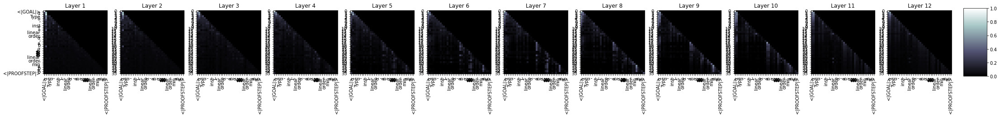

51199it [53:10, 17.35it/s]

  Step 51,200  of  157,103. Loss: 25.35696792602539.   Elapsed: 0:53:11.
>simp [h_iff_le_ 神_add_iff_eq_eq_le_eq_one_eq_one] } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } }
s -> 0.9998481273651123
rw -> 0.00013339515135157853
{ -> 1.8419954358250834e-05
t -> 5.974442718326145e-09
have -> 4.455894542232386e-10
int -> 9.431504882639885e-11
split -> 9.134774187069539e-11
apply -> 4.7013178072763395e-11
sim -> 3.601931253260915e-11
ext -> 3.2705754771100715e-11


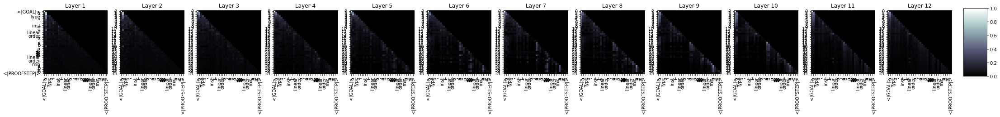

54399it [56:29, 15.36it/s]

  Step 54,400  of  157,103. Loss: 21.483375549316406.   Elapsed: 0:56:30.
>simp [← s, b, nat.I, mul_le_le_le_le_le_eq_le_le_iff_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_mul_le_le_le_le_le_le_mul_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le
s -> 1.0
apply -> 7.947459579327187e-09
int -> 5.609297470954289e-09
rw -> 3.750306731831188e-09
split -> 2.0179438120493387e-09
re -> 1.724419718129866e-09
{ -> 1.1789343945523e-09
have -> 6.631765692155511e-10
t -> 2.717770175575396e-10
ex -> 8.763694631097607e-12


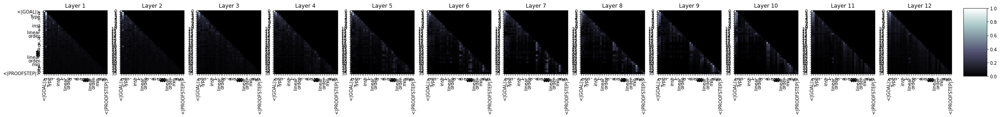

57600it [59:49, 17.09it/s]

  Step 57,600  of  157,103. Loss: 16.09446907043457.   Elapsed: 0:59:49.
>rw [←_iff_le_iff_le_iff_le_eq_le_le_le_eq_le_le_le_eq_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_of_iff_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le
s -> 0.6567593812942505
rw -> 0.334591269493103
apply -> 0.003947621677070856
t -> 0.0016468568937852979
{ -> 0.0016336793778464198
re -> 0.0014141122810542583
have -> 5.6803605730237905e-06
split -> 1.1940069271076936e-06
int -> 1.0812778583613181e-07
by -> 8.972182996558331e-08


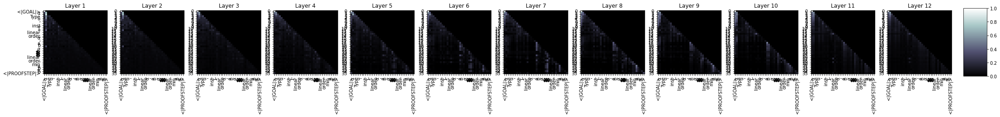

60799it [1:03:09, 17.47it/s]

  Step 60,800  of  157,103. Loss: 16.94362449645996.   Elapsed: 1:03:10.
>apply_dec_instance_instance_instance_eq_lt_le_add_eq_add_space_ benchmark_one_instance_one_zero_le_lt_eq_instance_le_le_lt_le_iff_one_of_le_of_of_le_iff_le_le_one_le_one] } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } }
apply -> 0.6944660544395447
rw -> 0.26866334676742554
s -> 0.022263534367084503
have -> 0.014578742906451225
t -> 1.843872269091662e-05
{ -> 6.72433134241146e-06
split -> 3.1389124615088804e-06
ext -> 3.0544757834150005e-08
re -> 1.0982099674095025e-08
by -> 4.4748720284815136e-09


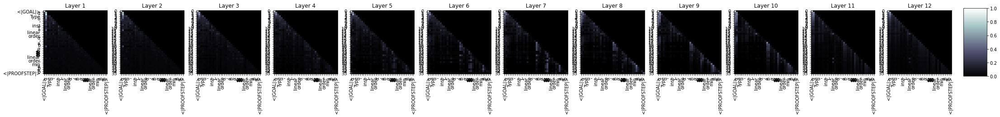

64000it [1:06:30, 15.75it/s]

  Step 64,000  of  157,103. Loss: 14.143414497375488.   Elapsed: 1:06:30.
>rw [← s.le_le_eq_le_le_zero_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_mul_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le
s -> 0.9143029451370239
rw -> 0.08537627011537552
split -> 0.00030656708986498415
apply -> 6.1565447140310425e-06
{ -> 5.5113282542151865e-06
have -> 2.281167553519481e-06
ext -> 8.736664369735081e-08
by -> 7.325084538933879e-08
sim -> 3.397318337761135e-08
t -> 2.2951484268673994e-08


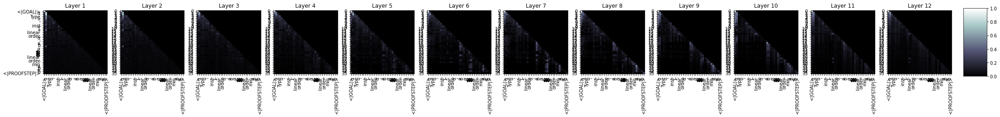

67199it [1:09:50, 17.82it/s]

  Step 67,200  of  157,103. Loss: 21.567733764648438.   Elapsed: 1:09:50.
>simp [← s, h, h, h_inst_lt_le_iff_lt_mul, h, h_inst_inst_lt_eq_lt_mul_lt_lt_mul_mul_mul_mul_mul_mul_mul_eq_mul_lt_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_lt_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_lt_mul_mul_mul_m
s -> 0.8982163667678833
rw -> 0.10170862078666687
have -> 6.813733489252627e-05
norm -> 2.5306796942459187e-06
split -> 2.0637319266825216e-06
sim -> 1.0870624009839958e-06
t -> 8.161809432749578e-07
int -> 1.7743639091349905e-07
apply -> 1.6480069575663947e-07
ext -> 6.450586198525343e-08


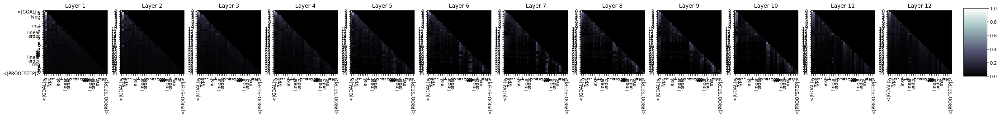

70400it [1:13:09, 15.71it/s]

  Step 70,400  of  157,103. Loss: 16.359500885009766.   Elapsed: 1:13:09.
>simp [← s, s.measure_eq_eq_eq_open_eq_eq_eq_eq_eq_iff_iff_eq_eq_eq_eq_eq_iff_mul_eq_eq_iff_mul_eq_mul, mul_eq_mul_eq_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_eq_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul] } } } } } } } } } } } } } } } } } } } } } } } } } } } } } }
s -> 0.9999943971633911
rw -> 4.808145604329184e-06
apply -> 8.166300631273771e-07
have -> 4.967752431639383e-09
{ -> 2.6961026744487526e-09
split -> 9.552714175242727e-10
ext -> 5.965952731834534e-10
sim -> 1.2389647641164458e-10
ex -> 2.104391660928684e-11
norm -> 1.2771865162686247e-11


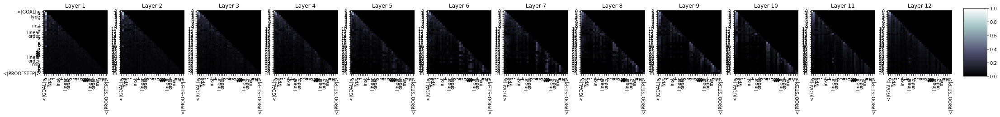

73600it [1:16:29, 15.60it/s]

  Step 73,600  of  157,103. Loss: 5.825804710388184.   Elapsed: 1:16:29.
>simp [h_add_add_iff_add_eq_eq_add_le_add_of_eq_le_mul_le_eq_eq_eq_mul_mul_mul_eq_mul_le_mul_mul_mul_mul_eq_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_mul_m
s -> 0.9997894167900085
rw -> 0.00021063044550828636
split -> 8.846936516704318e-09
apply -> 7.972198901029515e-09
ext -> 5.7121858354491906e-09
have -> 4.061128766608135e-09
ref -> 9.177865689657949e-10
sim -> 4.1332867684040764e-10
{ -> 3.33925415096914e-10
rc -> 8.786724126075285e-11


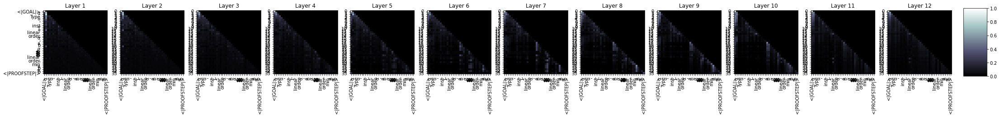

76800it [1:19:48, 16.31it/s]

  Step 76,800  of  157,103. Loss: 11.385250091552734.   Elapsed: 1:19:48.
>rw [←[R] at h, h, h, h, h, h, h, h : ∈ s, h : ⟩, h, h, h, h, h : ⟩, h, h : ⟩, h, h : ⟩, h, h, h : ⟩, h, h : ⟩, h, h, h, h : ⟩, h, h, h, h, h, h, h : ⟩, h, h, h : ⟩, h, h : ⟩, h, h, h : ⟩, h, h, h, h, h, h, h, h, h, h, h : ∈ h, h, h, h : ∩, h : ⟩, h, h, h, h : ∈ s, h, h, h : �
rw -> 0.9749965667724609
s -> 0.02499997802078724
apply -> 1.5195070091067464e-06
ext -> 1.1279272484898684e-06
have -> 6.49916955808294e-07
re -> 4.976719836236043e-08
t -> 4.110763640596815e-08
sim -> 1.6027637883553325e-08
split -> 1.587357800758582e-08
{ -> 1.2267554083678078e-08


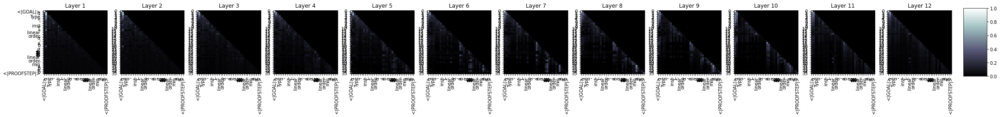

80000it [1:23:08, 16.69it/s]

  Step 80,000  of  157,103. Loss: 10.948113441467285.   Elapsed: 1:23:09.
>simp [←[R] } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } }
s -> 0.974925696849823
apply -> 0.01601075753569603
int -> 0.004706916864961386
rw -> 0.002859859261661768
ext -> 0.0013442090712487698
have -> 0.00010926460527116433
split -> 3.758780439966358e-05
sim -> 3.10059181174438e-06
{ -> 1.8566391872809618e-06
re -> 8.549940844204684e-07


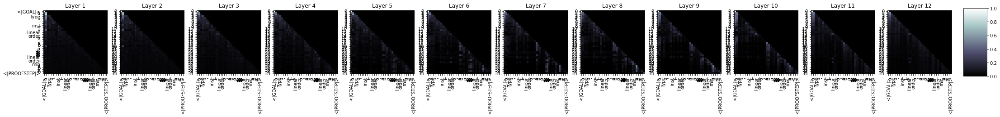

83200it [1:26:28, 16.22it/s]

  Step 83,200  of  157,103. Loss: 10.194097518920898.   Elapsed: 1:26:28.
>simp [←[R] } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } } },,,, simp,, exact_Inf,,, h,,,	h, h,, hh, h,	hh : ∈ set, h, hf : ∈, exact h : ∈ t, hhh : ⟩, h, h, h, hf : ∈ t, h, hf : �
s -> 0.5455858111381531
rw -> 0.4543817937374115
apply -> 2.9107395675964653e-05
{ -> 1.5733132840978215e-06
split -> 1.2189573226351058e-06
sim -> 4.781925326824421e-07
ext -> 1.6775951294789593e-08
ref -> 2.7456492635025143e-09
norm -> 2.2226123164159617e-09
have -> 1.8004620017109119e-09


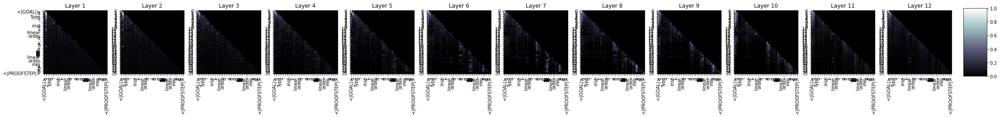

86399it [1:29:47, 16.02it/s]

  Step 86,400  of  157,103. Loss: 14.359235763549805.   Elapsed: 1:29:48.
>apply, nat.le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_le_
s -> 0.9870774745941162
apply -> 0.012921431101858616
{ -> 4.3249929149169475e-07
split -> 3.2767783864073863e-07
rw -> 1.7986525335800252e-07
ext -> 2.2677304478690985e-09
cases -> 1.445157105095518e-09
norm -> 8.927502070932292e-10
t -> 6.168585642285507e-10
int -> 4.291509092535506e-10


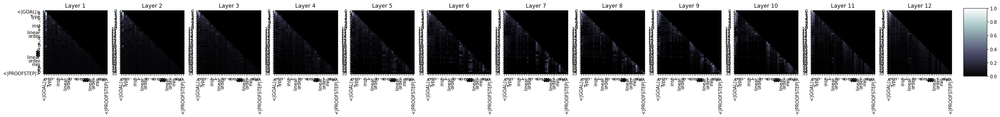

89600it [1:33:07, 16.66it/s]

  Step 89,600  of  157,103. Loss: 17.807430267333984.   Elapsed: 1:33:08.
>rw [←_add_add_add_le_add_le_le_le_le_le_eq_le_le_le_zero_le_le_mul_le_mul_le_le_le_le_le_le_le_le_le_le_le_le_le_mul_le_le_le_le_le_mul_le_le_le_le_le_le_le_le_le_le_le_le_mul_le_mul_mul_mul_le_le_le_le_mul_le_le_le_le_le_le_mul_mul_le_mul_mul_le_mul_mul_mul_mul_mul_mul_le_mul_mul_le_mul_mul_
rw -> 0.9985900521278381
s -> 0.0011214206460863352
split -> 0.00021736080816481262
{ -> 4.996148345526308e-05
apply -> 1.3862587366020307e-05
re -> 4.532223556452664e-06
ext -> 2.0785839751624735e-06
norm -> 4.901415877611726e-07
ref -> 9.94059874415143e-08
have -> 6.819308140393332e-08


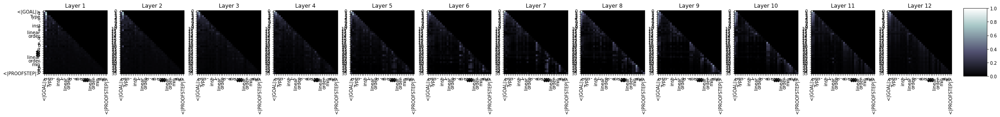

90160it [1:33:48, 17.46it/s]

In [ ]:
import regex as re

# Wandb manage model weights statistics 
wandb.watch(model)

total_t0 = time.time()
# training_stats = []
# min_val_loss = float('inf')

for epoch_i in range(current_epoch+1, epochs):

    # ========================================
    #               Training
    # ========================================

    print("")
    print('======== Epoch {:} / {:} ========'.format(epoch_i, epochs))
    print('Training...')
    
    t0 = time.time()
    model.train()
    total_train_loss = 0
    loss = 0
    for step, batch in tqdm(enumerate(train_dataloader)):
        
        b_input_ids = batch[0].to(device).unsqueeze(0) # Need to have 2 sizes
#         print(b_input_ids.shape)
#         print(enc.decode(b_input_ids.cpu().numpy()[0]))
        
#         b_labels = batch[0].to(device)
#         b_masks = batch[1].to(device)

        model.zero_grad()        
        outputs = model(b_input_ids,
                        lm_labels=b_input_ids,) 
#                           attention_mask=b_masks,)\
#         print(outputs)
#         raise
        loss = outputs[0] 
#         print(loss)
#         raise
        batch_loss = loss.item()
        total_train_loss += batch_loss
        loss /= gradient_acc_steps 
        
        # Attention table
        
        # Get sample every x batches.
        if (step/gradient_acc_steps) % sample_every == 0 and not step == 0:
            elapsed = format_time(time.time() - t0)
            print('  Step {:>5,}  of  {:>5,}. Loss: {:>5,}.   Elapsed: {:}.'.format(step, len(train_dataloader), batch_loss, elapsed))
            model.eval()
            
            # Generate a sample sequence
            context_text = " <|GOAL|>α : Type u,\n_inst_1 : linear_order α,\na b : α\n⊢ linear_order.min a b ≤ b <|PROOFSTEP|>" # Answer: 'min_tac a b'
            context_tokens = enc.encode(context_text)
            out = sample_sequence(
                model=model, length=200,
                context=context_tokens,
                batch_size=1,
                temperature=0.95, 
                top_k=50, device=device
            )
            out = out[:, len(context_tokens):].tolist()
            text = enc.decode(out[0])
            print(f">{text}")

            # Show attention table
            display_attn_and_confidence(model, context_text)
            
            model.train()
        
        # Update
        loss.backward()
        
        if (step+1) % gradient_acc_steps == 0 or (step + 1 == len(train_dataloader)):            
            optimizer.step()
            scheduler.step()
            wandb.log(
                {
                    "epoch": epoch_i,
                    'batch_loss': batch_loss
                }
            )
            # wandb log attention table
#             wandb.join()
        
    # Report training
    avg_train_loss = total_train_loss / len(train_dataloader)       
    training_time = format_time(time.time() - t0)
    print("")
    print("  Average training loss: {0:.2f}".format(avg_train_loss))
    print("  Training epoch took: {:}".format(training_time))
        
    # ========================================
    #               Validation
    # ========================================
    
    print("")
    print("Running Validation...")

    t0 = time.time()
    model.eval()
    total_eval_loss = 0
    nb_eval_steps = 0
    # Evaluate data for one epoch
    for batch in validation_dataloader:
        
        b_input_ids = batch[0].to(device).unsqueeze(0)
#         b_labels = batch[0].to(device)
#         b_masks = batch[1].to(device)  
        
        with torch.no_grad():        
            outputs  = model(b_input_ids, 
                             lm_labels=b_input_ids,) 
#                            token_type_ids=None, 
#                              attention_mask = b_masks,          
            loss = outputs[0]  
        batch_loss = loss.item()
        total_eval_loss += batch_loss        

    # Report validation
    avg_val_loss = total_eval_loss / len(validation_dataloader)
    if min_val_loss > avg_val_loss:
        min_val_loss = avg_val_loss
    validation_time = format_time(time.time() - t0)    
    print("  Validation Loss: {0:.2f}".format(avg_val_loss))
    print("  Validation took: {:}".format(validation_time))
    
    # Record all statistics from this epoch.
    training_stats.append(
        {
            'epoch': epoch_i + 1,
            'Training Loss': avg_train_loss,
            'Valid. Loss': avg_val_loss,
            'Training Time': training_time,
            'Validation Time': validation_time
        }
    )
    
    if save_model_on_epoch:
        # Save training stats
        with open(os.path.join(output_dir, "stats.json"), 'w') as f:
            json.dump(training_stats, f)
        # Save two files: current best model and current epoch model
        if avg_val_loss < min_val_loss:
            torch.save(
                model.state_dict(),
                os.path.join(output_dir, f"{output_prefix}-best.pt"),
            )
        torch.save(
            model.state_dict(),
            os.path.join(output_dir, f"{output_prefix}-{epoch_i}.pt"),
        )
        if epoch_i > 1:
            # Remove previous checkpoint
            os.remove(os.path.join(output_dir, f"{output_prefix}-{epoch_i-1}.pt"))

print("")
print("Training complete!")
print("Total training took {:} (h:mm:ss)".format(format_time(time.time()-total_t0)))
type(model) == GPT2LMHeadModel

In [ ]:
# Need to generate lyrics for test set, get loss, evaluate on persplexity, bleu and rougev 
# Want to see model's confidence knowing context as well -> attention 

In [ ]:
# Need to check if exists directory, if no, try to create
# Try save a dummy model and delete it
# These checks are done at the start of notebook
# Resume: Check if the directory has a checkpoint

In [ ]:
# config = GPT2Config()
# model = GPT2LMHeadModel(config)
model, current_epoch, min_val_loss, training_stats = load_checkpoint(model, output_dir, output_prefix)

In [ ]:
def print_nested_tuple(x):
    if type(x) == tuple:
        print(len(x))
        for y in x:
            print_nested_tuple(y)
    else:
        print(x.shape)

In [ ]:
# ========================================
#               Test
# ========================================

length = 20
temperature=0.7
top_k=40
model.cuda()

print("")
print("Running Test...")

t0 = time.time()
model.eval()
total_eval_loss = 0
contexts = []
true_lyrics = []
generated_lyrics = []
# Evaluate data for one epoch
for i, batch in tqdm(enumerate(test_dataloader)):
#     print(batch.shape)
    
#     if i % 1 == 0:
#         print(f"{i}/{len(test_dataloader)}")
    
    b_input_ids = batch.to(device).view(batch_size, -1)
#     print(b_input_ids.shape)
#         b_labels = batch[0].to(device)
#         b_masks = batch[1].to(device)  

    context = b_input_ids[:,:-length].view(batch_size, -1)
    prev = context
    output = context
    past = None
    with torch.no_grad():   
        # Generate text
        for i in range(length):
            try:
                logits, past = model(prev, 
                                 past=past)
            except:
                print(b_input_ids.shape)
                raise
#             print(logits.shape)
            logits = logits[:, -1, :] / temperature
            logits = top_k_logits(logits, k=top_k)
            log_probs = F.softmax(logits, dim=-1)
#             if sample:
            prev = torch.multinomial(log_probs, num_samples=1)
#             else:
#                 _, prev = torch.topk(log_probs, k=1, dim=-1)
            output = torch.cat((output, prev), dim=1)
          
        # Find loss
        loss, _, _  = model(b_input_ids, 
                         lm_labels=b_input_ids,)
    
    batch_loss = loss.item()
    total_eval_loss += batch_loss
    
    output = output[:, len(context):].tolist()
    text = enc.decode(output[0])
#     print(f"{context}\n->{text}")
    
    contexts.append(enc.decode(list(context[0].cpu().numpy())))
    true_lyrics.append(enc.decode(list(batch.view(-1).cpu().numpy())[-length:]))
    generated_lyrics.append(text)
    
#     print(f"Outputs have {len(outputs)} items:\noutputs[0]={outputs[0]}\noutputs[1]={outputs[1].shape}\noutputs[2]={[x.shape for x in outputs[2]]}")
#     if i >= 3:
#         break
    
# Report validation
avg_test_loss = total_eval_loss / len(test_dataloader)
test_time = format_time(time.time() - t0)    
print("  Test Loss: {0:.2f}".format(avg_test_loss)) #2.25
print("  Test took: {:}".format(test_time))
len(contexts), len(true_lyrics), len(generated_lyrics)

In [ ]:
contexts[7]+"|||"+true_lyrics[7], contexts[7]+"|||"+generated_lyrics[7]

In [ ]:
# #Finish the sentences when there is a point, remove after that
final=[]

for i in range(len(true_lyrics)):
    to_remove = generated_lyrics[i].split('.')[-1]
    final.append(generated_lyrics[i].replace(to_remove,''))

# test_set['Generated_lyrics'] = final
# test_set.head()

In [ ]:
#Using BLEU score to compare the real sentences with the generated ones
import statistics
from nltk.translate.bleu_score import sentence_bleu

scores=[]

for i in range(len(true_lyrics)):
    reference = [true_lyrics[i]]
    candidate = final[i]
    scores.append(sentence_bleu(reference, candidate))

statistics.mean(scores)

In [ ]:
#Rouge score
from rouge import Rouge
rouge=Rouge()

rouge.get_scores(final, true_lyrics, avg=True, ignore_empty=True)

In [ ]:
# from torch.utils.data import DataLoader
# from torch.utils.data import RandomSampler, SequentialSampler

# # Create the DataLoaders for our datasets.
# # We'll take training samples in random order. 
# train_dataloader = DataLoader(
#             train_dataset,  # The training samples.
#             sampler = RandomSampler(train_dataset), # Select batches randomly
#             batch_size = batch_size # Trains with this batch size.
#         )
# # For validation and test the order doesn't matter, so we'll just read them sequentially.
# validation_dataloader = DataLoader(
#             val_dataset, # The validation samples.
#             sampler = SequentialSampler(val_dataset), # Pull out batches sequentially.
#             batch_size = batch_size # Evaluate with this batch size.
#         )
# test_dataloader = DataLoader(
#             test_dataset, # The validation samples.
#             sampler = SequentialSampler(test_dataset), # Pull out batches sequentially.
#             batch_size = batch_size # Evaluate with this batch size.
#         )

In [ ]:
# Each entry of the matrix is a row in attention table (for wandb logging)
        # Log wandb
#         columns=["s_ind", "t_ind", "s_word", "t_word", "attn"]
#         attn_table = wandb.Table(columns=columns)
#         temp = context_text.split(" ")
#         for s_ind in range(seq_len):
#                 attn_table.add_data(s_ind, t_ind, temp[s_ind], temp[t_ind], attn_maps[row][column][0][s_ind][t_ind])
#         wandb.log({"attn_table": attn_table})